In [8]:
import prior

dataset = prior.load_dataset("procthor-10k")
dataset

[AI2-THOR WARNING] There has been an update to ProcTHOR-10K that must be used with AI2-THOR version 5.0+. To use the new version of ProcTHOR-10K, please update AI2-THOR to version 5.0+ by running:
    pip install --upgrade ai2thor
Alternatively, to downgrade to the old version of ProcTHOR-10K, run:
   prior.load_dataset("procthor-10k", revision="ab3cacd0fc17754d4c080a3fd50b18395fae8647")


Loading test: 100%|██████████| 1000/1000 [00:00<00:00, 12066.47it/s]


DatasetDict(
    train=Dataset(
    dataset=procthor-dataset,
    size=10000,
    split=train
),
    val=Dataset(
    dataset=procthor-dataset,
    size=1000,
    split=val
),
    test=Dataset(
    dataset=procthor-dataset,
    size=1000,
    split=test
)
)

In [9]:
from ai2thor.controller import Controller


house = dataset["train"][3]
controller = Controller(scene=house, snapToGrid=False, rotateStepDegrees=30)
event = controller.step("Pass")
spawn = event.metadata["agent"]["position"]

/home/juyuanli/miniconda3/envs/nav_assistant/lib/python3.11/site-packages/ai2thor/platform.py:154: UserWarning: could not connect to X Display: 5, Can't connect to display ":5": b'Authorization required, but no authorization protocol specified\n'
  warnings.warn(


In [10]:
import numpy as np
def teleport(controller, target=None):
    event = controller.step("GetReachablePositions")
    reachable_positions = event.metadata["actionReturn"]
    # Pick a random target
    if target is None:
        target = np.random.choice(reachable_positions)

    event = controller.step(
        action="TeleportFull",
        x=target["x"],
        y=target["y"],
        z=target["z"],
        rotation={"x": 0, "y": 0, "z": 0},
        horizon=0,
        standing=True
    )

    return event


In [11]:
from rl import PPO, ActorCritic, Env, RolloutBuffer, ClipEnv, CLIPNovelty
from models import LSTMActor, LSTMCritic, FrozenResNetEncoder, SlidingWindowTransformerActor, SlidingWindowTransformerCritic, SmallCNNEncoder
from cons import MINIBATCHES, EPISODE_STEPS, FEAT_DIM, NUM_ACTIONS, DEVICE

In [12]:
import torch
import matplotlib.pyplot as plt
from rl import save_actor_critic

def train(controller, name: str, ppo: PPO, env: Env, actor_critic: ActorCritic, total_updates=10):
    event = controller.step("Pass")  # prime
    rewards = []
    episode_rewards = []
    for upd in range(total_updates):
        buf = RolloutBuffer()
        for mb in range(MINIBATCHES):
            # collect episodes
            episode_seq = []
            episode_reward = 0
            actions_seq = []
            for t in range(1, EPISODE_STEPS + 1):
                with torch.no_grad():
                    obs_t = ppo.obs_from_event(event)  # (C,H,W)
                    obs_encoded = actor_critic.actor_critic_encoder(obs_t.unsqueeze(0).unsqueeze(0)).squeeze(0).squeeze(0) # (D)
                    obs_seq = torch.stack(episode_seq + [obs_encoded], dim=0).to(device=DEVICE)

                if len(actions_seq) == 0:
                    actions_seq.append(torch.randint(0, NUM_ACTIONS, (1, 1)).item())
                
                actions_tensor = torch.tensor(actions_seq, dtype=torch.long, device=DEVICE)
                logits, value = ppo.act_and_value(obs_seq, actions_tensor, actor_critic)
                dist = torch.distributions.Categorical(logits=logits)
                action_idx = dist.sample()
                logp = dist.log_prob(action_idx)
                
                action_idx, logp = action_idx.item(), logp.item()
                event, reward = env.step_env(controller, action_idx)
                done = t == EPISODE_STEPS

                # store one step
                buf.add(obs_t, action_idx, logp, reward, value, done)
                episode_seq.append(obs_encoded)
                rewards.append(reward)
                actions_seq.append(action_idx)
                
                episode_reward += reward / EPISODE_STEPS

                # 50% chance of teleport
                if done:
                    env.reset()
                    if np.random.rand() > 0.5:
                        event = teleport(controller)
            episode_rewards.append(episode_reward)
                
        ppo.ppo_update(buf, actor_critic)
        if (upd + 1) % 10 == 0:
            save_actor_critic(actor_critic, f"chkpoint_{upd}.pt")
        save_actor_critic(actor_critic, name)
        
        print(f"Update {upd+1}/{total_updates} — steps: {len(buf)}")
        plt.plot(rewards)
        plt.show()
        plt.plot(episode_rewards)
        plt.show()
    return buf, rewards

In [13]:
ENTROPY_COEF = 0.05

ppo = PPO(ENTROPY_COEF)
encoder = SmallCNNEncoder(FEAT_DIM)
actor = SlidingWindowTransformerActor(FEAT_DIM, NUM_ACTIONS)
critic = SlidingWindowTransformerCritic(FEAT_DIM)
clip_novelty = CLIPNovelty()
clip_env = ClipEnv(clip_novelty)
clip_actor_critic = ActorCritic(encoder, actor, critic)


[PPO] Epoch 0: Loss=92.9267, Policy=0.0026, Value=185.9533
[PPO] Epoch 10: Loss=92.0372, Policy=0.0711, Value=184.0215
[PPO] Epoch 20: Loss=80.5428, Policy=0.1806, Value=160.8216
[PPO] Epoch 30: Loss=68.4711, Policy=0.0082, Value=137.0303
Approx KL Learned: 0.07087837159633636
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 1/100 — steps: 2048


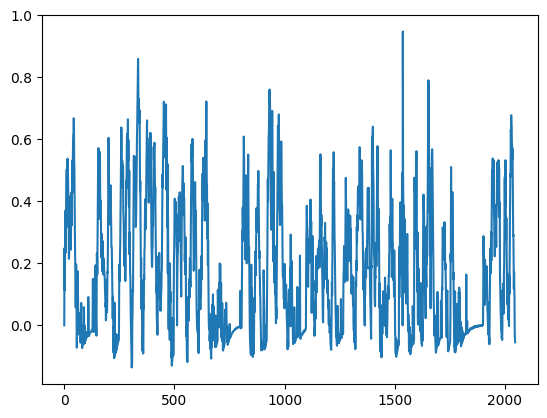

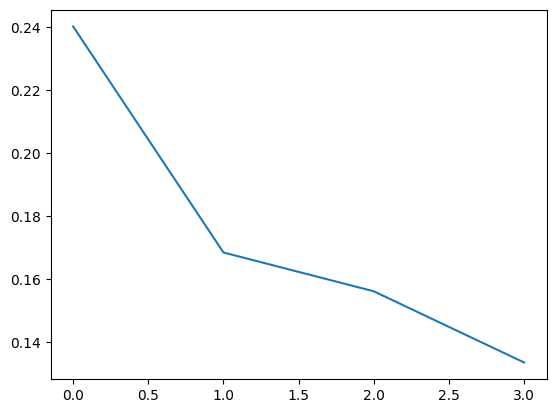

[PPO] Epoch 0: Loss=67.4492, Policy=0.0038, Value=134.9864
[PPO] Epoch 10: Loss=58.5277, Policy=0.0081, Value=117.1377
[PPO] Epoch 20: Loss=53.2128, Policy=0.0005, Value=106.5212
[PPO] Epoch 30: Loss=42.1698, Policy=0.0042, Value=84.4266
Approx KL Learned: 0.01246066577732563
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 2/100 — steps: 2048


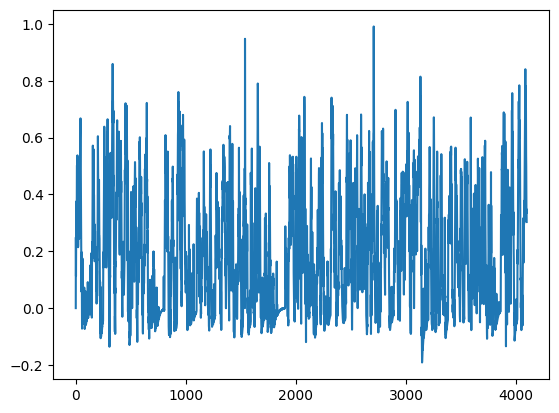

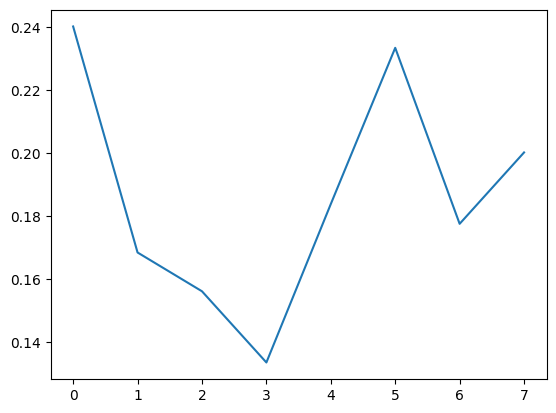

[PPO] Epoch 0: Loss=78.0340, Policy=-0.0003, Value=156.1657
[PPO] Epoch 10: Loss=58.0498, Policy=0.0045, Value=116.1889
[PPO] Epoch 20: Loss=49.9153, Policy=0.0009, Value=99.9260
[PPO] Epoch 30: Loss=44.7655, Policy=-0.0042, Value=89.6350
Approx KL Learned: 0.01689886674284935
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 3/100 — steps: 2048


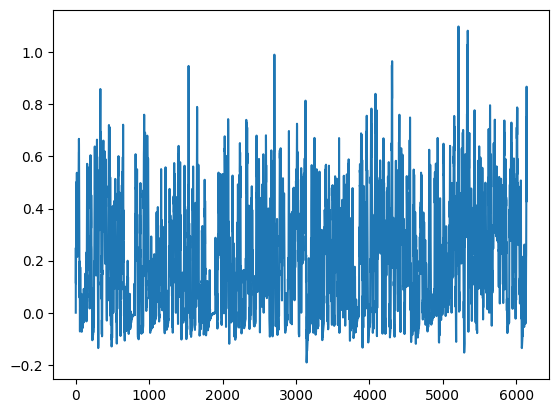

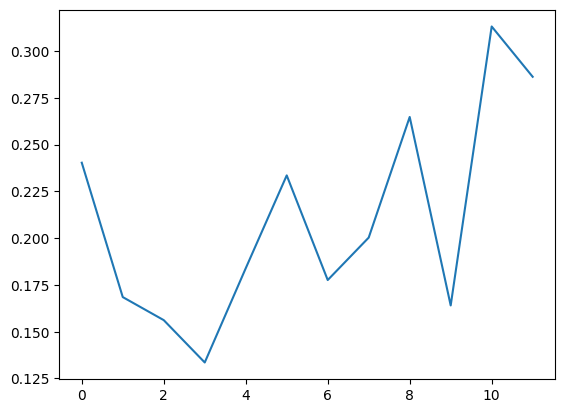

[PPO] Epoch 0: Loss=98.0441, Policy=0.0011, Value=196.1856
[PPO] Epoch 10: Loss=50.8670, Policy=-0.0009, Value=101.8316
[PPO] Epoch 20: Loss=44.3373, Policy=-0.0062, Value=88.7810
[PPO] Epoch 30: Loss=35.6188, Policy=-0.0059, Value=71.3463
Approx KL Learned: 0.011281766928732395
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 4/100 — steps: 2048


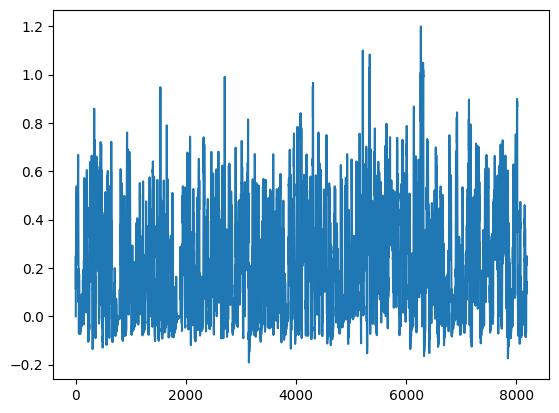

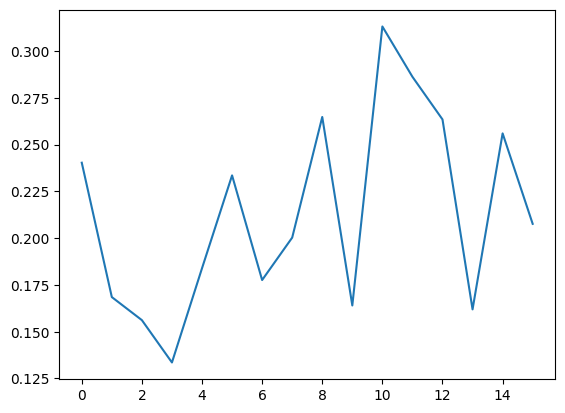

[PPO] Epoch 0: Loss=71.8343, Policy=0.0056, Value=143.7515
[PPO] Epoch 10: Loss=50.5651, Policy=-0.0001, Value=101.2230
[PPO] Epoch 20: Loss=25.9681, Policy=0.0040, Value=52.0273
[PPO] Epoch 30: Loss=22.9589, Policy=-0.0032, Value=46.0181
Approx KL Learned: 0.018000824376940727
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 5/100 — steps: 2048


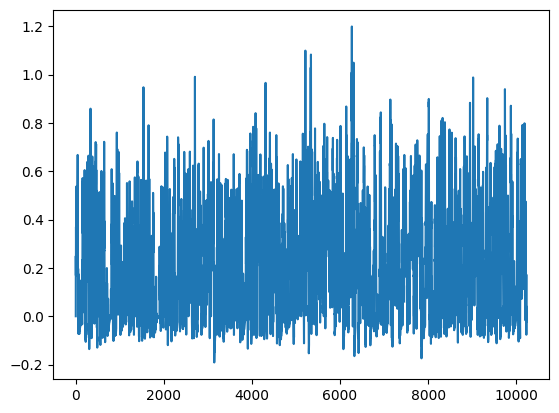

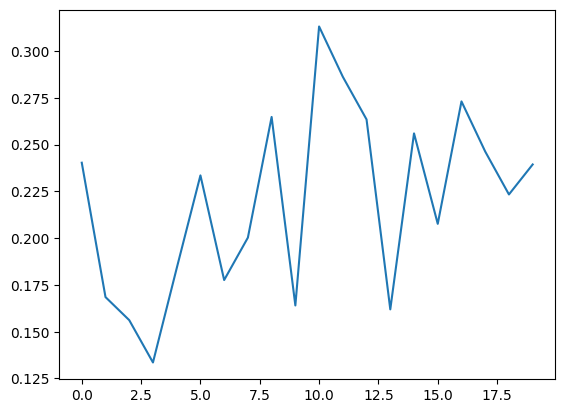

[PPO] Epoch 0: Loss=109.9232, Policy=-0.0008, Value=219.9401
[PPO] Epoch 10: Loss=45.1333, Policy=0.0028, Value=90.3498
[PPO] Epoch 20: Loss=37.7992, Policy=-0.0047, Value=75.6952
[PPO] Epoch 30: Loss=32.1646, Policy=-0.0125, Value=64.4454
Approx KL Learned: 0.017926696687936783
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 6/100 — steps: 2048


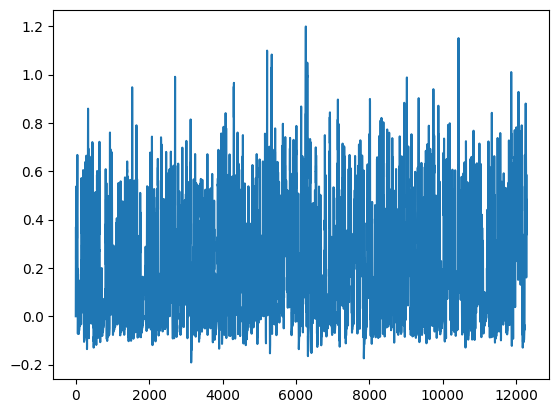

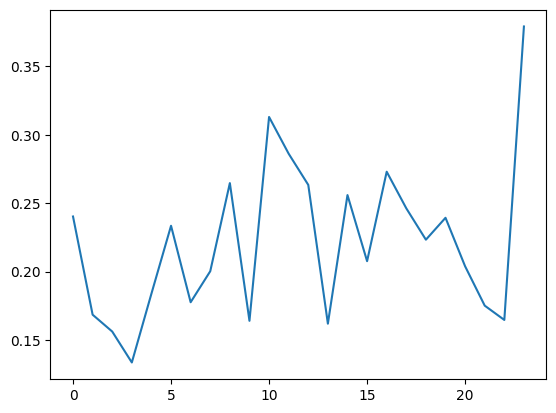

[PPO] Epoch 0: Loss=65.4270, Policy=0.0009, Value=130.9462
[PPO] Epoch 10: Loss=36.6733, Policy=0.0045, Value=73.4274
[PPO] Epoch 20: Loss=23.2621, Policy=0.0013, Value=46.6153
[PPO] Epoch 30: Loss=17.3438, Policy=-0.0098, Value=34.8023
Approx KL Learned: 0.036089301109313965
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 7/100 — steps: 2048


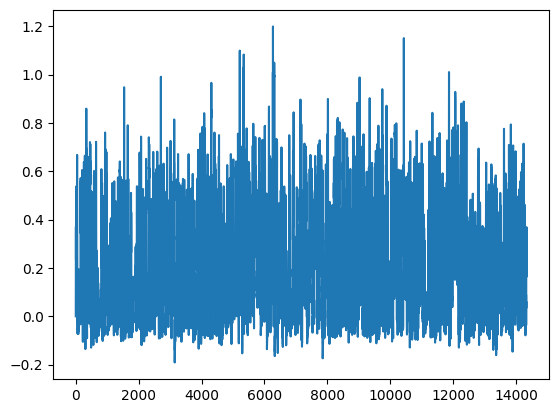

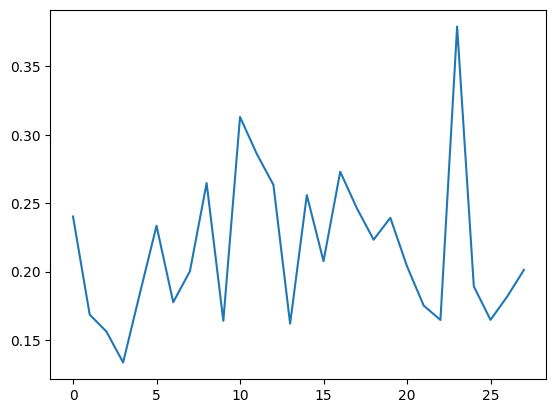

[PPO] Epoch 0: Loss=68.5740, Policy=-0.0002, Value=137.2376
[PPO] Epoch 10: Loss=25.7921, Policy=0.0048, Value=51.6637
[PPO] Epoch 20: Loss=17.1439, Policy=-0.0086, Value=34.3890
[PPO] Epoch 30: Loss=14.5233, Policy=-0.0021, Value=29.1405
Approx KL Learned: 0.019158612936735153
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 8/100 — steps: 2048


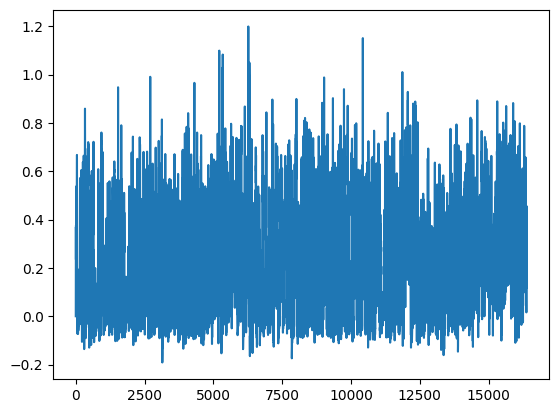

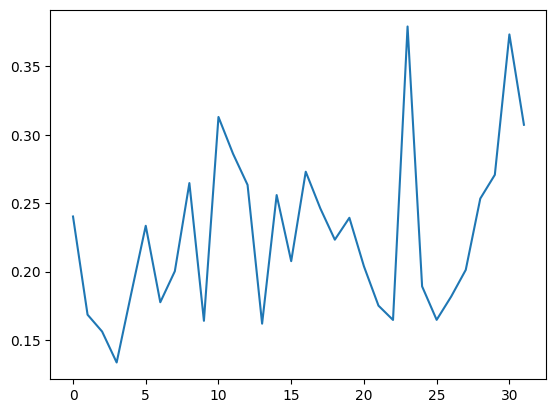

[PPO] Epoch 0: Loss=61.8356, Policy=0.0016, Value=123.7528
[PPO] Epoch 10: Loss=17.9999, Policy=-0.0074, Value=36.0952
[PPO] Epoch 20: Loss=9.5733, Policy=-0.0164, Value=19.2604
[PPO] Epoch 30: Loss=7.7525, Policy=-0.0323, Value=15.6469
Approx KL Learned: 0.0377671904861927
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 9/100 — steps: 2048


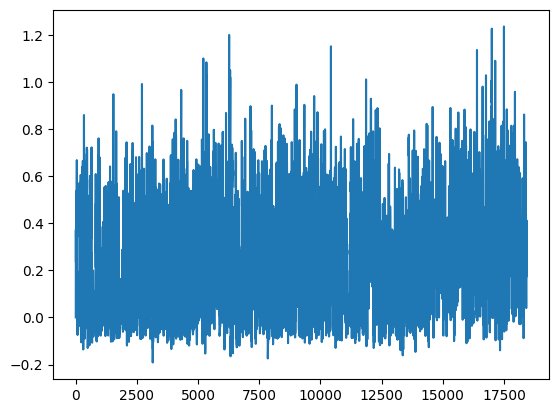

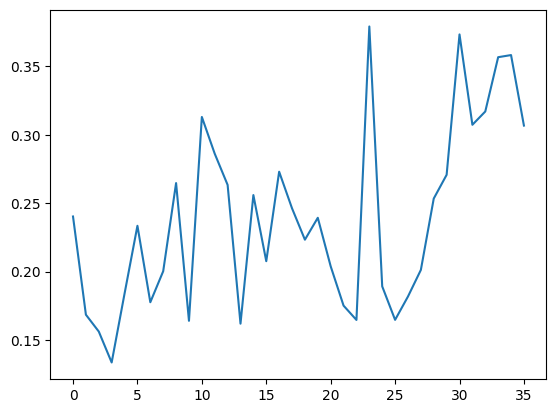

[PPO] Epoch 0: Loss=71.6043, Policy=0.0018, Value=143.2755
[PPO] Epoch 10: Loss=15.1736, Policy=0.0099, Value=30.3898
[PPO] Epoch 20: Loss=13.6720, Policy=-0.0016, Value=27.4277
[PPO] Epoch 30: Loss=8.1843, Policy=-0.0266, Value=16.4949
Approx KL Learned: 0.04975805804133415
[✅] Actor-Critic checkpoint saved to chkpoint_9.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 10/100 — steps: 2048


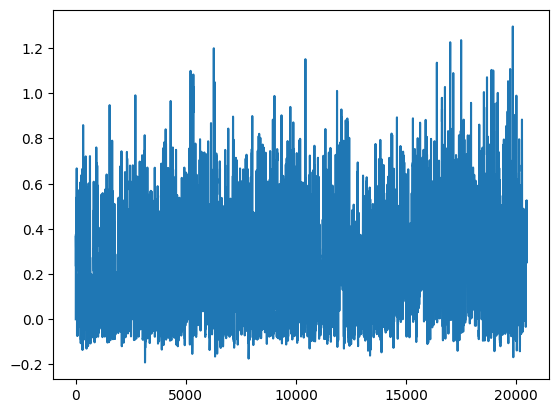

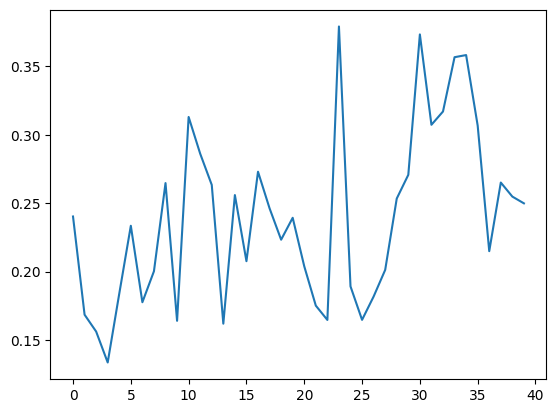

[PPO] Epoch 0: Loss=64.5847, Policy=-0.0018, Value=129.2424
[PPO] Epoch 10: Loss=18.8625, Policy=0.0048, Value=37.7884
[PPO] Epoch 20: Loss=13.4963, Policy=0.0189, Value=27.0316
[PPO] Epoch 30: Loss=10.5316, Policy=-0.0035, Value=21.1349
Approx KL Learned: 0.03285427391529083
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 11/100 — steps: 2048


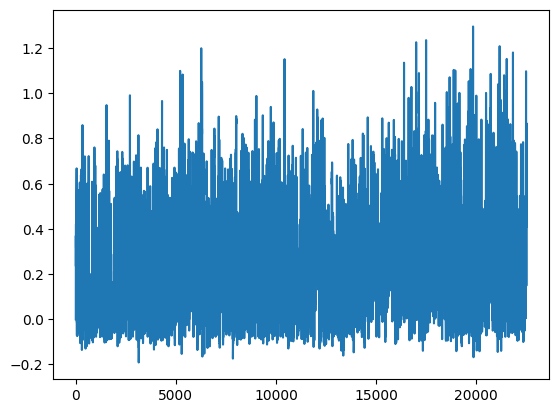

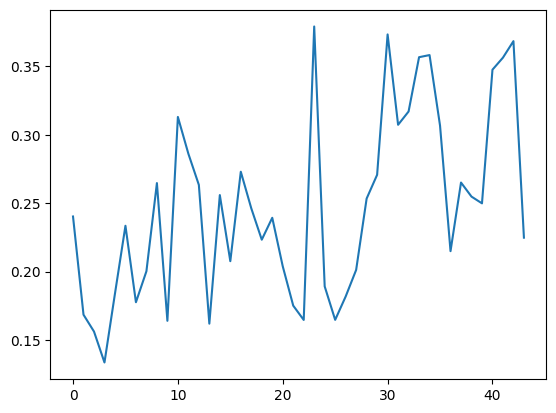

[PPO] Epoch 0: Loss=61.4529, Policy=-0.0008, Value=122.9996
[PPO] Epoch 10: Loss=21.2446, Policy=0.0002, Value=42.5787
[PPO] Epoch 20: Loss=13.2682, Policy=-0.0018, Value=26.6266
[PPO] Epoch 30: Loss=10.4419, Policy=-0.0092, Value=20.9911
Approx KL Learned: 0.022031817585229874
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 12/100 — steps: 2048


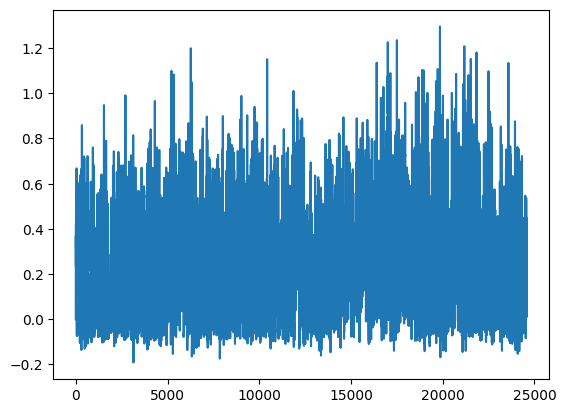

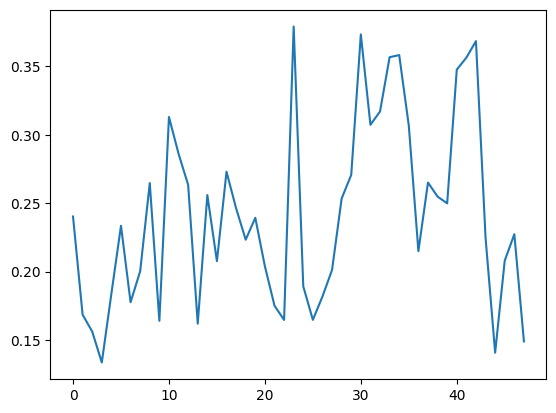

[PPO] Epoch 0: Loss=66.2510, Policy=0.0008, Value=132.5834
[PPO] Epoch 10: Loss=30.1700, Policy=-0.0006, Value=60.4200
[PPO] Epoch 20: Loss=22.5322, Policy=0.0017, Value=45.1352
[PPO] Epoch 30: Loss=22.5484, Policy=-0.0051, Value=45.1850
Approx KL Learned: 0.026440300047397614
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 13/100 — steps: 2048


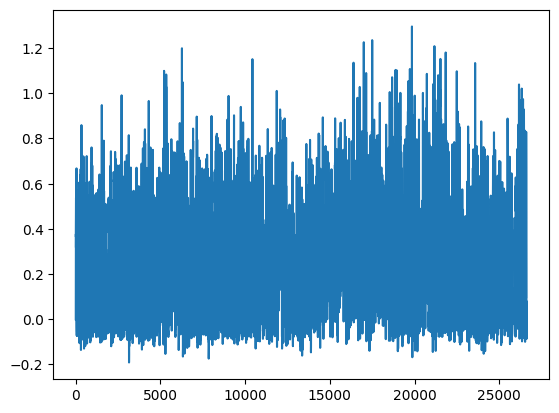

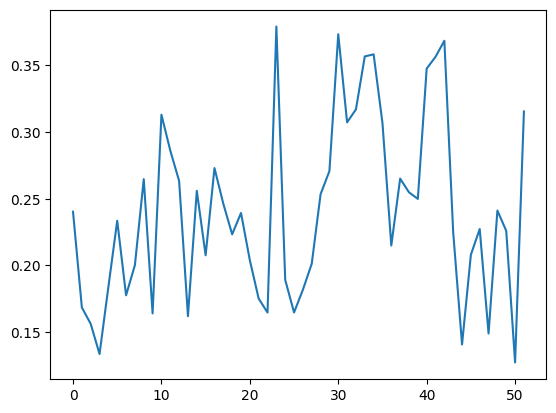

[PPO] Epoch 0: Loss=72.6239, Policy=-0.0000, Value=145.3092
[PPO] Epoch 10: Loss=25.4168, Policy=-0.0026, Value=50.9095
[PPO] Epoch 20: Loss=15.1271, Policy=-0.0162, Value=30.3484
[PPO] Epoch 30: Loss=13.4021, Policy=-0.0330, Value=26.9329
Approx KL Learned: 0.04598284512758255
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 14/100 — steps: 2048


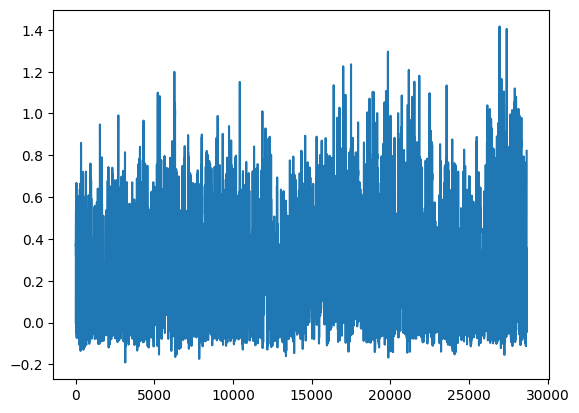

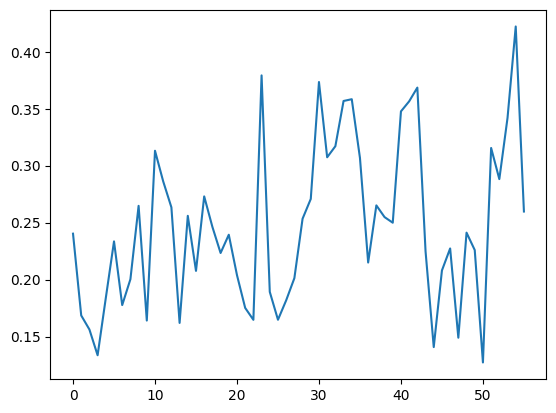

[PPO] Epoch 0: Loss=55.7869, Policy=0.0053, Value=111.6396
[PPO] Epoch 10: Loss=9.2097, Policy=-0.0034, Value=18.5053
[PPO] Epoch 20: Loss=7.3835, Policy=-0.0117, Value=14.8610
[PPO] Epoch 30: Loss=5.0440, Policy=-0.0190, Value=10.1990
Approx KL Learned: 0.021142950281500816
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 15/100 — steps: 2048


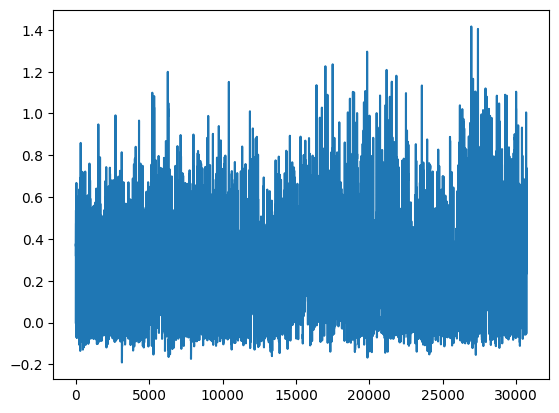

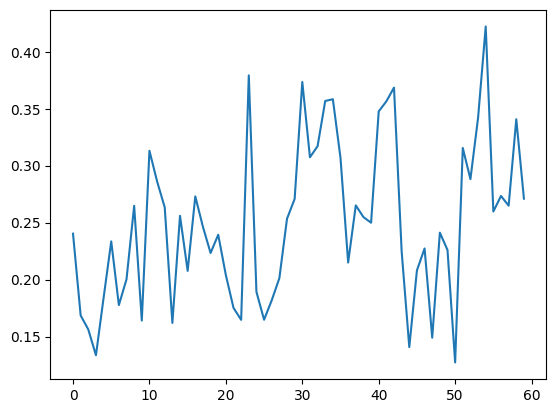

[PPO] Epoch 0: Loss=67.7039, Policy=0.0022, Value=135.4724
[PPO] Epoch 10: Loss=16.3869, Policy=-0.0020, Value=32.8511
[PPO] Epoch 20: Loss=8.8043, Policy=-0.0194, Value=17.7137
[PPO] Epoch 30: Loss=7.4164, Policy=-0.0369, Value=14.9745
Approx KL Learned: 0.06666918843984604
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 16/100 — steps: 2048


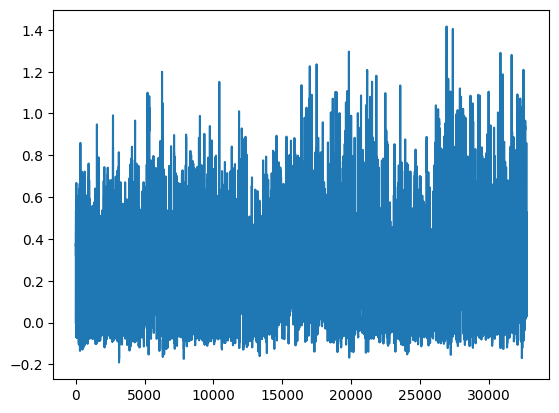

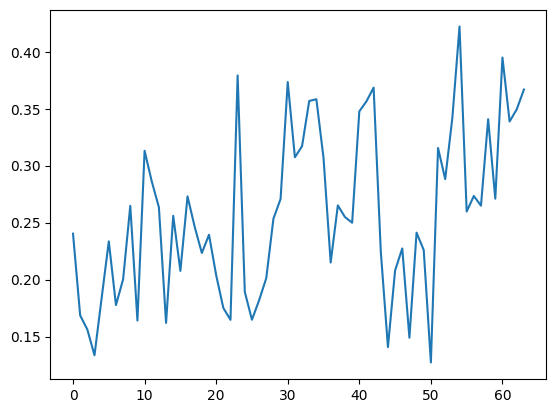

[PPO] Epoch 0: Loss=76.9386, Policy=0.0007, Value=153.9389
[PPO] Epoch 10: Loss=20.1817, Policy=0.0156, Value=40.3877
[PPO] Epoch 20: Loss=8.9247, Policy=-0.0264, Value=17.9663
[PPO] Epoch 30: Loss=7.3105, Policy=-0.0352, Value=14.7642
Approx KL Learned: 0.07219574600458145
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 17/100 — steps: 2048


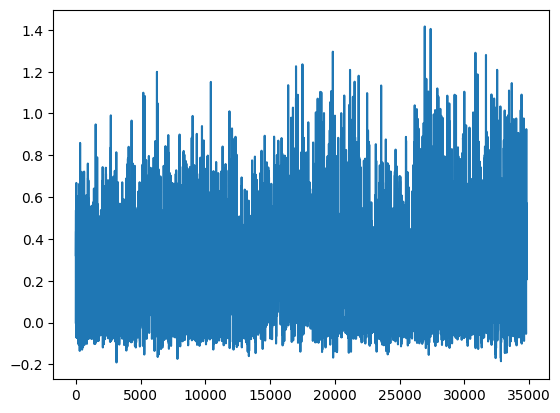

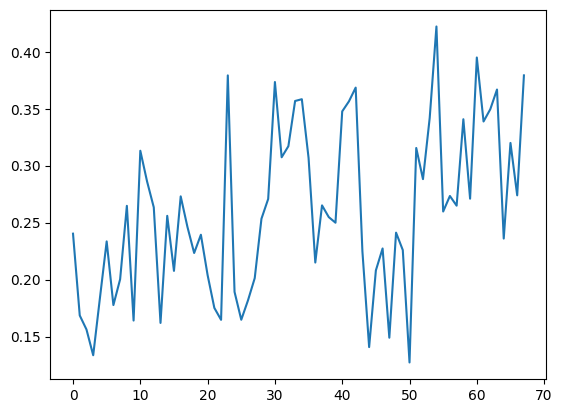

[PPO] Epoch 0: Loss=91.9345, Policy=0.0047, Value=183.9236
[PPO] Epoch 10: Loss=17.5605, Policy=0.0003, Value=35.1912
[PPO] Epoch 20: Loss=8.2759, Policy=-0.0170, Value=16.6473
[PPO] Epoch 30: Loss=6.2571, Policy=-0.0385, Value=12.6546
Approx KL Learned: 0.06529082357883453
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 18/100 — steps: 2048


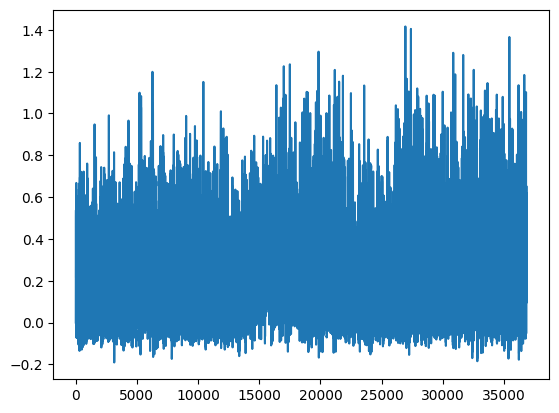

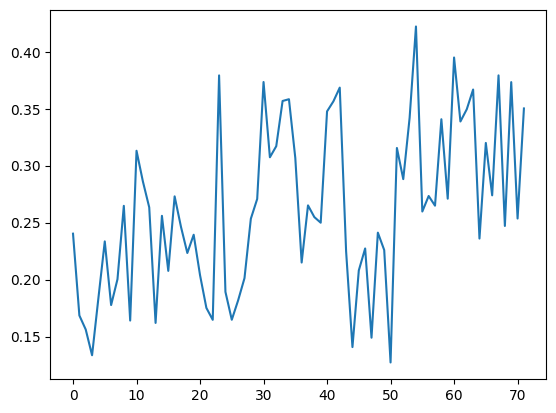

[PPO] Epoch 0: Loss=70.2277, Policy=0.0028, Value=140.5036
[PPO] Epoch 10: Loss=21.9411, Policy=-0.0067, Value=43.9575
[PPO] Epoch 20: Loss=9.2230, Policy=-0.0085, Value=18.5199
[PPO] Epoch 30: Loss=4.9202, Policy=-0.0305, Value=9.9655
Approx KL Learned: 0.0737135261297226
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 19/100 — steps: 2048


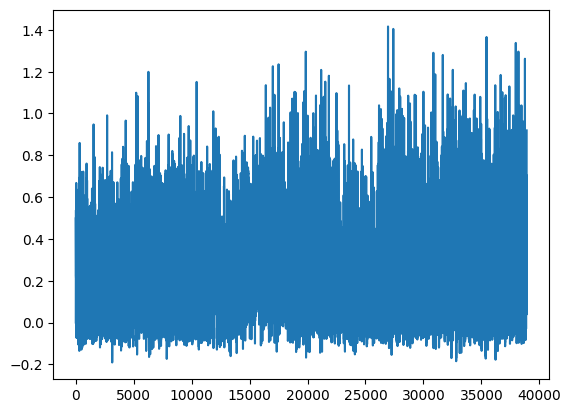

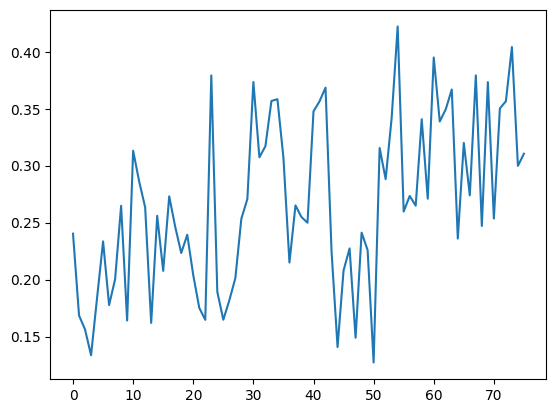

[PPO] Epoch 0: Loss=68.1379, Policy=0.0038, Value=136.3313
[PPO] Epoch 10: Loss=15.7346, Policy=0.0111, Value=31.5131
[PPO] Epoch 20: Loss=11.7057, Policy=0.0008, Value=23.4778
[PPO] Epoch 30: Loss=8.4126, Policy=0.0050, Value=16.8823
Approx KL Learned: 0.05115445703268051
[✅] Actor-Critic checkpoint saved to chkpoint_19.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 20/100 — steps: 2048


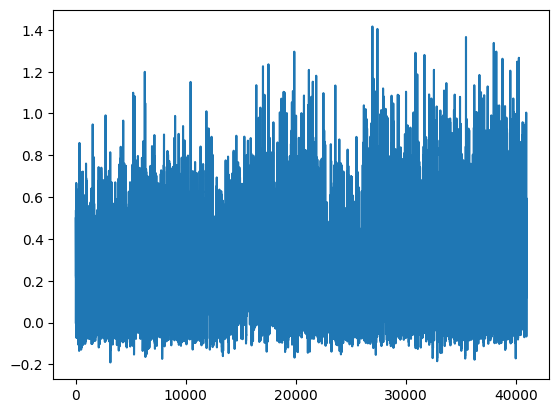

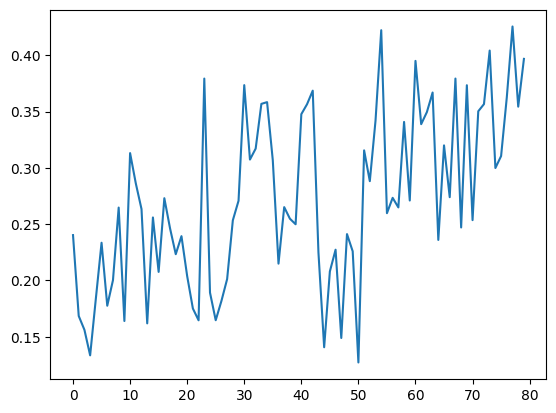

[PPO] Epoch 0: Loss=93.1680, Policy=0.0022, Value=186.3962
[PPO] Epoch 10: Loss=17.0228, Policy=-0.0082, Value=34.1343
[PPO] Epoch 20: Loss=10.4894, Policy=-0.0104, Value=21.0702
[PPO] Epoch 30: Loss=8.4207, Policy=-0.0245, Value=16.9656
Approx KL Learned: 0.07936079055070877
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 21/100 — steps: 2048


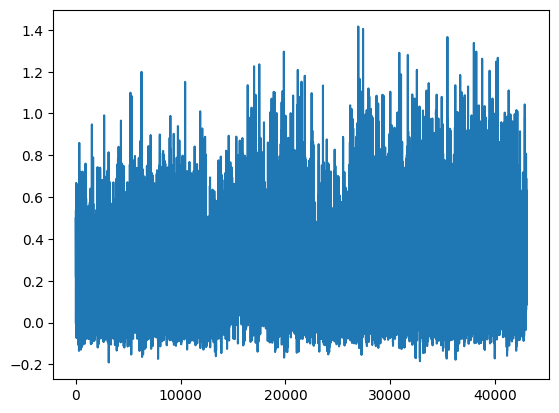

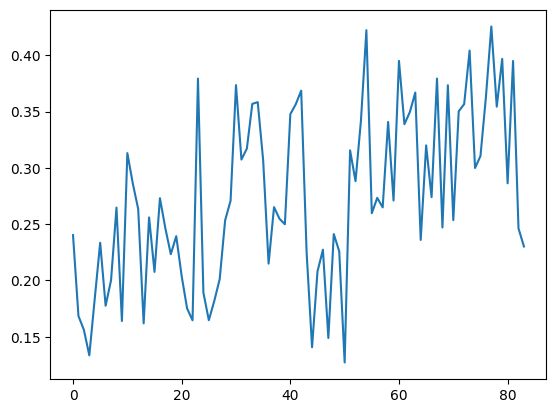

[PPO] Epoch 0: Loss=84.5275, Policy=0.0055, Value=169.1122
[PPO] Epoch 10: Loss=17.3823, Policy=-0.0026, Value=34.8350
[PPO] Epoch 20: Loss=8.0675, Policy=-0.0081, Value=16.2186
[PPO] Epoch 30: Loss=6.3819, Policy=-0.0245, Value=12.8764
Approx KL Learned: 0.06917670369148254
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 22/100 — steps: 2048


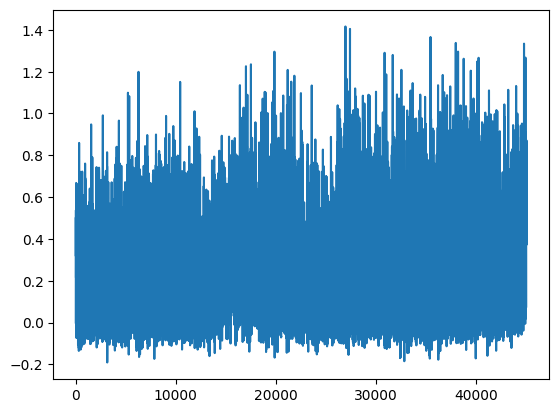

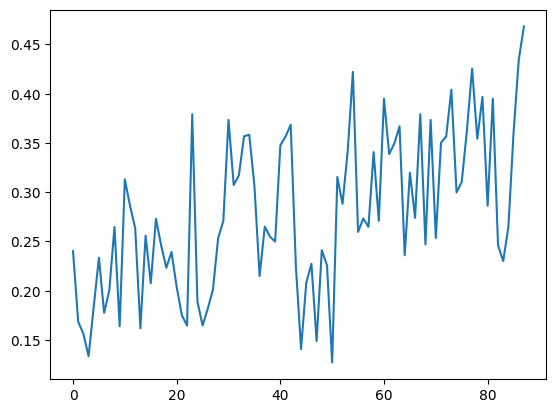

[PPO] Epoch 0: Loss=94.1080, Policy=0.0055, Value=188.2785
[PPO] Epoch 10: Loss=33.5023, Policy=0.0316, Value=67.0220
[PPO] Epoch 20: Loss=24.7006, Policy=0.0013, Value=49.4716
[PPO] Epoch 30: Loss=21.4403, Policy=-0.0018, Value=42.9549
Approx KL Learned: 0.03902659937739372
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 23/100 — steps: 2048


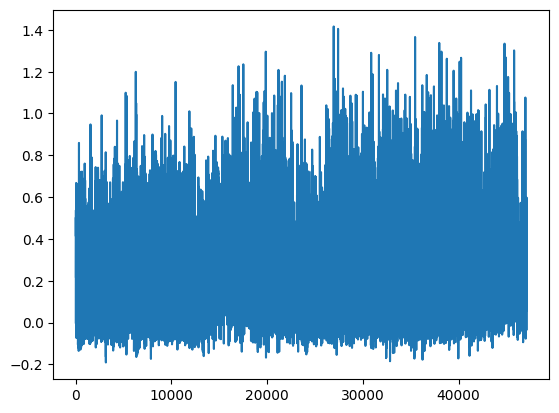

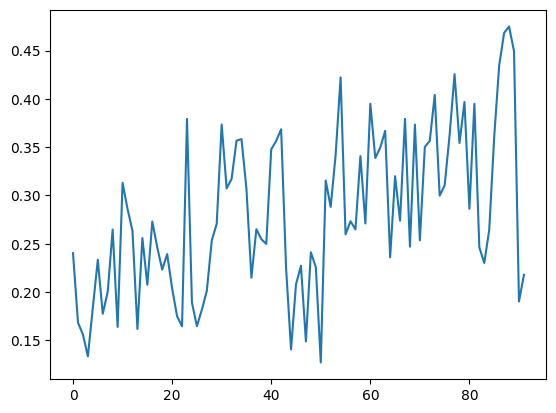

[PPO] Epoch 0: Loss=67.6992, Policy=0.0055, Value=135.4649
[PPO] Epoch 10: Loss=29.5481, Policy=0.0173, Value=59.1405
[PPO] Epoch 20: Loss=27.7499, Policy=0.0052, Value=55.5623
[PPO] Epoch 30: Loss=25.0606, Policy=-0.0072, Value=50.2154
Approx KL Learned: 0.050360240042209625
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 24/100 — steps: 2048


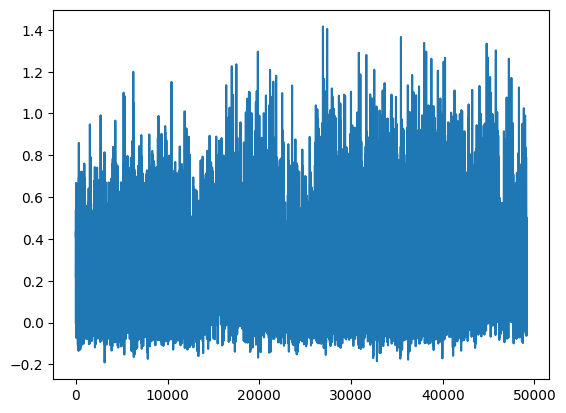

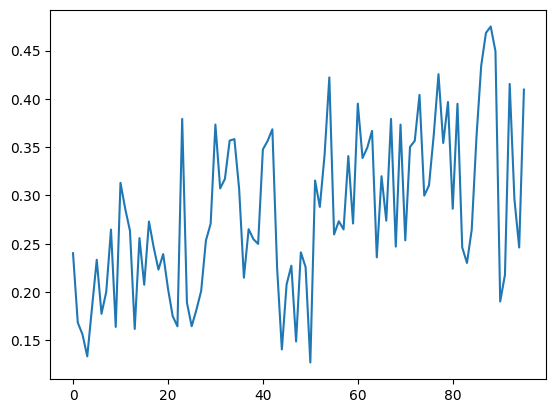

[PPO] Epoch 0: Loss=139.6436, Policy=0.0144, Value=279.3250
[PPO] Epoch 10: Loss=48.6868, Policy=0.0221, Value=97.4024
[PPO] Epoch 20: Loss=32.8860, Policy=0.0027, Value=65.8303
[PPO] Epoch 30: Loss=26.0918, Policy=-0.0188, Value=52.2918
Approx KL Learned: 0.11760120093822479
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 25/100 — steps: 2048


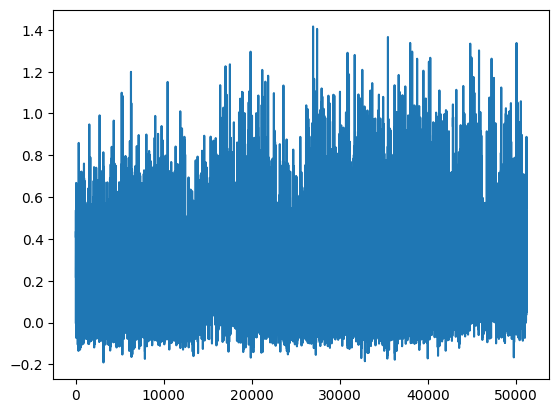

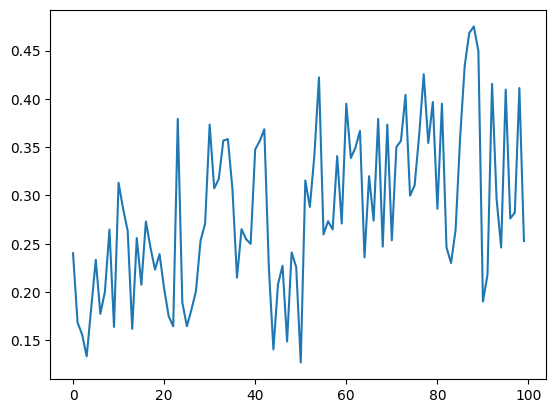

[PPO] Epoch 0: Loss=112.8440, Policy=0.0104, Value=225.7322
[PPO] Epoch 10: Loss=41.0515, Policy=0.0578, Value=82.0690
[PPO] Epoch 20: Loss=20.4197, Policy=0.0246, Value=40.8539
[PPO] Epoch 30: Loss=16.6919, Policy=0.0074, Value=33.4343
Approx KL Learned: 0.05415034294128418
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 26/100 — steps: 2048


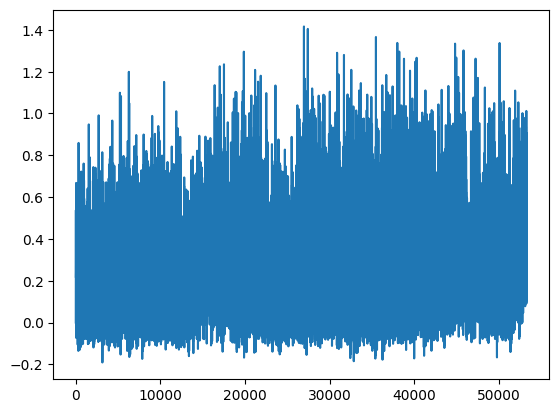

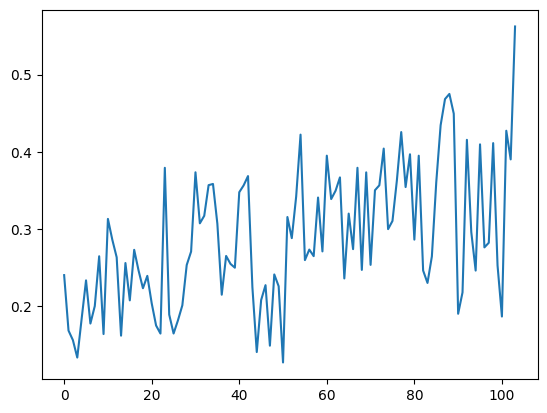

[PPO] Epoch 0: Loss=65.4538, Policy=0.0133, Value=130.9374
[PPO] Epoch 10: Loss=21.8700, Policy=0.0108, Value=43.7742
[PPO] Epoch 20: Loss=8.4730, Policy=0.0051, Value=16.9838
[PPO] Epoch 30: Loss=3.3953, Policy=-0.0140, Value=6.8720
Approx KL Learned: 0.07724392414093018
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 27/100 — steps: 2048


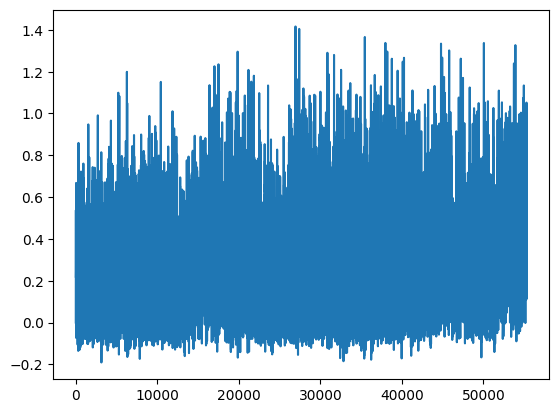

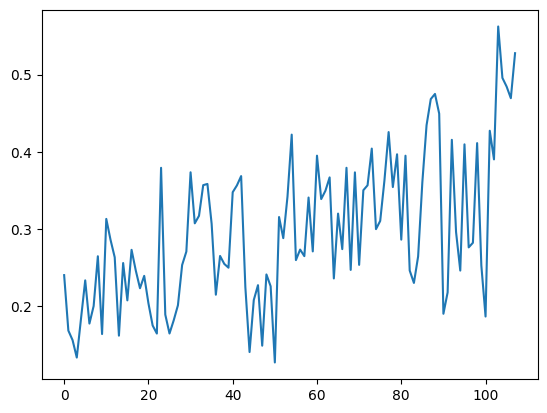

[PPO] Epoch 0: Loss=68.9382, Policy=-0.0011, Value=137.9705
[PPO] Epoch 10: Loss=24.3787, Policy=-0.0081, Value=48.8638
[PPO] Epoch 20: Loss=13.4996, Policy=-0.0103, Value=27.1091
[PPO] Epoch 30: Loss=7.6612, Policy=-0.0166, Value=15.4490
Approx KL Learned: 0.016565486788749695
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 28/100 — steps: 2048


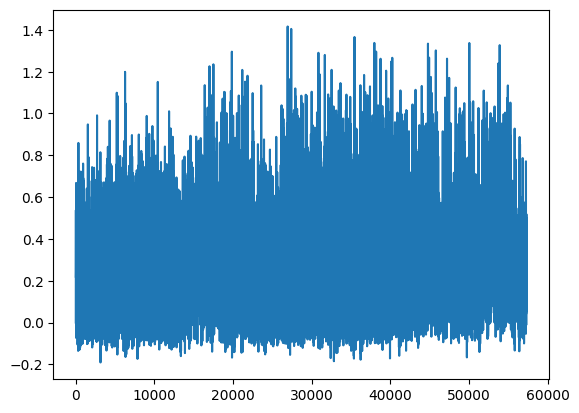

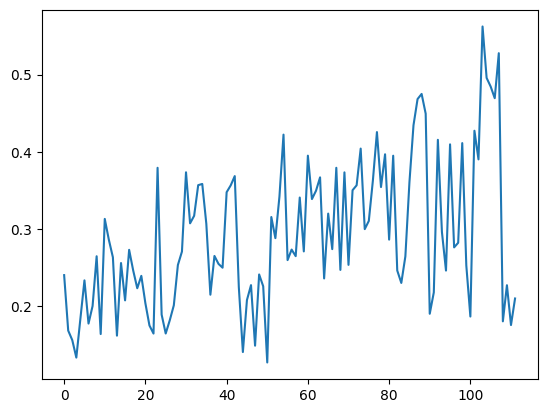

[PPO] Epoch 0: Loss=104.0340, Policy=0.0072, Value=208.1305
[PPO] Epoch 10: Loss=26.5484, Policy=0.0172, Value=53.1372
[PPO] Epoch 20: Loss=18.4050, Policy=0.0037, Value=36.8774
[PPO] Epoch 30: Loss=13.7469, Policy=-0.0150, Value=27.5995
Approx KL Learned: 0.020221026614308357
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 29/100 — steps: 2048


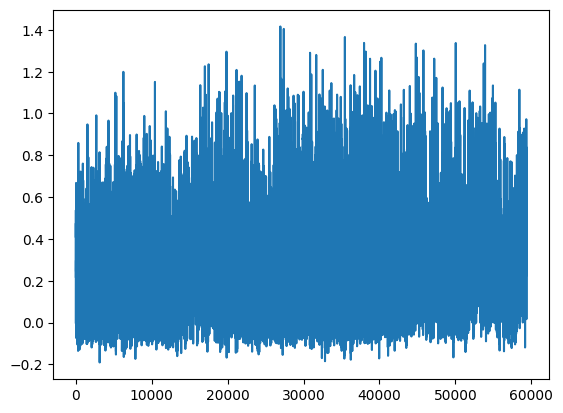

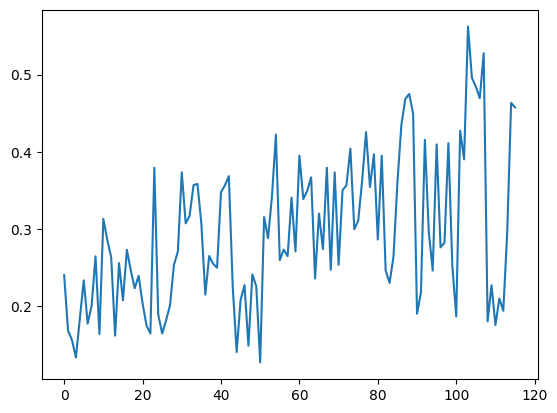

[PPO] Epoch 0: Loss=59.2208, Policy=0.0078, Value=118.4929
[PPO] Epoch 10: Loss=17.5266, Policy=0.0130, Value=35.0874
[PPO] Epoch 20: Loss=10.1043, Policy=0.0119, Value=20.2428
[PPO] Epoch 30: Loss=8.3007, Policy=-0.0153, Value=16.6951
Approx KL Learned: 0.05348047614097595
[✅] Actor-Critic checkpoint saved to chkpoint_29.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 30/100 — steps: 2048


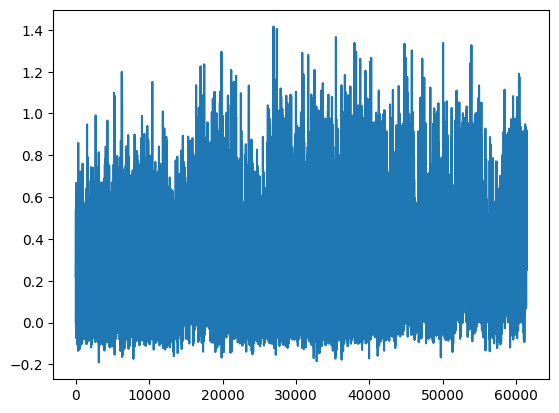

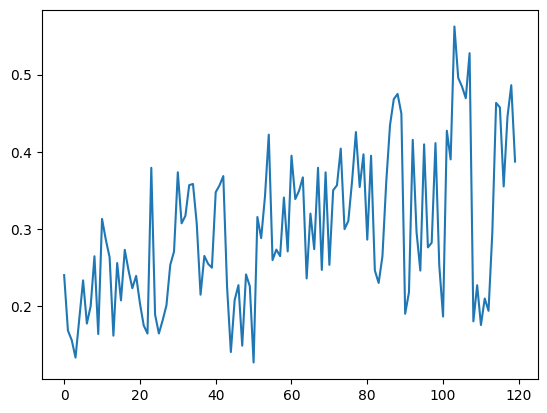

[PPO] Epoch 0: Loss=66.3834, Policy=0.0082, Value=132.8181
[PPO] Epoch 10: Loss=20.8046, Policy=-0.0014, Value=41.6764
[PPO] Epoch 20: Loss=13.8144, Policy=-0.0138, Value=27.7229
[PPO] Epoch 30: Loss=12.2314, Policy=-0.0426, Value=24.6140
Approx KL Learned: 0.05604805797338486
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 31/100 — steps: 2048


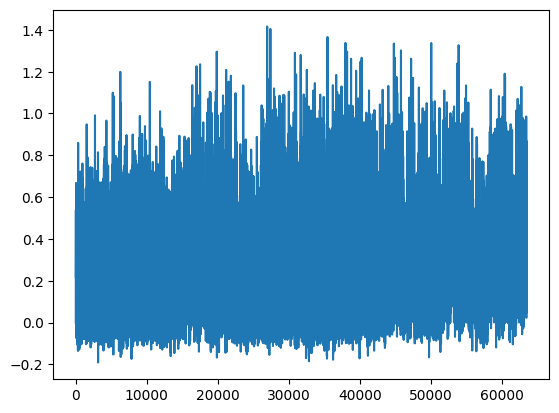

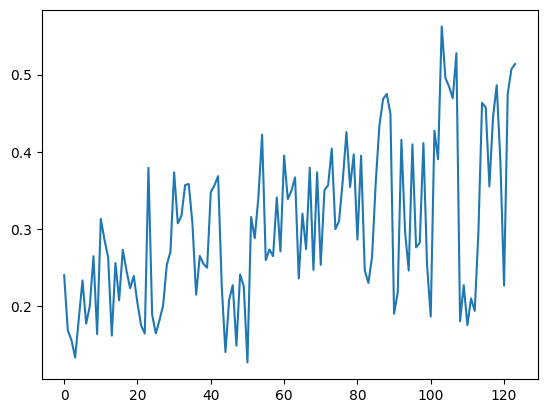

[PPO] Epoch 0: Loss=86.1497, Policy=0.0097, Value=172.3307
[PPO] Epoch 10: Loss=19.9308, Policy=0.0912, Value=39.7573
[PPO] Epoch 20: Loss=9.8510, Policy=0.0505, Value=19.6599
[PPO] Epoch 30: Loss=4.6734, Policy=0.0035, Value=9.3936
Approx KL Learned: 0.0903257206082344
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 32/100 — steps: 2048


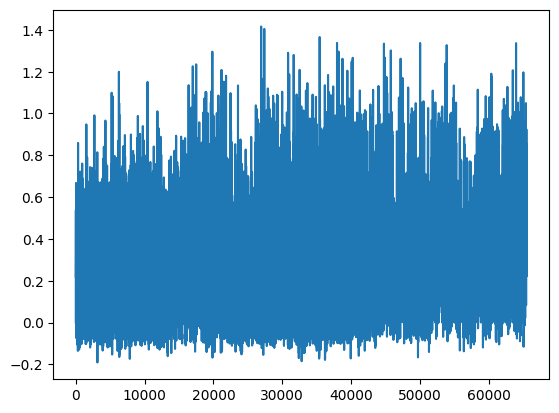

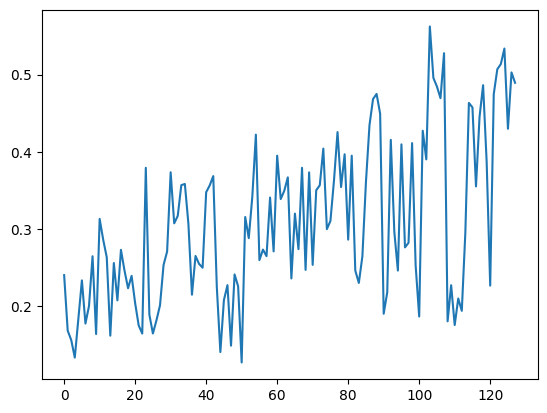

[PPO] Epoch 0: Loss=104.4018, Policy=0.0102, Value=208.8303
[PPO] Epoch 10: Loss=16.9707, Policy=0.0052, Value=33.9902
[PPO] Epoch 20: Loss=7.0362, Policy=-0.0253, Value=14.1764
[PPO] Epoch 30: Loss=7.2239, Policy=-0.0400, Value=14.5852
Approx KL Learned: 0.0885920524597168
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 33/100 — steps: 2048


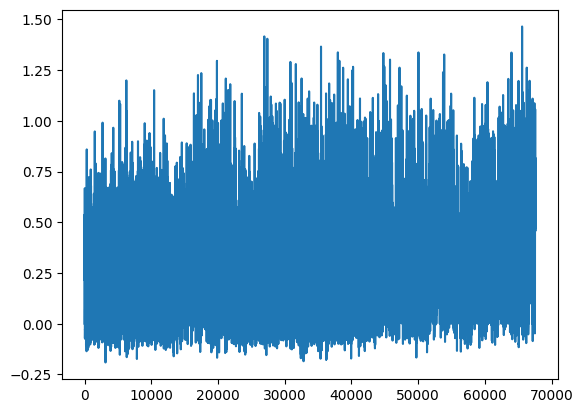

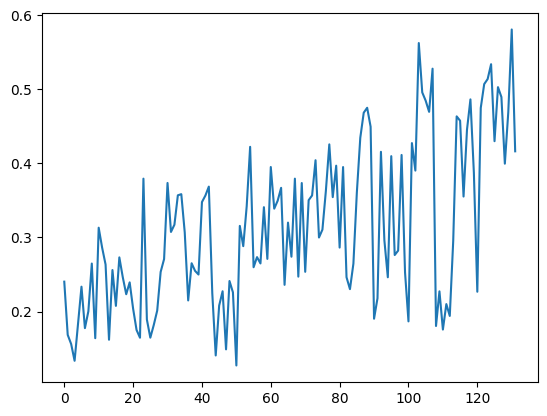

[PPO] Epoch 0: Loss=102.4934, Policy=0.0102, Value=205.0113
[PPO] Epoch 10: Loss=14.8585, Policy=0.0269, Value=29.7114
[PPO] Epoch 20: Loss=4.7536, Policy=-0.0041, Value=9.5630
[PPO] Epoch 30: Loss=2.6200, Policy=-0.0281, Value=5.3470
Approx KL Learned: 0.11217082291841507
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 34/100 — steps: 2048


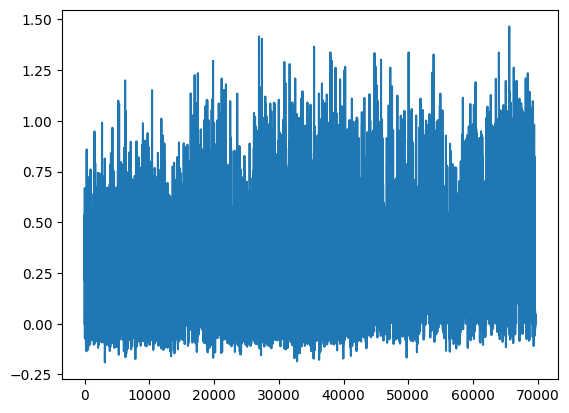

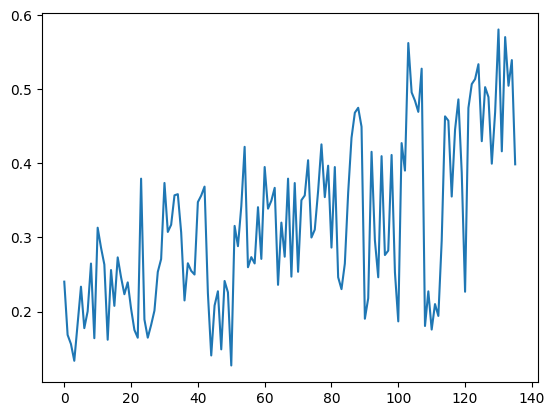

[PPO] Epoch 0: Loss=93.0926, Policy=0.0098, Value=186.2225
[PPO] Epoch 10: Loss=33.7782, Policy=0.1057, Value=67.4087
[PPO] Epoch 20: Loss=20.5140, Policy=0.0340, Value=41.0148
[PPO] Epoch 30: Loss=15.2251, Policy=0.0107, Value=30.4842
Approx KL Learned: 0.0566381998360157
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 35/100 — steps: 2048


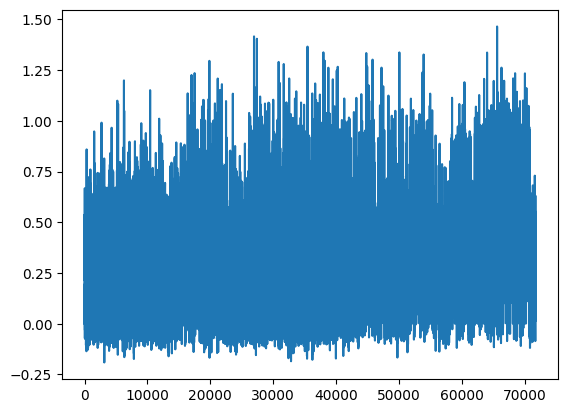

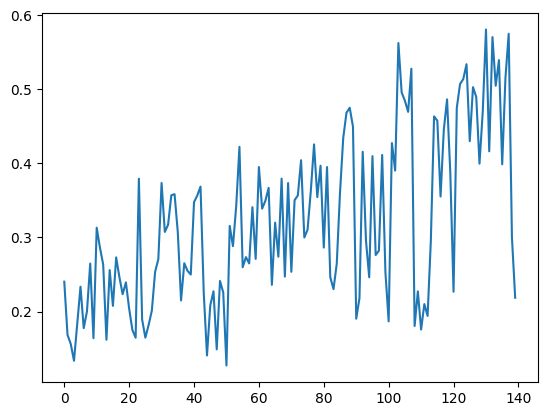

[PPO] Epoch 0: Loss=70.8358, Policy=0.0076, Value=141.7108
[PPO] Epoch 10: Loss=20.4714, Policy=0.0178, Value=40.9593
[PPO] Epoch 20: Loss=12.8782, Policy=-0.0095, Value=25.8315
[PPO] Epoch 30: Loss=11.0972, Policy=-0.0358, Value=22.3233
Approx KL Learned: 0.08375635743141174
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 36/100 — steps: 2048


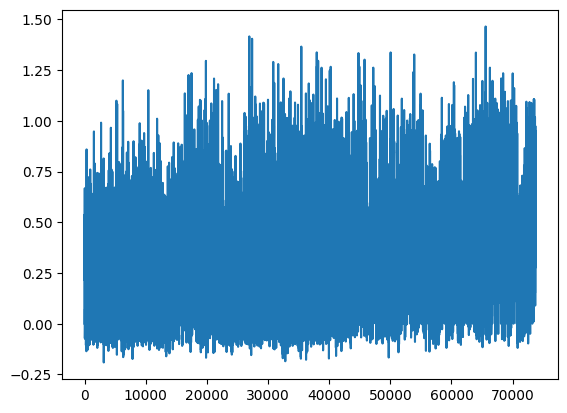

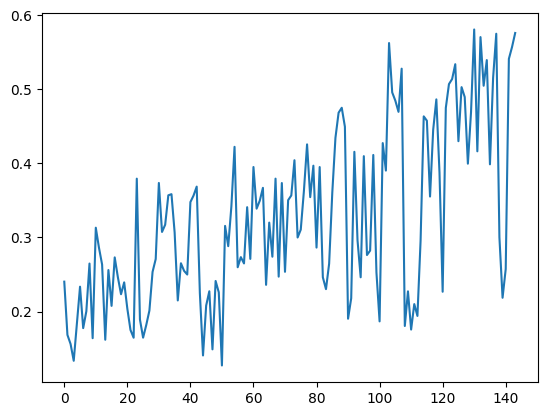

[PPO] Epoch 0: Loss=69.1995, Policy=0.0101, Value=138.4255
[PPO] Epoch 10: Loss=18.4780, Policy=0.0113, Value=36.9721
[PPO] Epoch 20: Loss=5.2281, Policy=0.0164, Value=10.4784
[PPO] Epoch 30: Loss=2.5052, Policy=-0.0134, Value=5.0845
Approx KL Learned: 0.13665975630283356
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 37/100 — steps: 2048


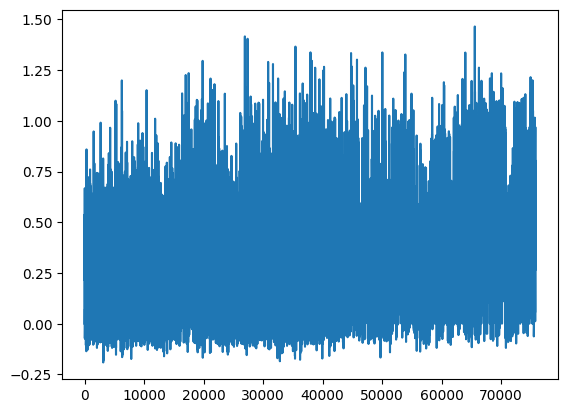

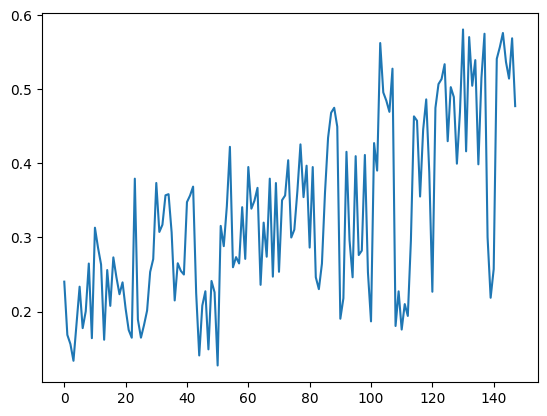

[PPO] Epoch 0: Loss=105.0704, Policy=0.0092, Value=210.2020
[PPO] Epoch 10: Loss=30.2062, Policy=0.0035, Value=60.4869
[PPO] Epoch 20: Loss=10.8605, Policy=-0.0039, Value=21.8116
[PPO] Epoch 30: Loss=4.9708, Policy=-0.0171, Value=10.0624
Approx KL Learned: 0.06445470452308655
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 38/100 — steps: 2048


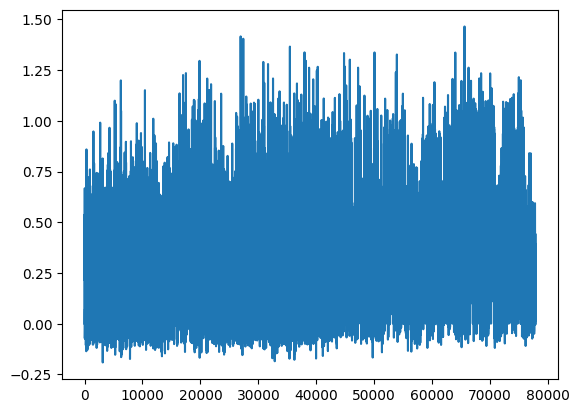

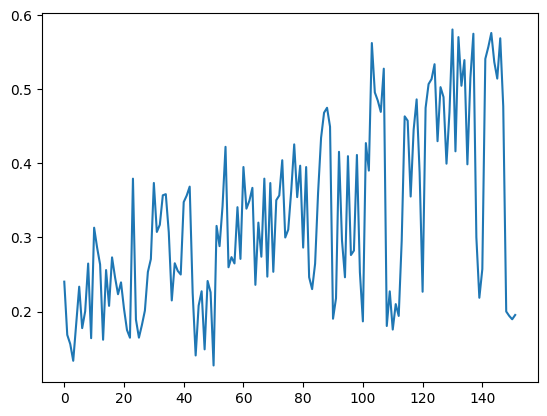

[PPO] Epoch 0: Loss=177.3405, Policy=0.0054, Value=354.6998
[PPO] Epoch 10: Loss=32.8740, Policy=-0.0613, Value=65.9379
[PPO] Epoch 20: Loss=17.9320, Policy=-0.0626, Value=36.0574
[PPO] Epoch 30: Loss=14.1736, Policy=-0.0814, Value=28.5761
Approx KL Learned: 0.3161105513572693
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 39/100 — steps: 2048


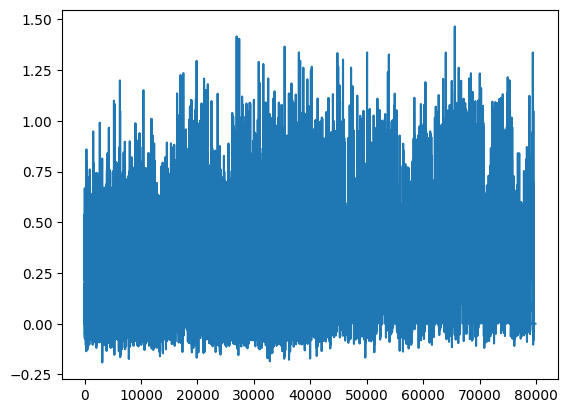

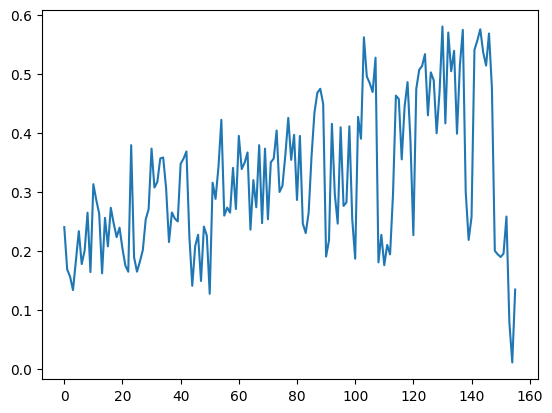

[PPO] Epoch 0: Loss=156.3324, Policy=0.0056, Value=312.6884
[PPO] Epoch 10: Loss=24.2874, Policy=-0.0480, Value=48.7285
[PPO] Epoch 20: Loss=8.4676, Policy=-0.0648, Value=17.1173
[PPO] Epoch 30: Loss=6.5015, Policy=-0.0839, Value=13.2214
Approx KL Learned: 0.16324204206466675
[✅] Actor-Critic checkpoint saved to chkpoint_39.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 40/100 — steps: 2048


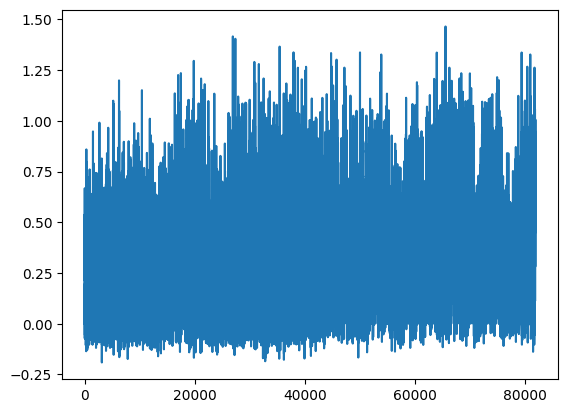

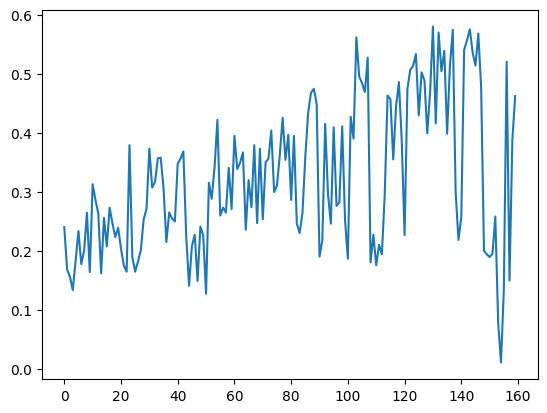

[PPO] Epoch 0: Loss=140.7995, Policy=0.0066, Value=281.6124
[PPO] Epoch 10: Loss=31.1819, Policy=-0.0098, Value=62.4194
[PPO] Epoch 20: Loss=14.7647, Policy=-0.0406, Value=29.6637
[PPO] Epoch 30: Loss=10.6048, Policy=-0.0635, Value=21.3841
Approx KL Learned: 0.13871407508850098
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 41/100 — steps: 2048


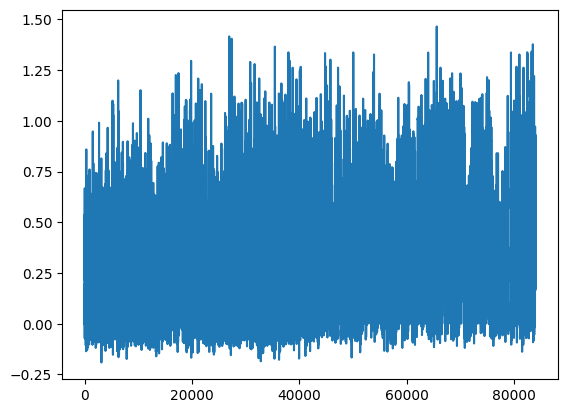

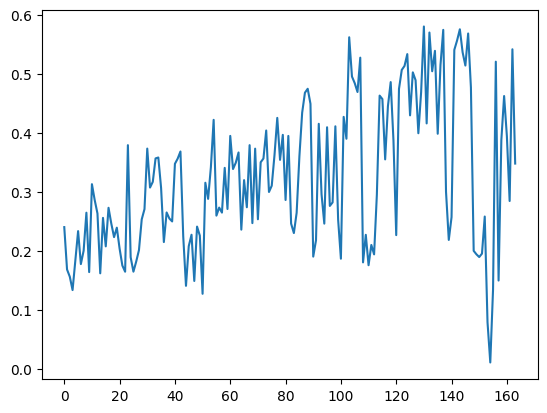

[PPO] Epoch 0: Loss=94.7478, Policy=0.0097, Value=189.5238
[PPO] Epoch 10: Loss=18.2227, Policy=0.0041, Value=36.4844
[PPO] Epoch 20: Loss=4.3722, Policy=-0.0147, Value=8.8276
[PPO] Epoch 30: Loss=2.5152, Policy=-0.0398, Value=5.1635
Approx KL Learned: 0.08297789841890335
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 42/100 — steps: 2048


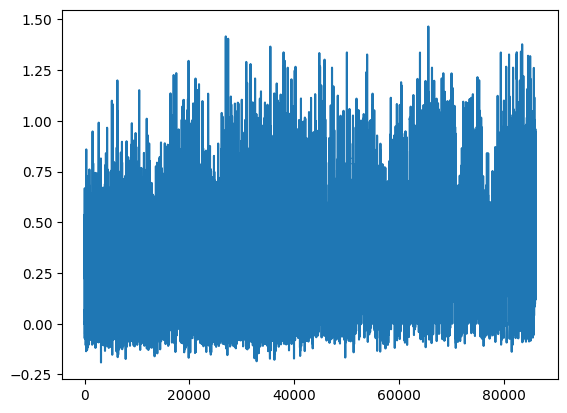

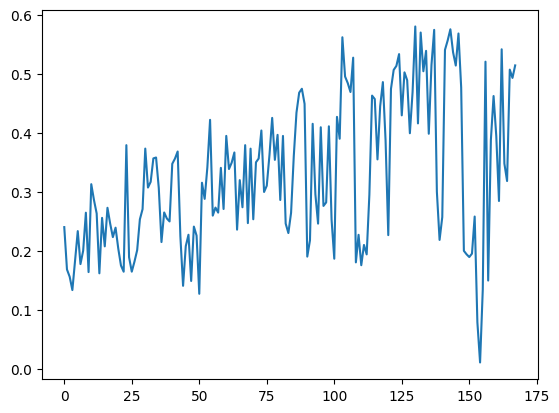

[PPO] Epoch 0: Loss=108.9610, Policy=0.0132, Value=217.9472
[PPO] Epoch 10: Loss=22.8818, Policy=0.0135, Value=45.7851
[PPO] Epoch 20: Loss=5.7894, Policy=-0.0146, Value=11.6679
[PPO] Epoch 30: Loss=2.5093, Policy=-0.0414, Value=5.1597
Approx KL Learned: 0.19111575186252594
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 43/100 — steps: 2048


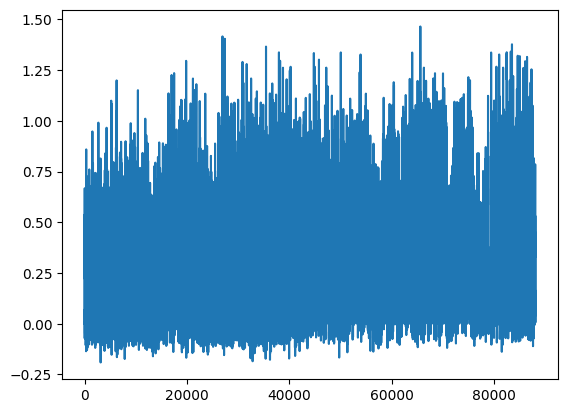

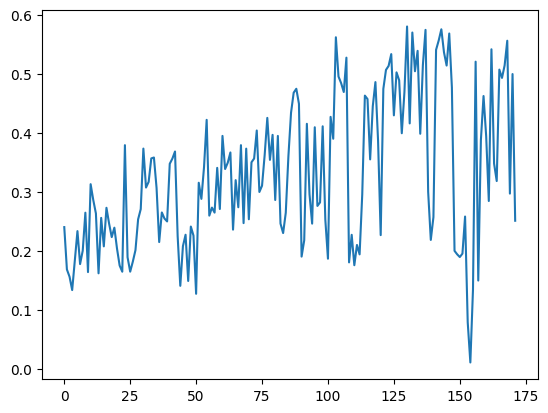

[PPO] Epoch 0: Loss=107.1230, Policy=0.0151, Value=214.3028
[PPO] Epoch 10: Loss=37.3844, Policy=0.0331, Value=74.7868
[PPO] Epoch 20: Loss=26.7556, Policy=0.0197, Value=53.5606
[PPO] Epoch 30: Loss=20.9062, Policy=-0.0029, Value=41.9074
Approx KL Learned: 0.04917525500059128
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 44/100 — steps: 2048


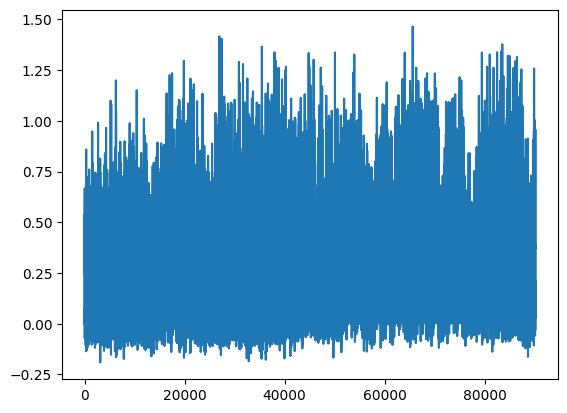

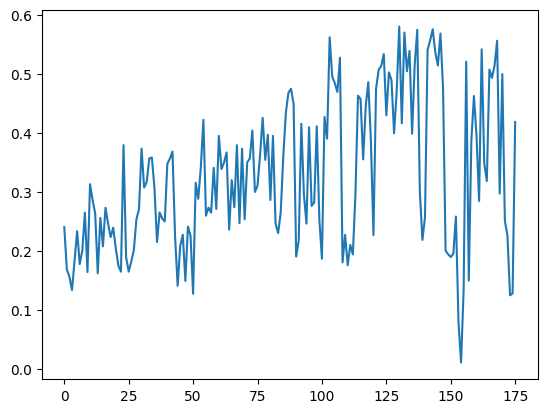

[PPO] Epoch 0: Loss=134.1829, Policy=0.0049, Value=268.4351
[PPO] Epoch 10: Loss=27.6211, Policy=-0.0083, Value=55.3480
[PPO] Epoch 20: Loss=9.9310, Policy=-0.0387, Value=20.0310
[PPO] Epoch 30: Loss=6.3819, Policy=-0.0577, Value=12.9698
Approx KL Learned: 0.17180263996124268
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 45/100 — steps: 2048


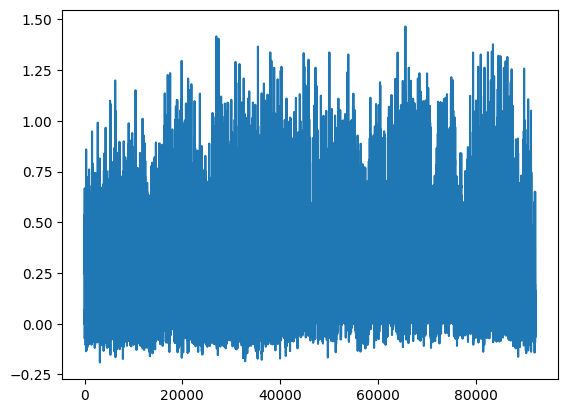

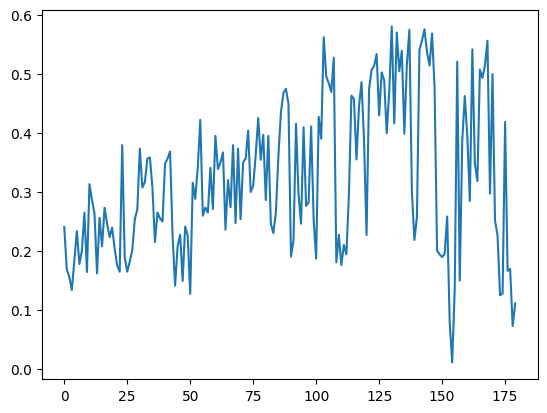

[PPO] Epoch 0: Loss=85.6375, Policy=0.0055, Value=171.3619
[PPO] Epoch 10: Loss=21.3391, Policy=0.0022, Value=42.7700
[PPO] Epoch 20: Loss=6.5667, Policy=-0.0092, Value=13.2508
[PPO] Epoch 30: Loss=3.8526, Policy=-0.0227, Value=7.8491
Approx KL Learned: 0.02548433095216751
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 46/100 — steps: 2048


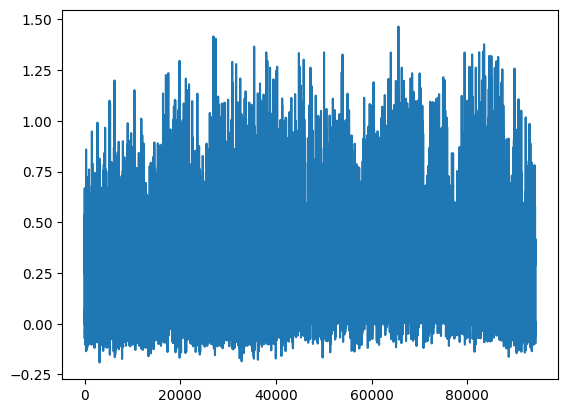

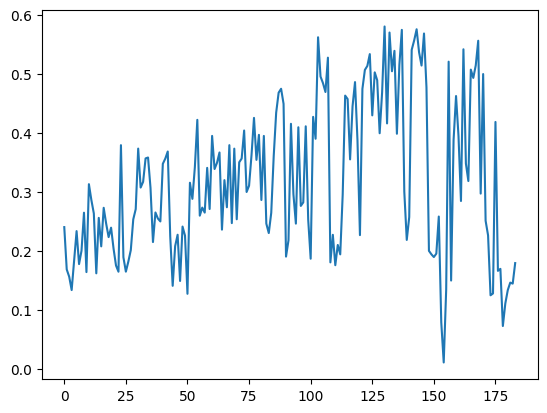

[PPO] Epoch 0: Loss=123.2712, Policy=0.0030, Value=246.6165
[PPO] Epoch 10: Loss=28.4794, Policy=0.0121, Value=57.0172
[PPO] Epoch 20: Loss=16.7009, Policy=-0.0055, Value=33.4968
[PPO] Epoch 30: Loss=12.5219, Policy=-0.0386, Value=25.2028
Approx KL Learned: 0.048470448702573776
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 47/100 — steps: 2048


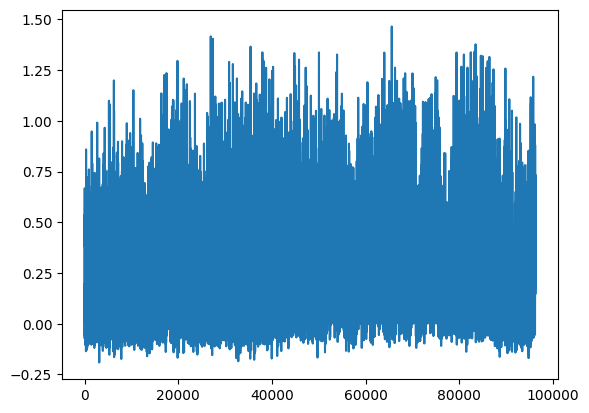

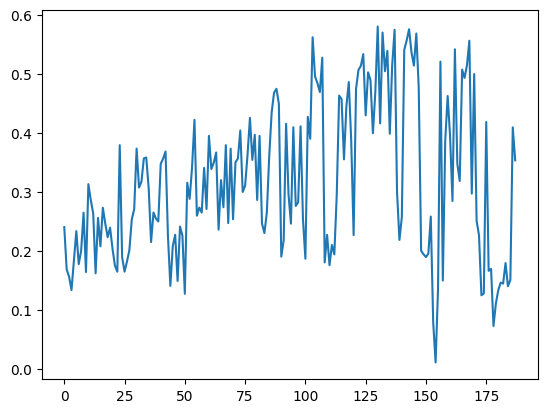

[PPO] Epoch 0: Loss=178.4498, Policy=0.0056, Value=356.9352
[PPO] Epoch 10: Loss=36.1189, Policy=-0.0155, Value=72.3246
[PPO] Epoch 20: Loss=12.8740, Policy=-0.0312, Value=25.8696
[PPO] Epoch 30: Loss=7.5185, Policy=-0.0572, Value=15.2140
Approx KL Learned: 0.1389821171760559
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 48/100 — steps: 2048


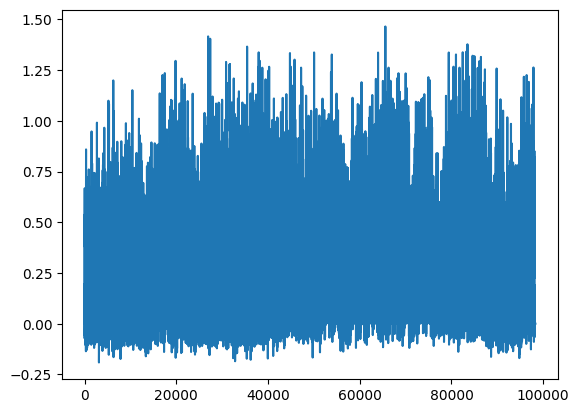

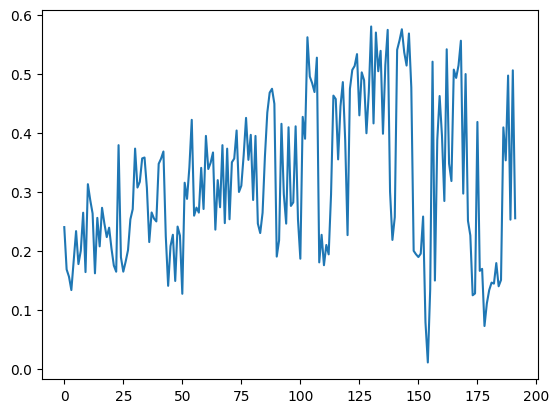

[PPO] Epoch 0: Loss=119.3498, Policy=0.0066, Value=238.7732
[PPO] Epoch 10: Loss=35.8648, Policy=0.0051, Value=71.8078
[PPO] Epoch 20: Loss=25.1423, Policy=-0.0217, Value=50.4173
[PPO] Epoch 30: Loss=21.5086, Policy=-0.0447, Value=43.1927
Approx KL Learned: 0.038978636264801025
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 49/100 — steps: 2048


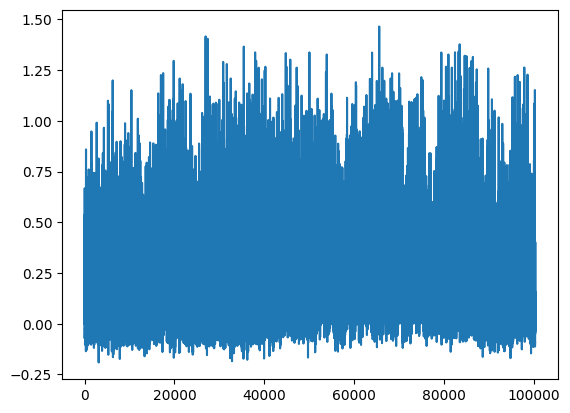

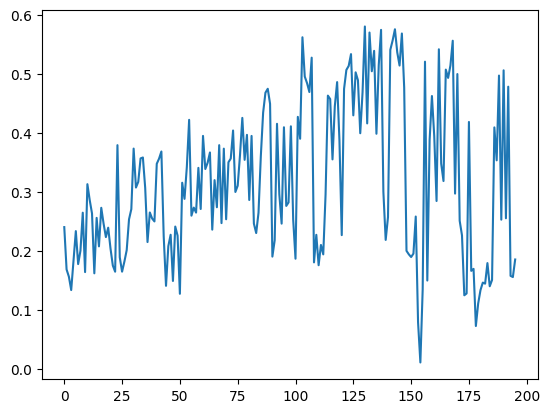

[PPO] Epoch 0: Loss=118.5223, Policy=0.0159, Value=237.0699
[PPO] Epoch 10: Loss=29.5785, Policy=0.0092, Value=59.1937
[PPO] Epoch 20: Loss=10.3876, Policy=-0.0151, Value=20.8640
[PPO] Epoch 30: Loss=8.3013, Policy=-0.0409, Value=16.7448
Approx KL Learned: 0.08798959106206894
[✅] Actor-Critic checkpoint saved to chkpoint_49.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 50/100 — steps: 2048


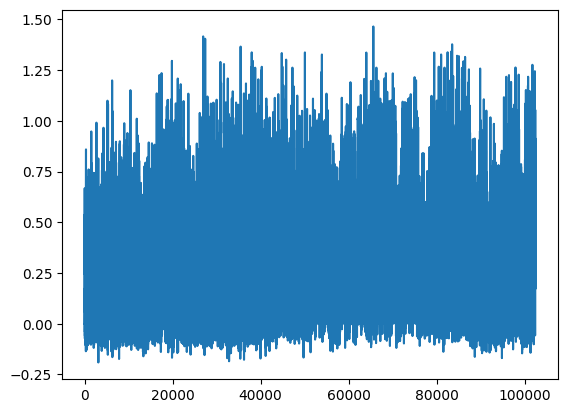

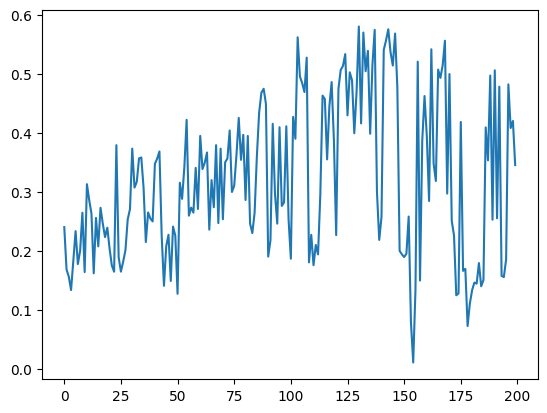

[PPO] Epoch 0: Loss=83.1907, Policy=0.0171, Value=166.4265
[PPO] Epoch 10: Loss=21.8215, Policy=0.0108, Value=43.7017
[PPO] Epoch 20: Loss=10.8689, Policy=-0.0131, Value=21.8430
[PPO] Epoch 30: Loss=5.8748, Policy=-0.0400, Value=11.9064
Approx KL Learned: 0.03061615489423275
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 51/100 — steps: 2048


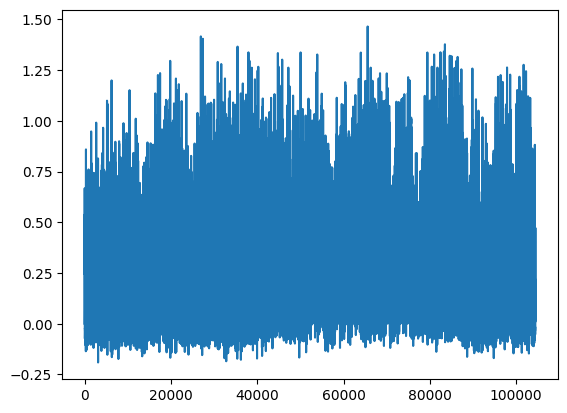

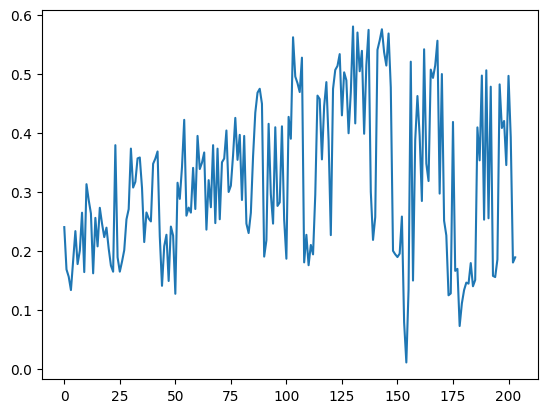

[PPO] Epoch 0: Loss=111.5547, Policy=0.0187, Value=223.1317
[PPO] Epoch 10: Loss=18.1432, Policy=0.0118, Value=36.3260
[PPO] Epoch 20: Loss=9.9580, Policy=0.0143, Value=19.9461
[PPO] Epoch 30: Loss=6.5702, Policy=-0.0095, Value=13.2266
Approx KL Learned: 0.07071106880903244
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 52/100 — steps: 2048


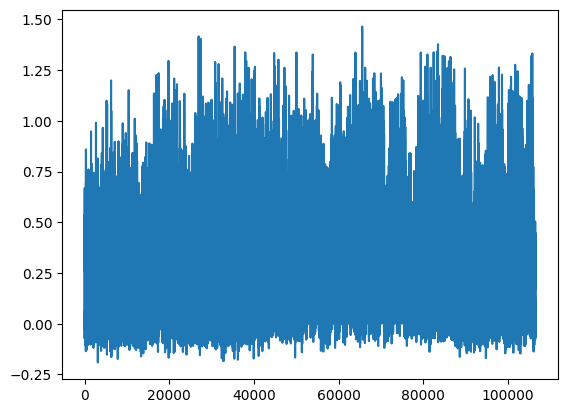

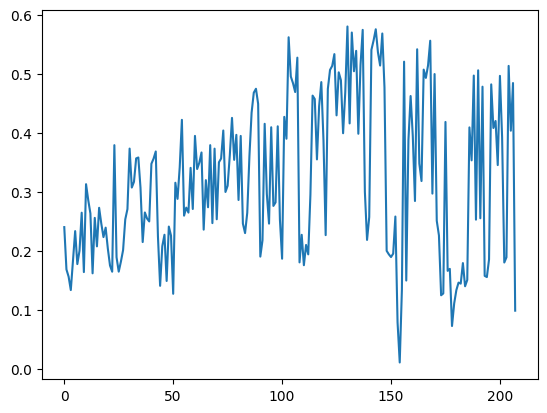

[PPO] Epoch 0: Loss=147.4182, Policy=0.0080, Value=294.8909
[PPO] Epoch 10: Loss=23.5987, Policy=-0.0082, Value=47.2918
[PPO] Epoch 20: Loss=12.5486, Policy=-0.0183, Value=25.2113
[PPO] Epoch 30: Loss=8.8989, Policy=-0.0518, Value=17.9764
Approx KL Learned: 0.0732608437538147
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 53/100 — steps: 2048


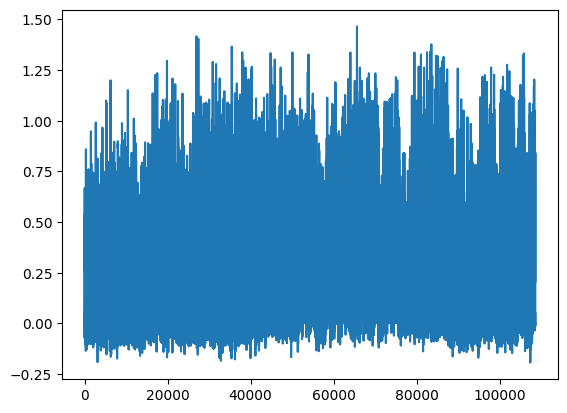

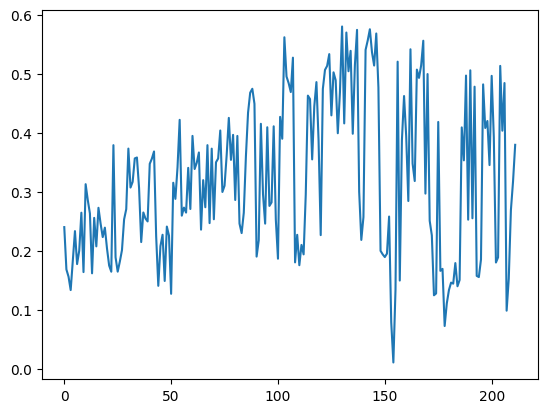

[PPO] Epoch 0: Loss=117.8866, Policy=0.0164, Value=235.7984
[PPO] Epoch 10: Loss=19.3672, Policy=0.0212, Value=38.7570
[PPO] Epoch 20: Loss=9.0882, Policy=0.0076, Value=18.2272
[PPO] Epoch 30: Loss=6.9842, Policy=-0.0144, Value=14.0643
Approx KL Learned: 0.09889659285545349
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 54/100 — steps: 2048


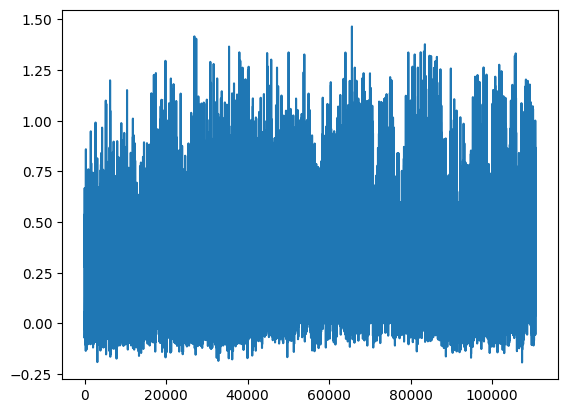

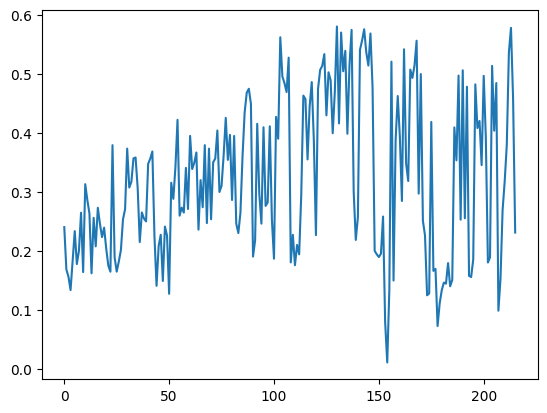

[PPO] Epoch 0: Loss=123.8928, Policy=0.0074, Value=247.8723
[PPO] Epoch 10: Loss=48.9264, Policy=0.0197, Value=97.9108
[PPO] Epoch 20: Loss=12.6598, Policy=0.0116, Value=25.3978
[PPO] Epoch 30: Loss=7.2343, Policy=-0.0054, Value=14.5822
Approx KL Learned: 0.035669103264808655
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 55/100 — steps: 2048


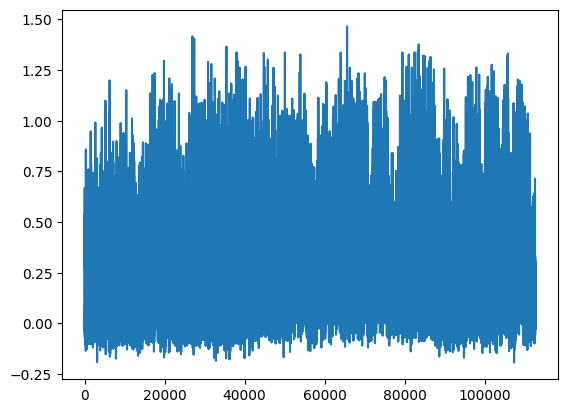

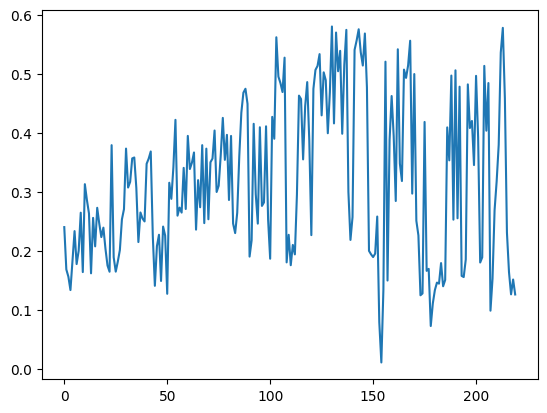

[PPO] Epoch 0: Loss=91.5356, Policy=0.0098, Value=183.1277
[PPO] Epoch 10: Loss=16.8727, Policy=0.0119, Value=33.7991
[PPO] Epoch 20: Loss=11.7250, Policy=-0.0056, Value=23.5395
[PPO] Epoch 30: Loss=8.9920, Policy=-0.0416, Value=18.1438
Approx KL Learned: 0.06827275454998016
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 56/100 — steps: 2048


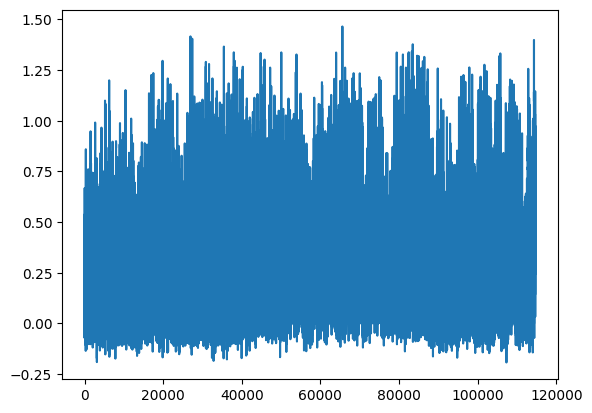

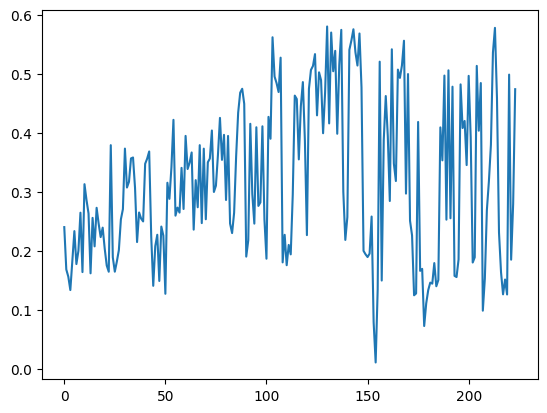

[PPO] Epoch 0: Loss=227.2686, Policy=0.0203, Value=454.5429
[PPO] Epoch 10: Loss=36.2768, Policy=-0.0363, Value=72.6882
[PPO] Epoch 20: Loss=17.2146, Policy=-0.0630, Value=34.6198
[PPO] Epoch 30: Loss=14.0366, Policy=-0.0868, Value=28.3120
Approx KL Learned: 0.17481949925422668
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 57/100 — steps: 2048


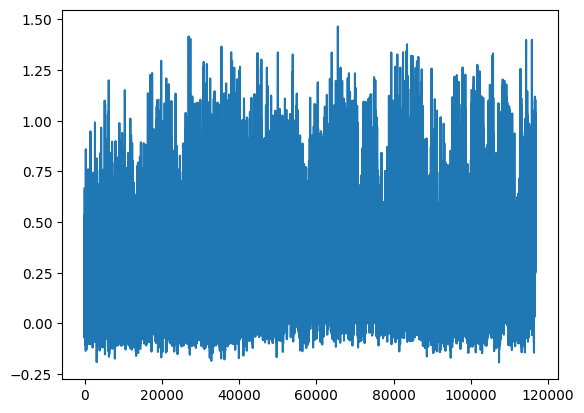

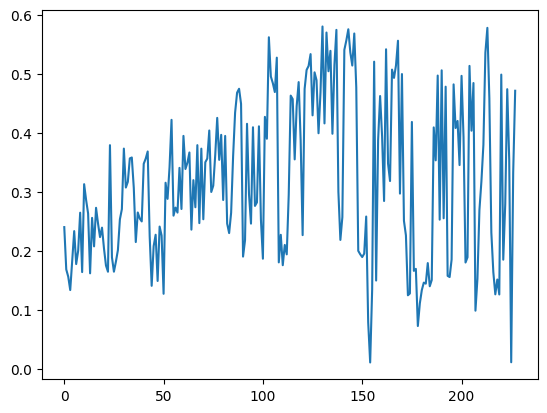

[PPO] Epoch 0: Loss=112.0013, Policy=0.0220, Value=224.0053
[PPO] Epoch 10: Loss=29.4925, Policy=0.0319, Value=58.9686
[PPO] Epoch 20: Loss=9.5539, Policy=0.0099, Value=19.1425
[PPO] Epoch 30: Loss=4.3661, Policy=-0.0222, Value=8.8322
Approx KL Learned: 0.15254011750221252
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 58/100 — steps: 2048


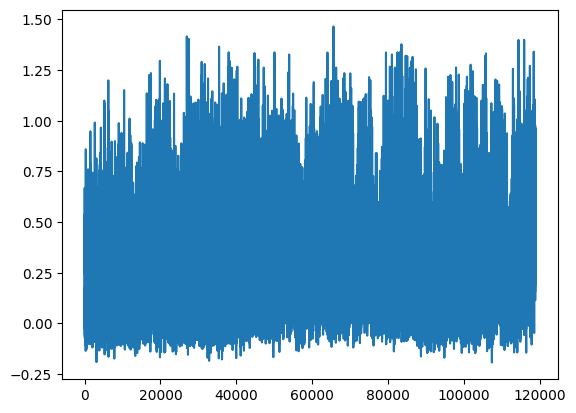

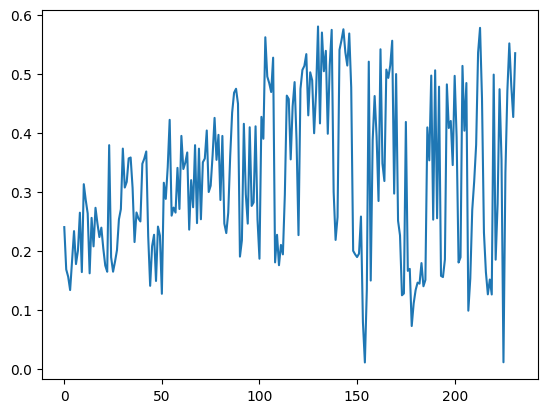

[PPO] Epoch 0: Loss=129.6812, Policy=0.0244, Value=259.3802
[PPO] Epoch 10: Loss=21.6268, Policy=0.0130, Value=43.2965
[PPO] Epoch 20: Loss=6.6319, Policy=-0.0109, Value=13.3583
[PPO] Epoch 30: Loss=2.8230, Policy=-0.0414, Value=5.8011
Approx KL Learned: 0.12299960106611252
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 59/100 — steps: 2048


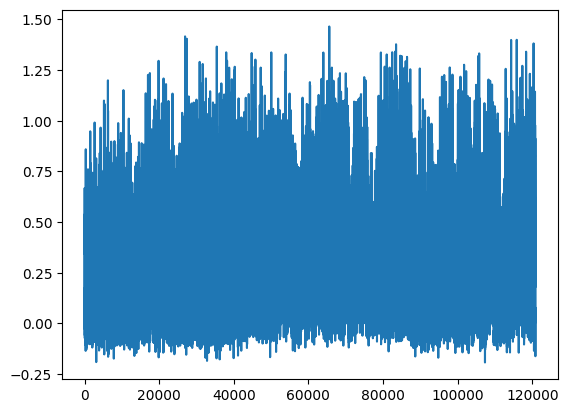

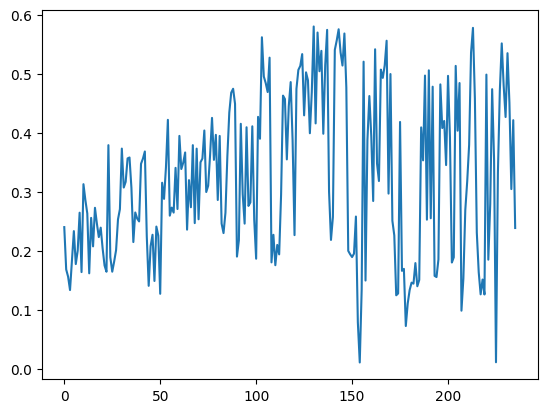

[PPO] Epoch 0: Loss=112.5071, Policy=0.0270, Value=225.0156
[PPO] Epoch 10: Loss=23.0195, Policy=0.0086, Value=46.0691
[PPO] Epoch 20: Loss=4.0014, Policy=-0.0215, Value=8.1012
[PPO] Epoch 30: Loss=1.2334, Policy=-0.0535, Value=2.6301
Approx KL Learned: 0.09563373774290085
[✅] Actor-Critic checkpoint saved to chkpoint_59.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 60/100 — steps: 2048


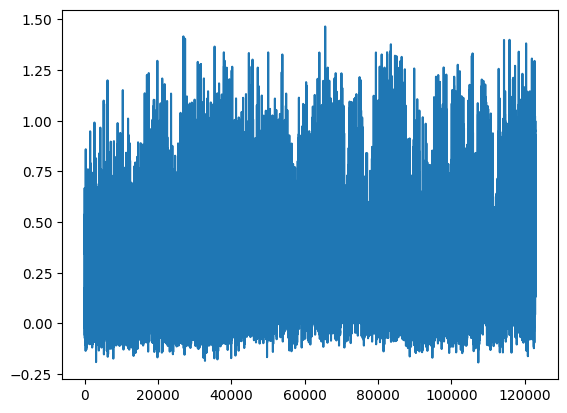

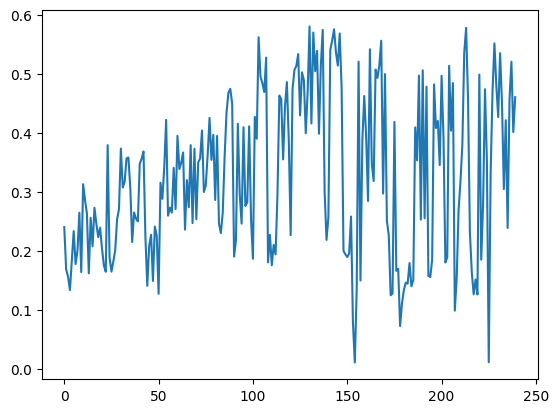

[PPO] Epoch 0: Loss=91.7859, Policy=0.0190, Value=183.5836
[PPO] Epoch 10: Loss=17.6790, Policy=0.0289, Value=35.3448
[PPO] Epoch 20: Loss=3.6438, Policy=-0.0058, Value=7.3518
[PPO] Epoch 30: Loss=1.5710, Policy=-0.0420, Value=3.2783
Approx KL Learned: 0.11128918826580048
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 61/100 — steps: 2048


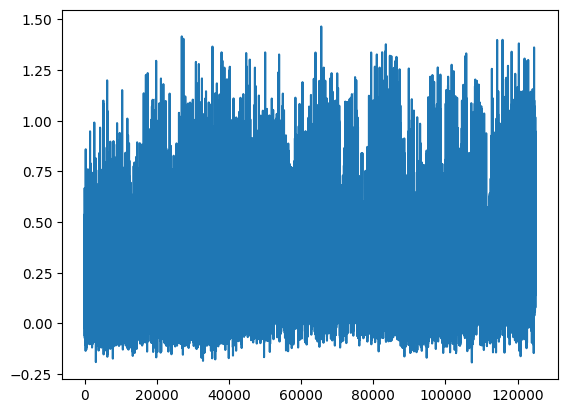

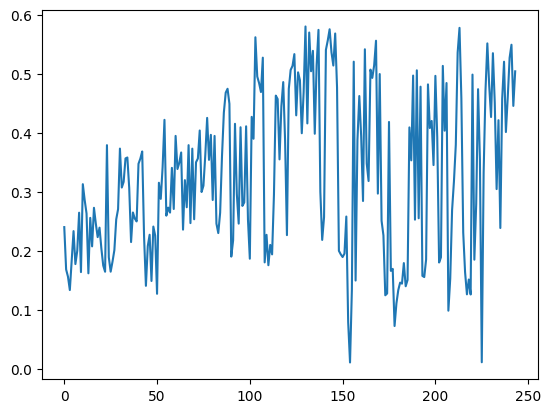

[PPO] Epoch 0: Loss=103.0608, Policy=0.0242, Value=206.1381
[PPO] Epoch 10: Loss=27.7344, Policy=0.0246, Value=55.4838
[PPO] Epoch 20: Loss=5.8244, Policy=-0.0020, Value=11.7159
[PPO] Epoch 30: Loss=2.3421, Policy=-0.0374, Value=4.8268
Approx KL Learned: 0.10038939118385315
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 62/100 — steps: 2048


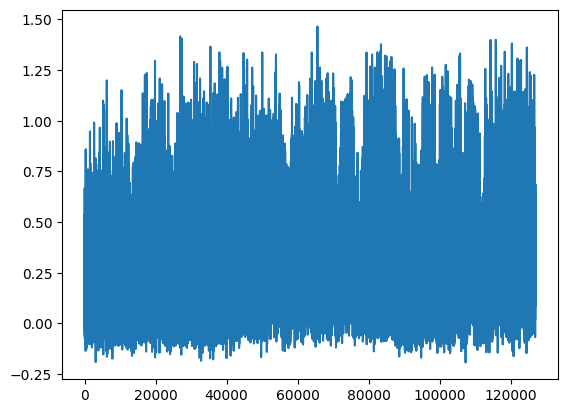

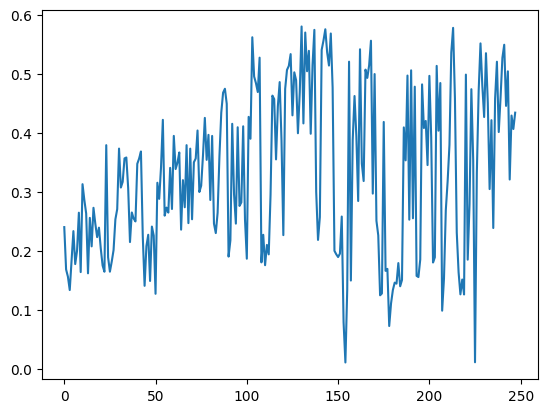

[PPO] Epoch 0: Loss=88.2076, Policy=0.0213, Value=176.4542
[PPO] Epoch 10: Loss=10.6345, Policy=0.0200, Value=21.3108
[PPO] Epoch 20: Loss=3.4975, Policy=0.0037, Value=7.0729
[PPO] Epoch 30: Loss=1.3729, Policy=-0.0444, Value=2.9176
Approx KL Learned: 0.09972520917654037
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 63/100 — steps: 2048


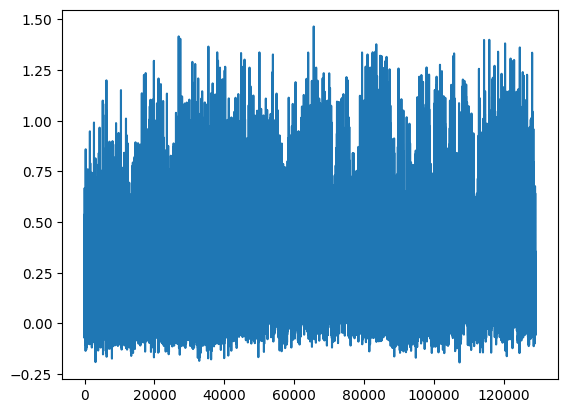

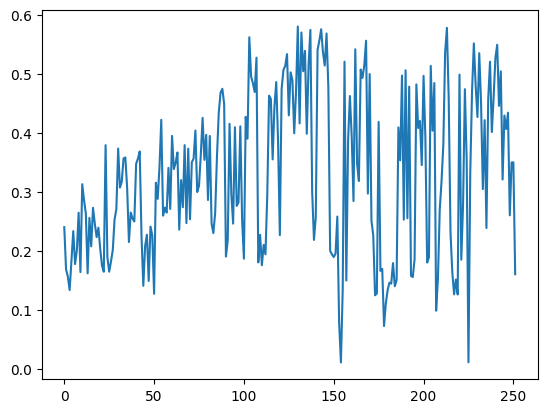

[PPO] Epoch 0: Loss=75.7768, Policy=0.0265, Value=151.5622
[PPO] Epoch 10: Loss=13.7605, Policy=0.0223, Value=27.5267
[PPO] Epoch 20: Loss=4.6373, Policy=-0.0038, Value=9.3335
[PPO] Epoch 30: Loss=1.4057, Policy=-0.0343, Value=2.9331
Approx KL Learned: 0.11676827818155289
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 64/100 — steps: 2048


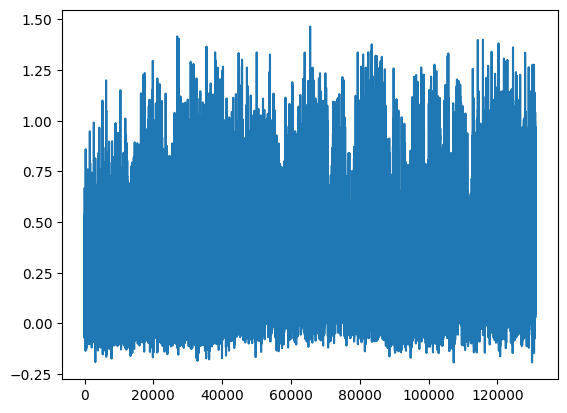

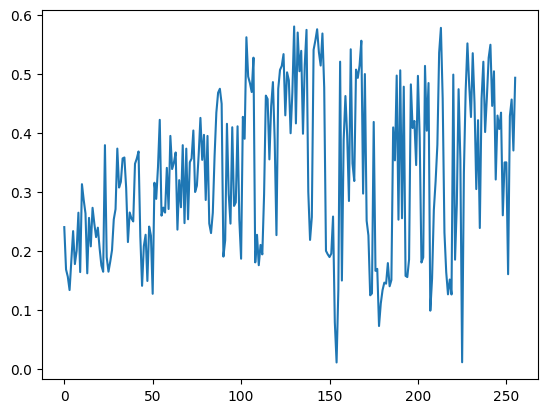

[PPO] Epoch 0: Loss=70.7117, Policy=0.0166, Value=141.4507
[PPO] Epoch 10: Loss=8.8196, Policy=0.0084, Value=17.6815
[PPO] Epoch 20: Loss=2.2342, Policy=-0.0167, Value=4.5646
[PPO] Epoch 30: Loss=1.2754, Policy=-0.0456, Value=2.7019
Approx KL Learned: 0.1531524807214737
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 65/100 — steps: 2048


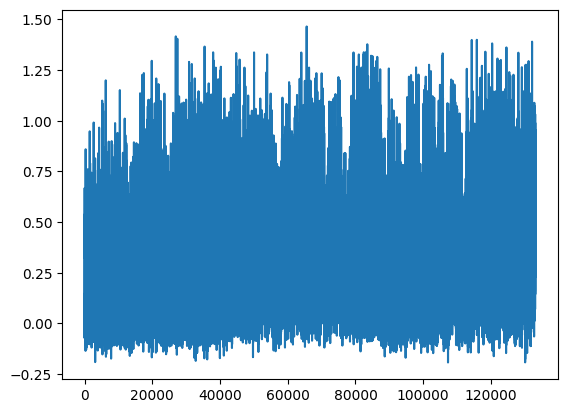

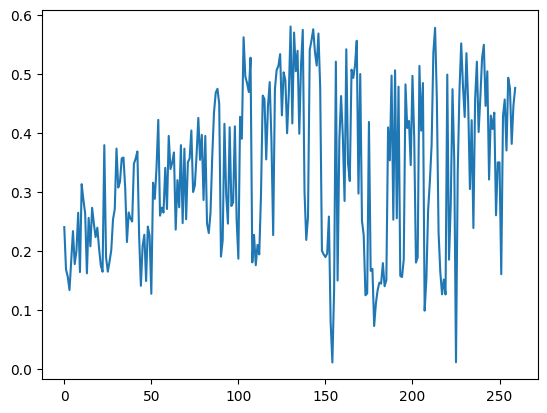

[PPO] Epoch 0: Loss=105.9341, Policy=0.0208, Value=211.9084
[PPO] Epoch 10: Loss=14.5313, Policy=0.0356, Value=29.0680
[PPO] Epoch 20: Loss=4.9202, Policy=0.0066, Value=9.9072
[PPO] Epoch 30: Loss=2.1805, Policy=-0.0334, Value=4.5064
Approx KL Learned: 0.06349184364080429
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 66/100 — steps: 2048


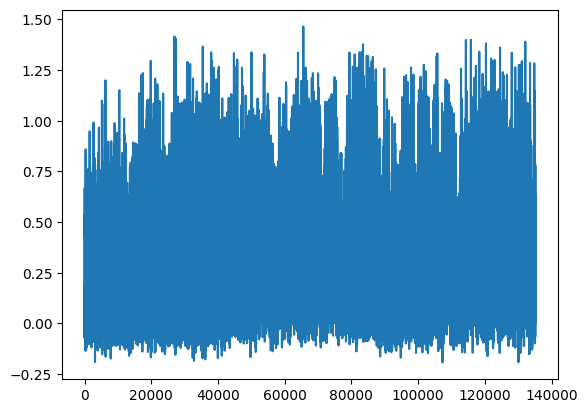

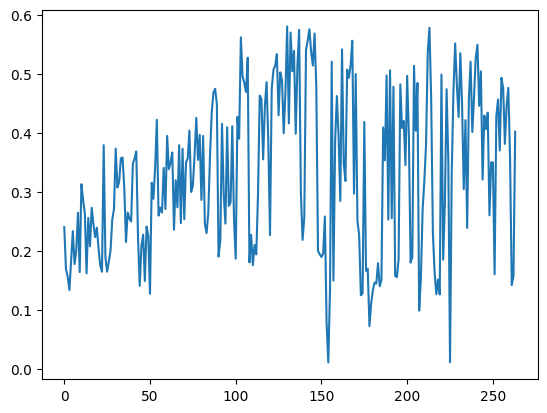

[PPO] Epoch 0: Loss=113.5683, Policy=0.0186, Value=227.1373
[PPO] Epoch 10: Loss=24.3958, Policy=0.0081, Value=48.8155
[PPO] Epoch 20: Loss=4.1196, Policy=-0.0178, Value=8.3199
[PPO] Epoch 30: Loss=1.8306, Policy=-0.0500, Value=3.8013
Approx KL Learned: 0.12709209322929382
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 67/100 — steps: 2048


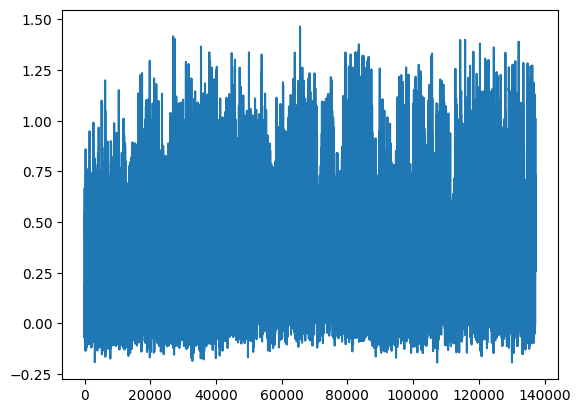

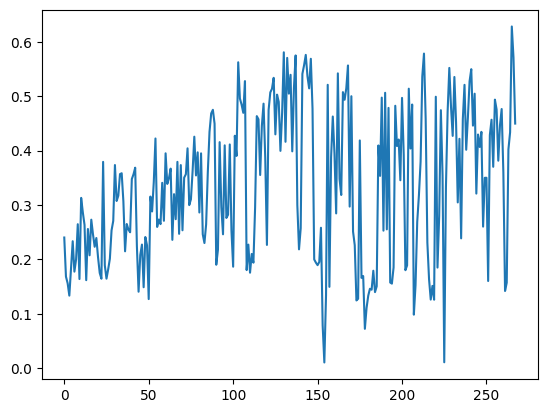

[PPO] Epoch 0: Loss=99.8362, Policy=0.0171, Value=199.7024
[PPO] Epoch 10: Loss=12.4892, Policy=0.0075, Value=25.0283
[PPO] Epoch 20: Loss=2.7236, Policy=-0.0137, Value=5.5442
[PPO] Epoch 30: Loss=1.1893, Policy=-0.0530, Value=2.5520
Approx KL Learned: 0.09379805624485016
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 68/100 — steps: 2048


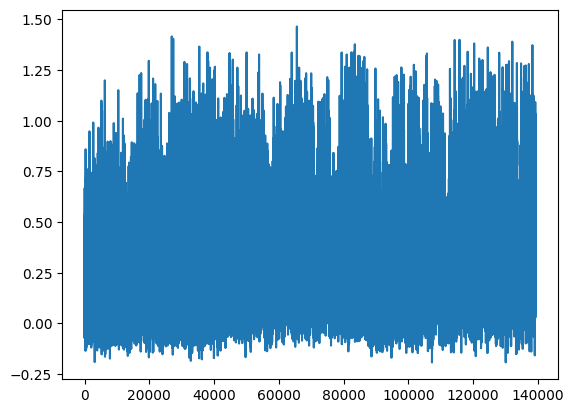

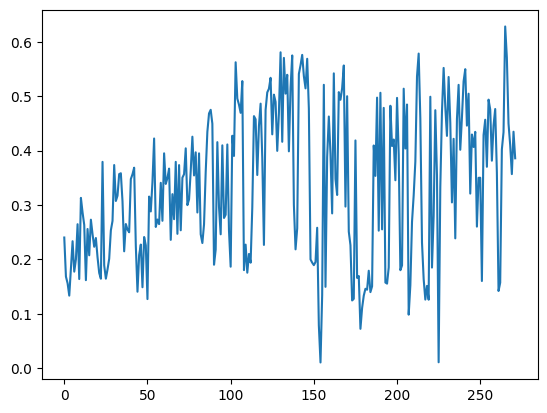

[PPO] Epoch 0: Loss=103.7957, Policy=0.0324, Value=207.5938
[PPO] Epoch 10: Loss=11.7764, Policy=0.0276, Value=23.5561
[PPO] Epoch 20: Loss=2.9836, Policy=-0.0061, Value=6.0458
[PPO] Epoch 30: Loss=1.0549, Policy=-0.0568, Value=2.2927
Approx KL Learned: 0.1364925354719162
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 69/100 — steps: 2048


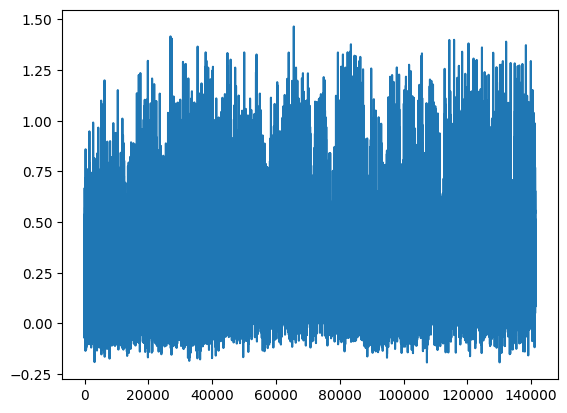

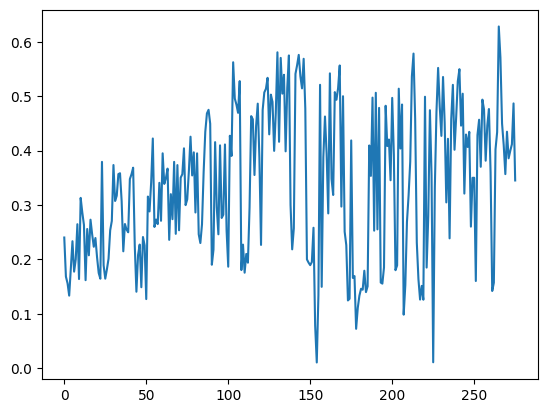

[PPO] Epoch 0: Loss=76.2168, Policy=0.0282, Value=152.4486
[PPO] Epoch 10: Loss=9.2498, Policy=-0.0042, Value=18.5780
[PPO] Epoch 20: Loss=2.0917, Policy=-0.0303, Value=4.3125
[PPO] Epoch 30: Loss=0.6671, Policy=-0.0665, Value=1.5308
Approx KL Learned: 0.1472252756357193
[✅] Actor-Critic checkpoint saved to chkpoint_69.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 70/100 — steps: 2048


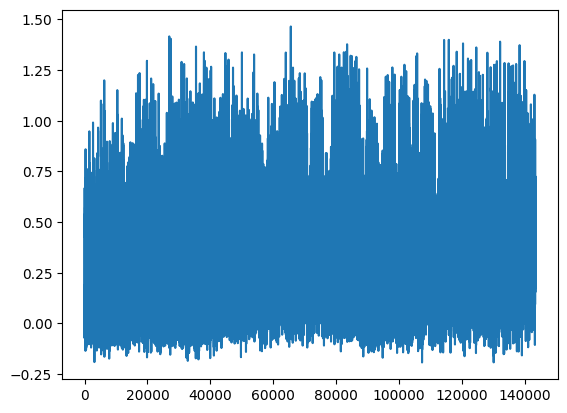

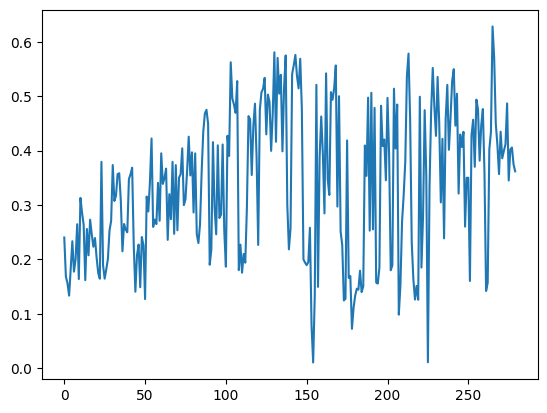

[PPO] Epoch 0: Loss=101.4707, Policy=0.0363, Value=202.9478
[PPO] Epoch 10: Loss=13.8938, Policy=0.0644, Value=27.7293
[PPO] Epoch 20: Loss=2.6653, Policy=0.0231, Value=5.3704
[PPO] Epoch 30: Loss=1.4954, Policy=-0.0327, Value=3.1406
Approx KL Learned: 0.09984023869037628
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 71/100 — steps: 2048


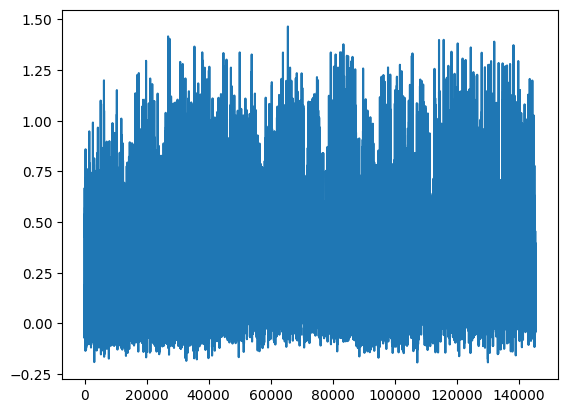

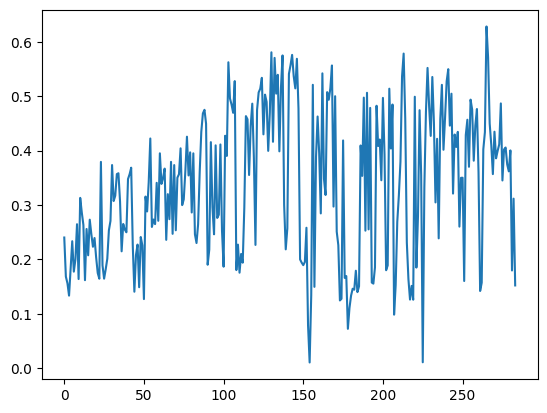

[PPO] Epoch 0: Loss=79.8635, Policy=0.0255, Value=159.7739
[PPO] Epoch 10: Loss=25.2002, Policy=0.0275, Value=50.4432
[PPO] Epoch 20: Loss=7.6355, Policy=0.0181, Value=15.3356
[PPO] Epoch 30: Loss=4.1190, Policy=0.0186, Value=8.3046
Approx KL Learned: 0.06801164150238037
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 72/100 — steps: 2048


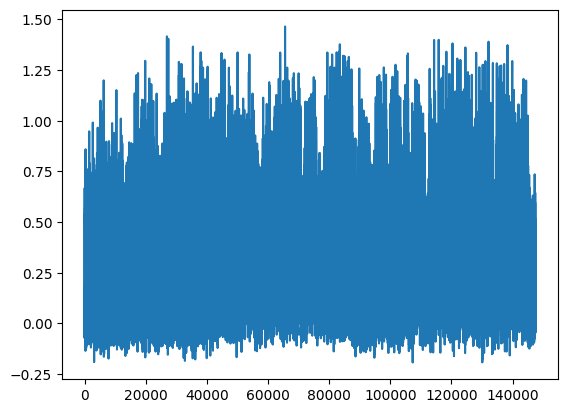

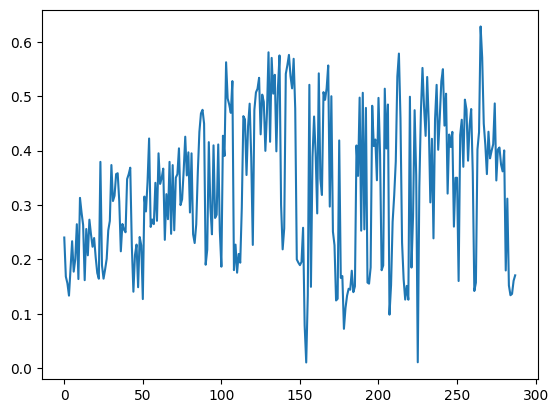

[PPO] Epoch 0: Loss=69.6648, Policy=0.0045, Value=139.4211
[PPO] Epoch 10: Loss=12.2816, Policy=0.0118, Value=24.6360
[PPO] Epoch 20: Loss=3.8622, Policy=0.0017, Value=7.8242
[PPO] Epoch 30: Loss=1.6868, Policy=-0.0227, Value=3.5205
Approx KL Learned: 0.041911620646715164
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 73/100 — steps: 2048


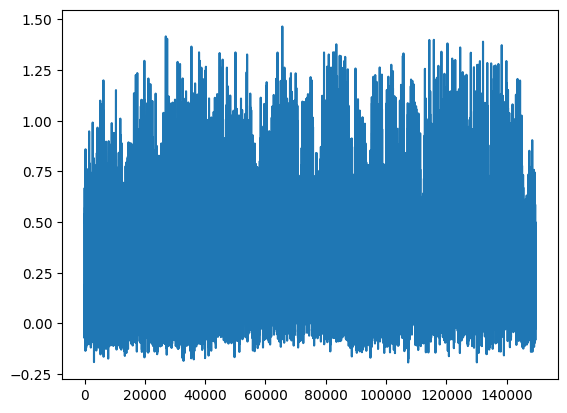

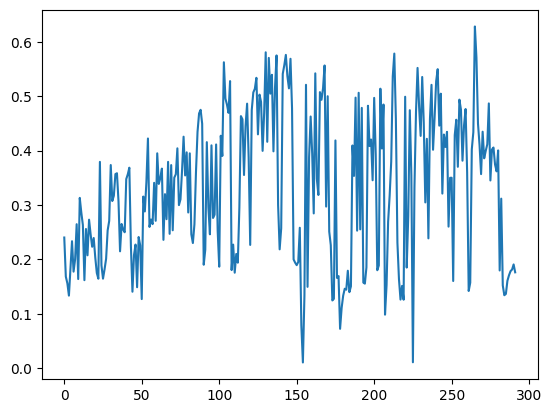

[PPO] Epoch 0: Loss=57.9201, Policy=0.0106, Value=115.9175
[PPO] Epoch 10: Loss=7.3400, Policy=-0.0029, Value=14.7831
[PPO] Epoch 20: Loss=1.6523, Policy=-0.0285, Value=3.4597
[PPO] Epoch 30: Loss=0.8134, Policy=-0.0658, Value=1.8573
Approx KL Learned: 0.07640372216701508
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 74/100 — steps: 2048


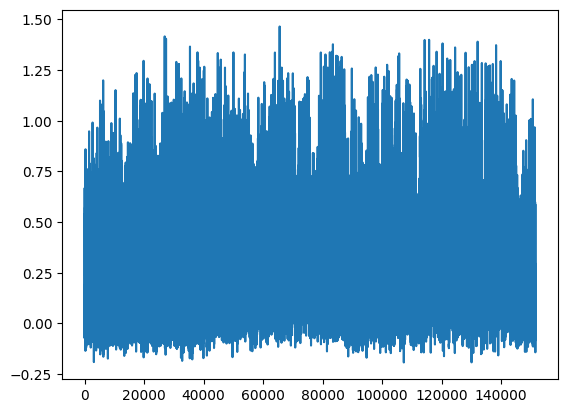

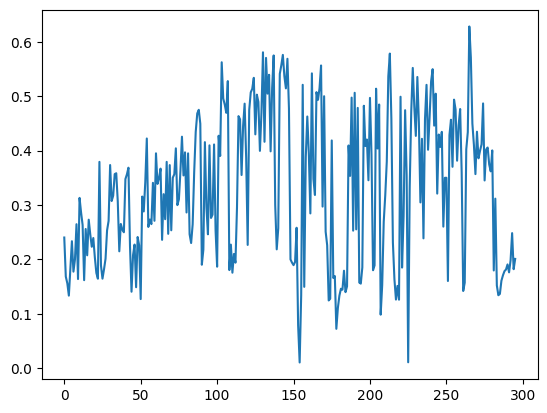

[PPO] Epoch 0: Loss=82.0756, Policy=0.0236, Value=164.1894
[PPO] Epoch 10: Loss=10.0300, Policy=0.0144, Value=20.1099
[PPO] Epoch 20: Loss=2.0813, Policy=-0.0137, Value=4.2756
[PPO] Epoch 30: Loss=0.7443, Policy=-0.0577, Value=1.6870
Approx KL Learned: 0.10446195304393768
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 75/100 — steps: 2048


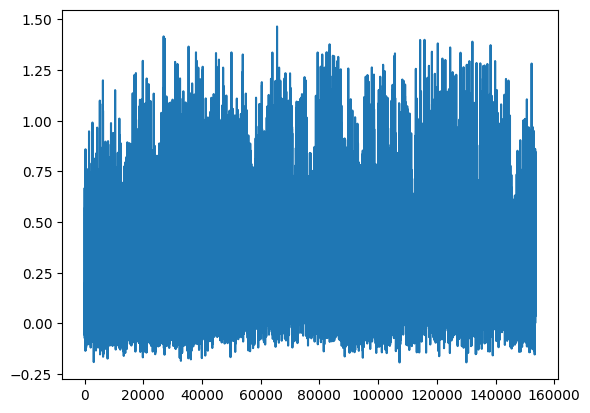

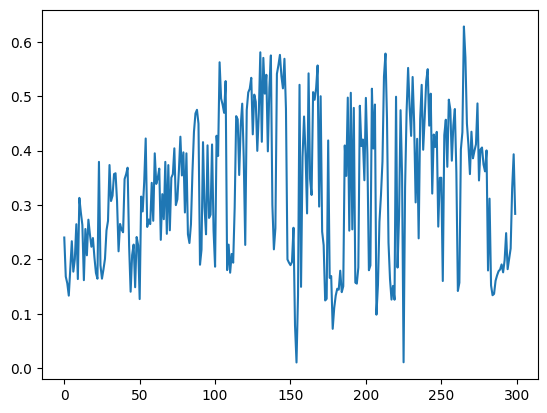

[PPO] Epoch 0: Loss=104.4670, Policy=0.0141, Value=208.9905
[PPO] Epoch 10: Loss=14.7528, Policy=0.0164, Value=29.5528
[PPO] Epoch 20: Loss=2.6336, Policy=-0.0118, Value=5.3769
[PPO] Epoch 30: Loss=0.8316, Policy=-0.0574, Value=1.8627
Approx KL Learned: 0.09740683436393738
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 76/100 — steps: 2048


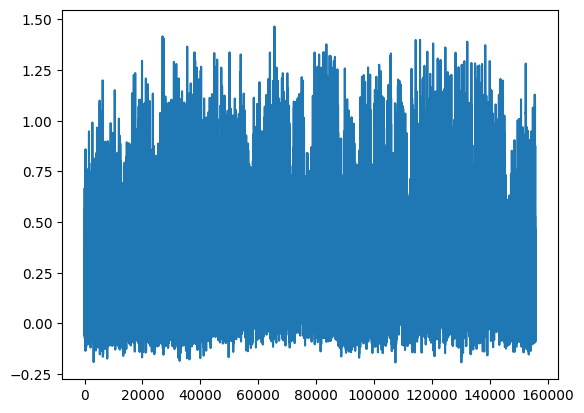

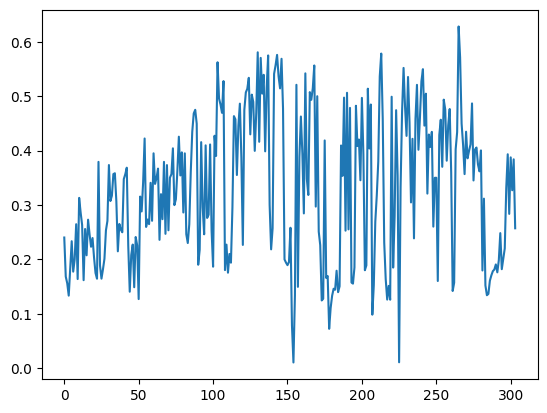

[PPO] Epoch 0: Loss=113.4361, Policy=0.0177, Value=226.9224
[PPO] Epoch 10: Loss=12.5578, Policy=0.0206, Value=25.1585
[PPO] Epoch 20: Loss=4.1133, Policy=0.0135, Value=8.2832
[PPO] Epoch 30: Loss=1.2154, Policy=-0.0307, Value=2.5770
Approx KL Learned: 0.10329059511423111
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 77/100 — steps: 2048


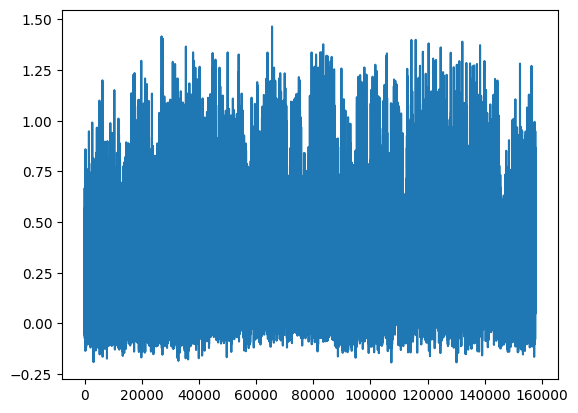

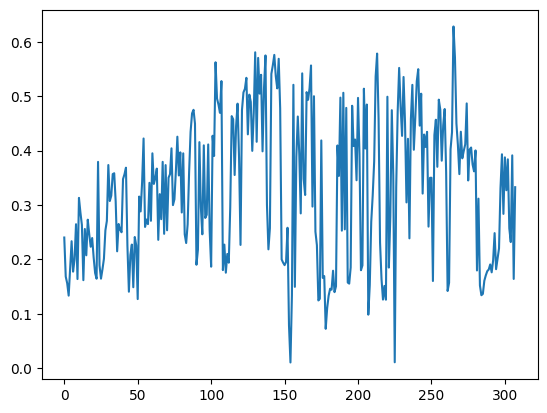

[PPO] Epoch 0: Loss=106.7422, Policy=0.0165, Value=213.5351
[PPO] Epoch 10: Loss=9.0257, Policy=0.0113, Value=18.1109
[PPO] Epoch 20: Loss=2.5113, Policy=-0.0334, Value=5.1745
[PPO] Epoch 30: Loss=1.5497, Policy=-0.0761, Value=3.3358
Approx KL Learned: 0.12717504799365997
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 78/100 — steps: 2048


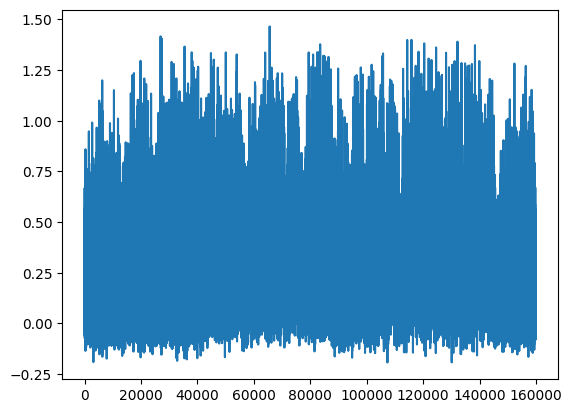

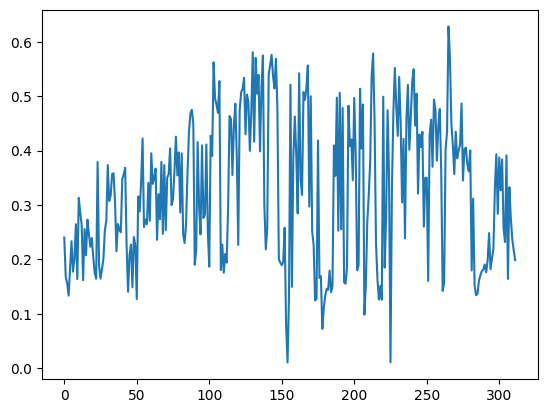

[PPO] Epoch 0: Loss=100.1070, Policy=0.0208, Value=200.2543
[PPO] Epoch 10: Loss=19.0994, Policy=0.0409, Value=38.1975
[PPO] Epoch 20: Loss=8.5261, Policy=0.0160, Value=17.1020
[PPO] Epoch 30: Loss=5.4524, Policy=0.0138, Value=10.9645
Approx KL Learned: 0.06606998294591904
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 79/100 — steps: 2048


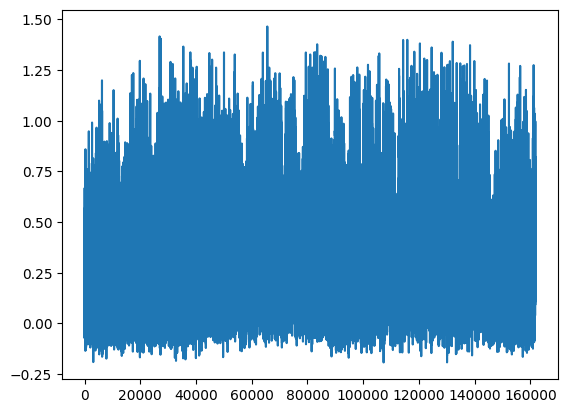

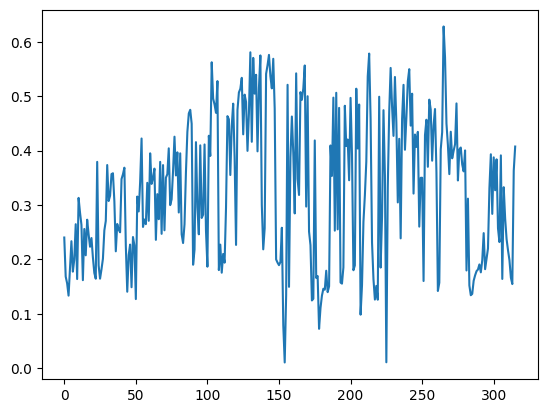

[PPO] Epoch 0: Loss=107.3001, Policy=0.0115, Value=214.6662
[PPO] Epoch 10: Loss=32.1879, Policy=0.0086, Value=64.4466
[PPO] Epoch 20: Loss=15.5367, Policy=0.0006, Value=31.1599
[PPO] Epoch 30: Loss=10.3093, Policy=-0.0353, Value=20.7778
Approx KL Learned: 0.045854151248931885
[✅] Actor-Critic checkpoint saved to chkpoint_79.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 80/100 — steps: 2048


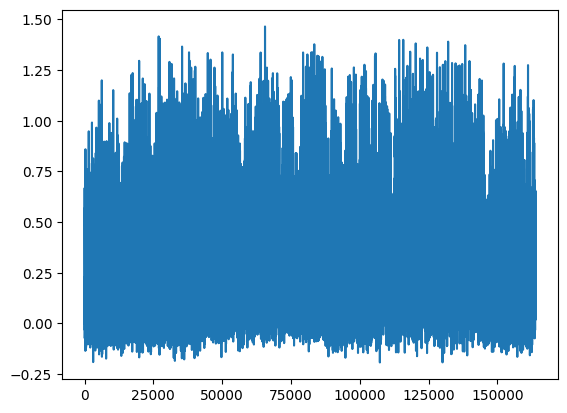

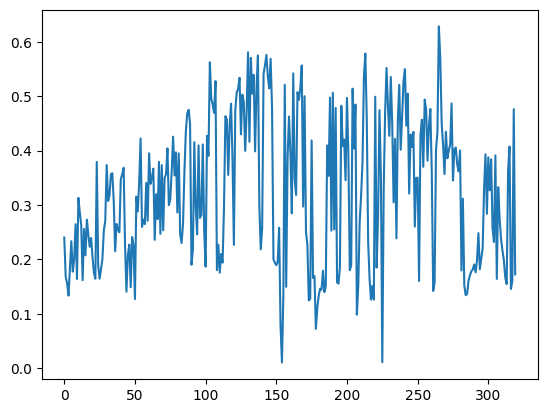

[PPO] Epoch 0: Loss=98.8545, Policy=0.0395, Value=197.6973
[PPO] Epoch 10: Loss=24.8996, Policy=0.0376, Value=49.7853
[PPO] Epoch 20: Loss=4.8105, Policy=0.0094, Value=9.6699
[PPO] Epoch 30: Loss=1.9912, Policy=-0.0378, Value=4.1256
Approx KL Learned: 0.1391625851392746
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 81/100 — steps: 2048


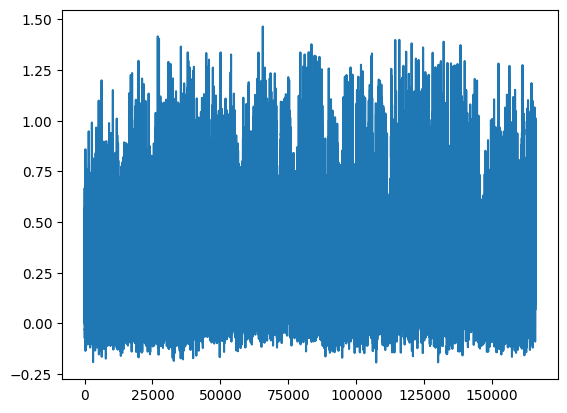

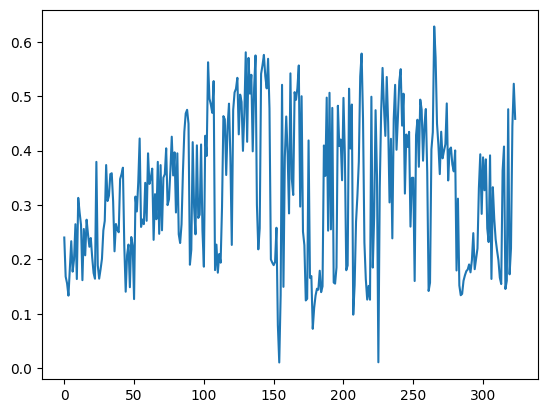

[PPO] Epoch 0: Loss=132.7696, Policy=0.0176, Value=265.5861
[PPO] Epoch 10: Loss=35.1600, Policy=0.0662, Value=70.2646
[PPO] Epoch 20: Loss=10.4047, Policy=0.0071, Value=20.8756
[PPO] Epoch 30: Loss=6.7999, Policy=-0.0340, Value=13.7489
Approx KL Learned: 0.11869239807128906
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 82/100 — steps: 2048


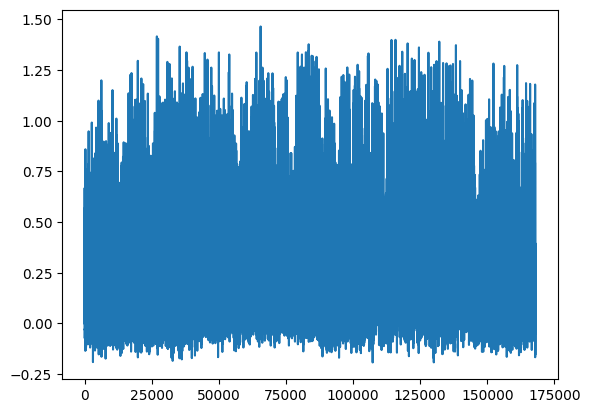

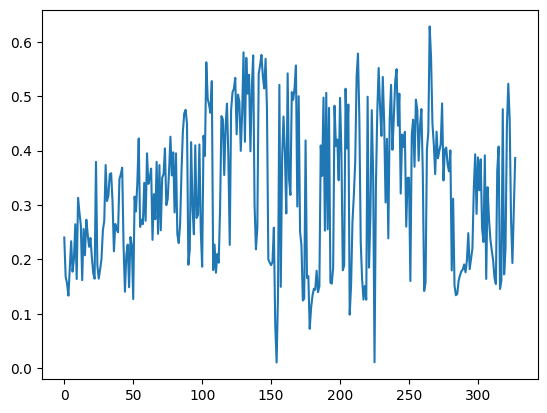

[PPO] Epoch 0: Loss=133.1820, Policy=0.0260, Value=266.3762
[PPO] Epoch 10: Loss=29.1340, Policy=0.0257, Value=58.2801
[PPO] Epoch 20: Loss=11.3740, Policy=0.0239, Value=22.7635
[PPO] Epoch 30: Loss=2.4847, Policy=-0.0068, Value=5.0509
Approx KL Learned: 0.11671923846006393
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 83/100 — steps: 2048


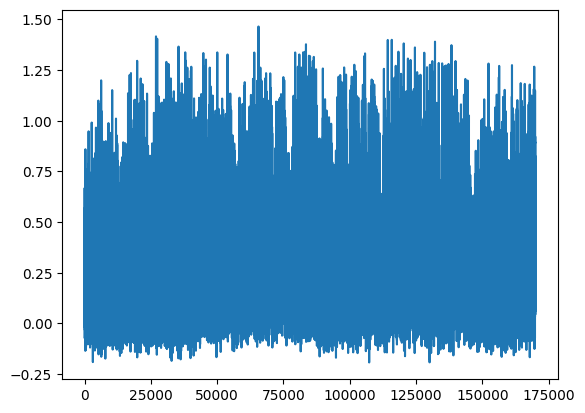

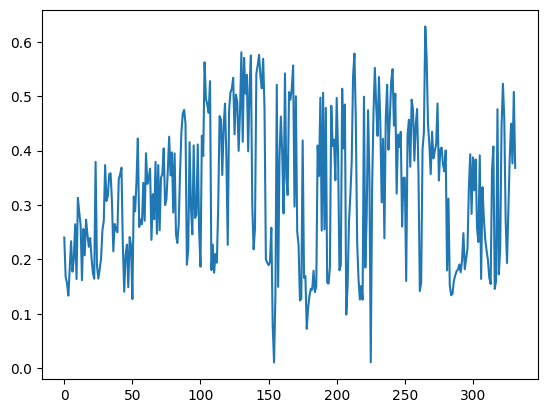

[PPO] Epoch 0: Loss=119.8344, Policy=0.0212, Value=239.7014
[PPO] Epoch 10: Loss=38.9802, Policy=0.0442, Value=77.9515
[PPO] Epoch 20: Loss=6.7189, Policy=0.0181, Value=13.4767
[PPO] Epoch 30: Loss=2.1390, Policy=-0.0119, Value=4.3807
Approx KL Learned: 0.09010123461484909
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 84/100 — steps: 2048


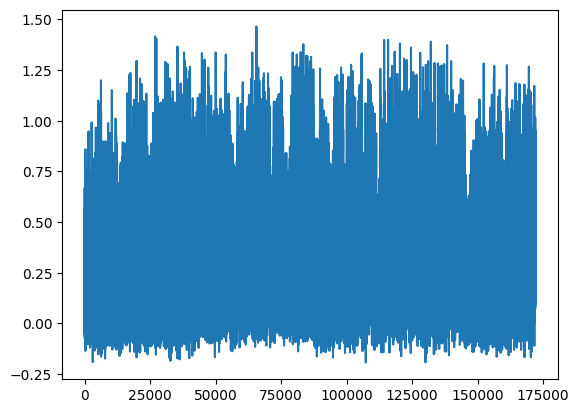

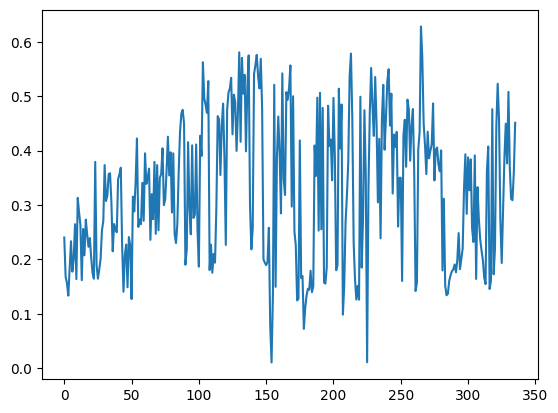

[PPO] Epoch 0: Loss=107.0868, Policy=0.0238, Value=214.2158
[PPO] Epoch 10: Loss=14.6599, Policy=0.0312, Value=29.3529
[PPO] Epoch 20: Loss=4.9160, Policy=0.0197, Value=9.8839
[PPO] Epoch 30: Loss=1.7875, Policy=-0.0029, Value=3.6750
Approx KL Learned: 0.038578566163778305
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 85/100 — steps: 2048


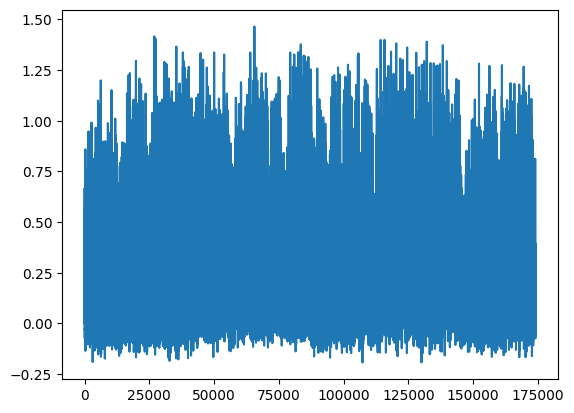

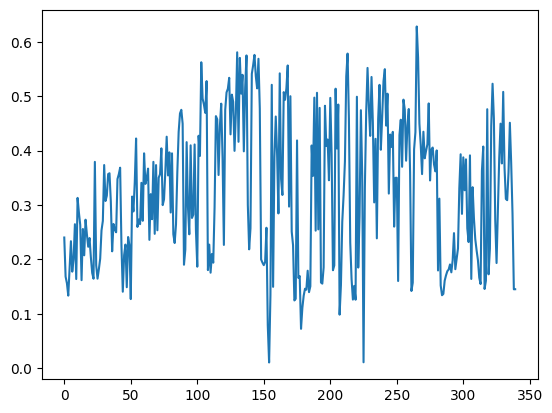

[PPO] Epoch 0: Loss=85.5173, Policy=0.0030, Value=171.1239
[PPO] Epoch 10: Loss=9.8212, Policy=0.0124, Value=19.7104
[PPO] Epoch 20: Loss=3.0108, Policy=-0.0132, Value=6.1432
[PPO] Epoch 30: Loss=1.4904, Policy=-0.0398, Value=3.1556
Approx KL Learned: 0.051092784851789474
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 86/100 — steps: 2048


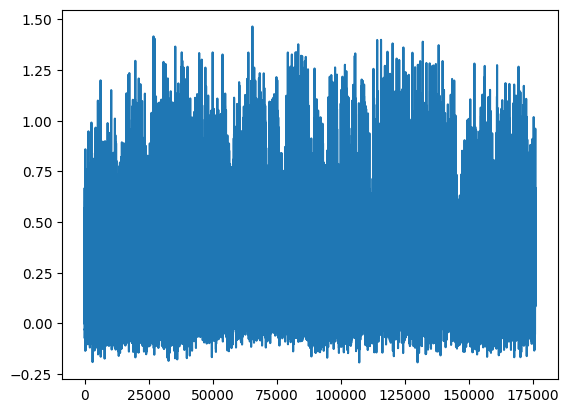

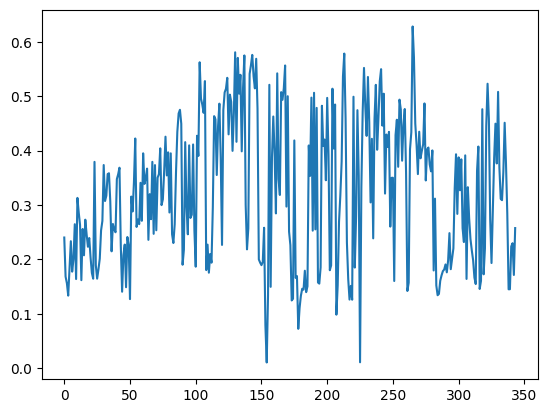

[PPO] Epoch 0: Loss=104.5450, Policy=0.0212, Value=209.1228
[PPO] Epoch 10: Loss=21.7383, Policy=0.0283, Value=43.4916
[PPO] Epoch 20: Loss=4.6828, Policy=-0.0030, Value=9.4486
[PPO] Epoch 30: Loss=1.3762, Policy=-0.0349, Value=2.8990
Approx KL Learned: 0.10439105331897736
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 87/100 — steps: 2048


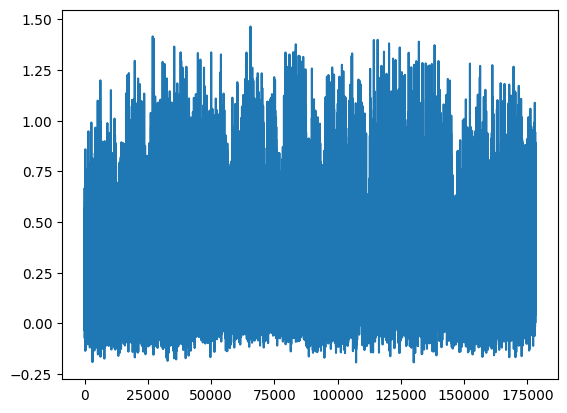

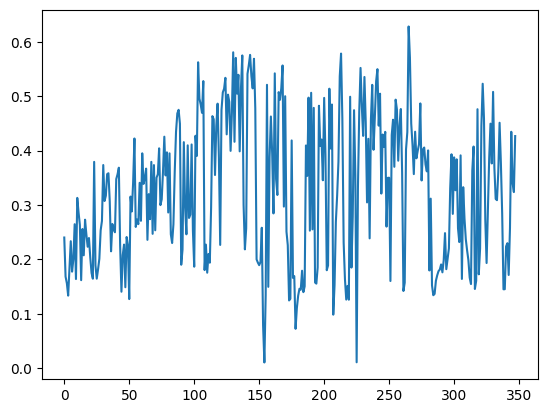

[PPO] Epoch 0: Loss=83.5339, Policy=0.0225, Value=167.1055
[PPO] Epoch 10: Loss=14.8218, Policy=0.0144, Value=29.6938
[PPO] Epoch 20: Loss=2.8562, Policy=-0.0110, Value=5.8167
[PPO] Epoch 30: Loss=1.3989, Policy=-0.0463, Value=2.9697
Approx KL Learned: 0.09009535610675812
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 88/100 — steps: 2048


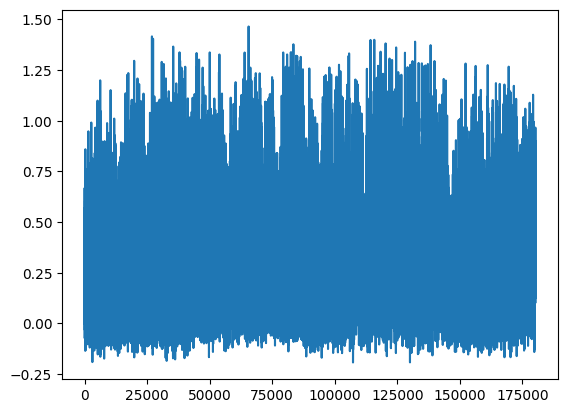

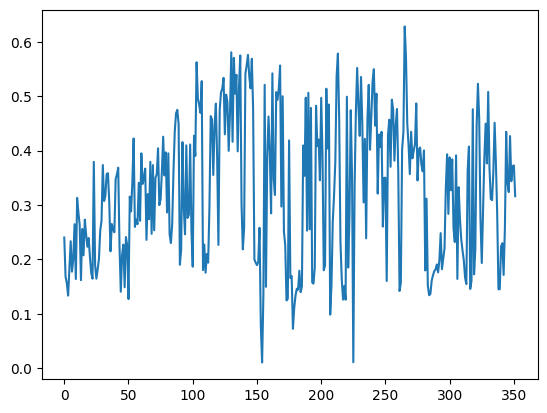

[PPO] Epoch 0: Loss=72.1994, Policy=0.0219, Value=144.4458
[PPO] Epoch 10: Loss=10.1682, Policy=0.0188, Value=20.3880
[PPO] Epoch 20: Loss=3.0243, Policy=-0.0083, Value=6.1570
[PPO] Epoch 30: Loss=1.3675, Policy=-0.0558, Value=2.9353
Approx KL Learned: 0.08529908955097198
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 89/100 — steps: 2048


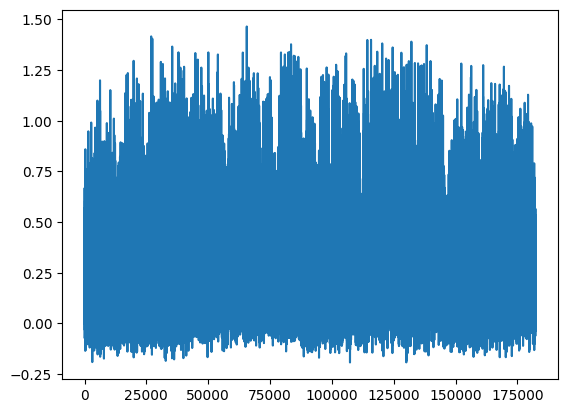

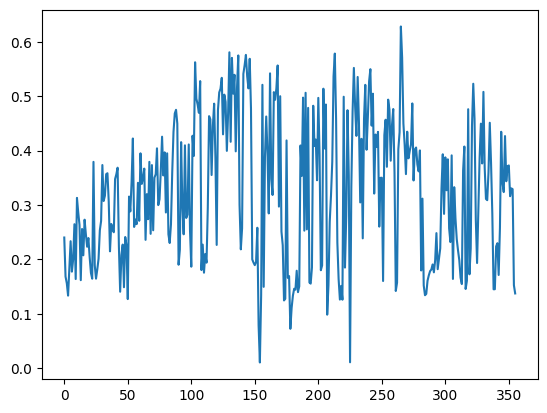

[PPO] Epoch 0: Loss=92.4529, Policy=0.0201, Value=184.9598
[PPO] Epoch 10: Loss=13.7025, Policy=0.0108, Value=27.4785
[PPO] Epoch 20: Loss=2.8757, Policy=-0.0147, Value=5.8769
[PPO] Epoch 30: Loss=1.2479, Policy=-0.0691, Value=2.7252
Approx KL Learned: 0.08478415012359619
[✅] Actor-Critic checkpoint saved to chkpoint_89.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 90/100 — steps: 2048


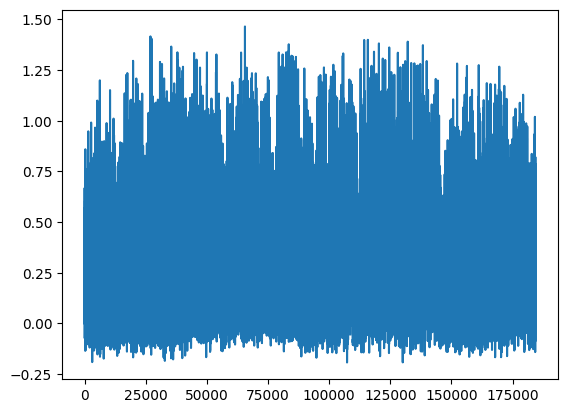

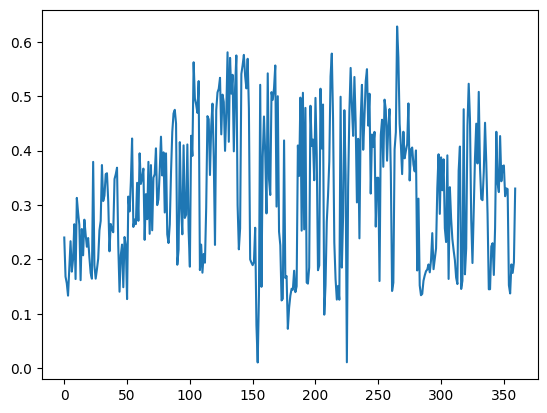

[PPO] Epoch 0: Loss=117.3385, Policy=0.0265, Value=234.6823
[PPO] Epoch 10: Loss=31.3695, Policy=0.0322, Value=62.7277
[PPO] Epoch 20: Loss=4.4257, Policy=0.0143, Value=8.8826
[PPO] Epoch 30: Loss=2.3264, Policy=-0.0357, Value=4.7868
Approx KL Learned: 0.13878744840621948
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 91/100 — steps: 2048


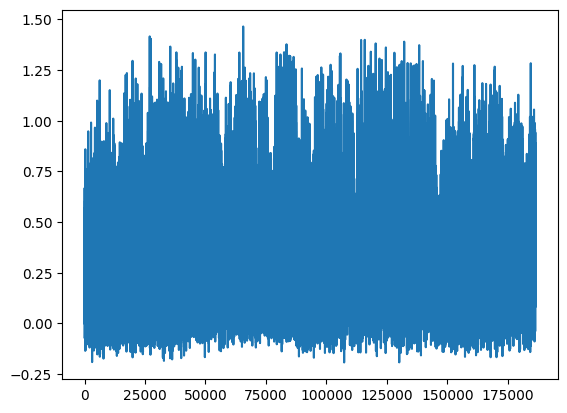

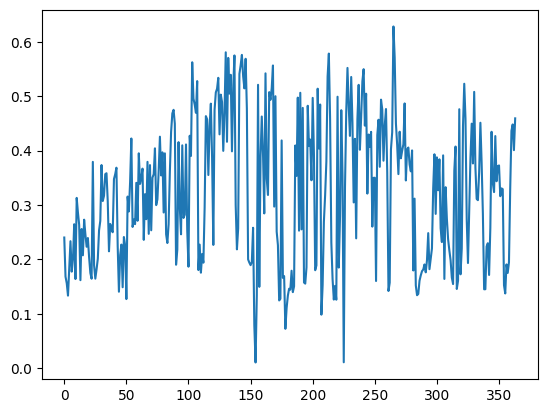

[PPO] Epoch 0: Loss=93.4081, Policy=0.0311, Value=186.8323
[PPO] Epoch 10: Loss=8.2461, Policy=0.0146, Value=16.5404
[PPO] Epoch 20: Loss=2.1327, Policy=-0.0225, Value=4.3889
[PPO] Epoch 30: Loss=0.7215, Policy=-0.0711, Value=1.6625
Approx KL Learned: 0.08176833391189575
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 92/100 — steps: 2048


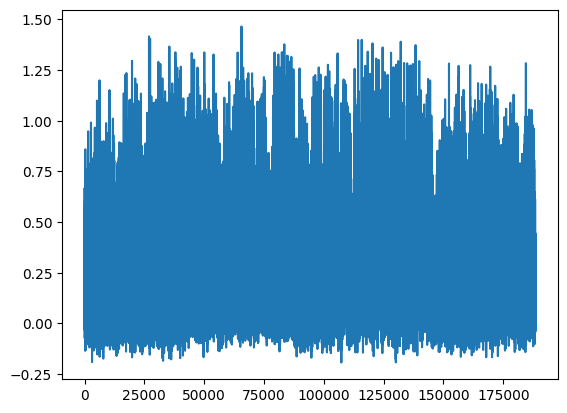

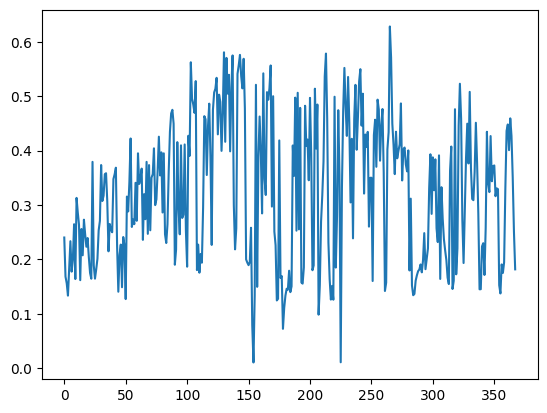

[PPO] Epoch 0: Loss=64.8719, Policy=0.0292, Value=129.7677
[PPO] Epoch 10: Loss=10.3888, Policy=0.0302, Value=20.8026
[PPO] Epoch 20: Loss=2.7661, Policy=0.0028, Value=5.6110
[PPO] Epoch 30: Loss=1.2482, Policy=-0.0490, Value=2.6758
Approx KL Learned: 0.11131876707077026
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 93/100 — steps: 2048


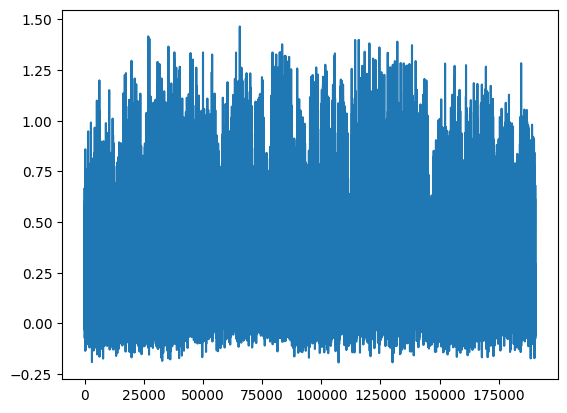

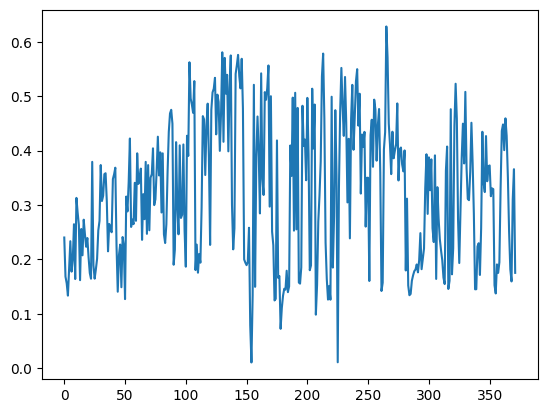

[PPO] Epoch 0: Loss=97.6463, Policy=0.0329, Value=195.3198
[PPO] Epoch 10: Loss=23.9566, Policy=0.0363, Value=47.9301
[PPO] Epoch 20: Loss=8.0448, Policy=0.0074, Value=16.1700
[PPO] Epoch 30: Loss=3.5806, Policy=-0.0142, Value=7.2832
Approx KL Learned: 0.06213405728340149
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 94/100 — steps: 2048


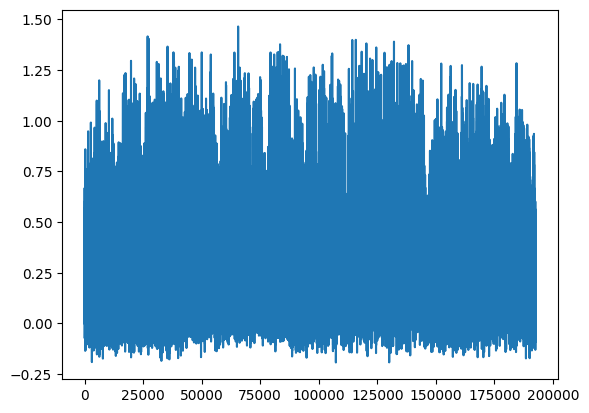

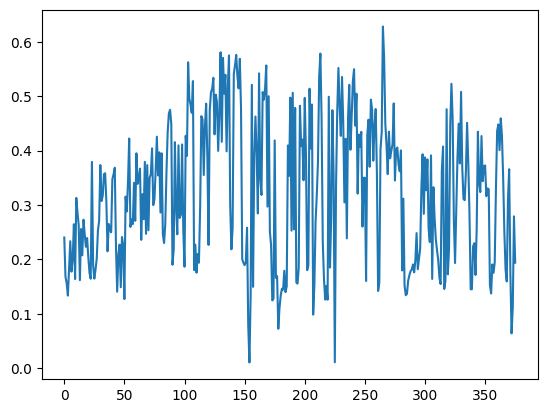

[PPO] Epoch 0: Loss=109.2732, Policy=0.0236, Value=218.5947
[PPO] Epoch 10: Loss=27.6442, Policy=0.0299, Value=55.3219
[PPO] Epoch 20: Loss=14.0646, Policy=0.0208, Value=28.1842
[PPO] Epoch 30: Loss=8.6621, Policy=0.0025, Value=17.4160
Approx KL Learned: 0.05329856276512146
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 95/100 — steps: 2048


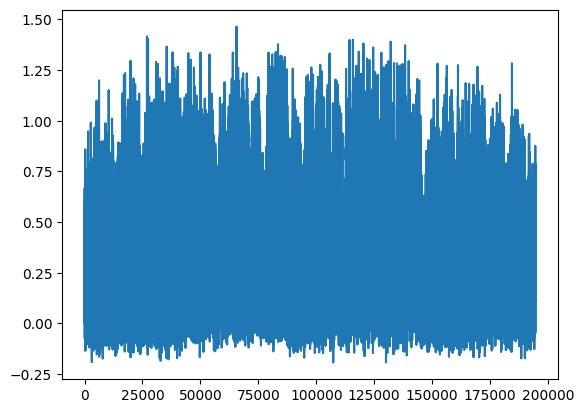

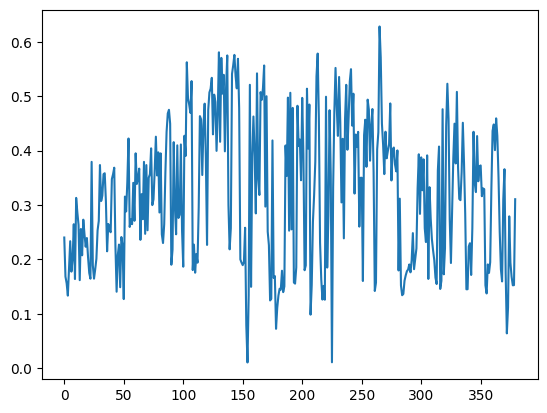

[PPO] Epoch 0: Loss=105.1034, Policy=0.0182, Value=210.2643
[PPO] Epoch 10: Loss=31.8564, Policy=0.0170, Value=63.7711
[PPO] Epoch 20: Loss=22.2459, Policy=-0.0062, Value=44.5993
[PPO] Epoch 30: Loss=19.7898, Policy=-0.0195, Value=39.7120
Approx KL Learned: 0.048808254301548004
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 96/100 — steps: 2048


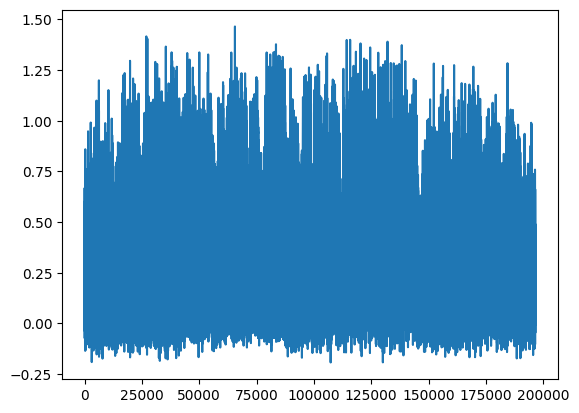

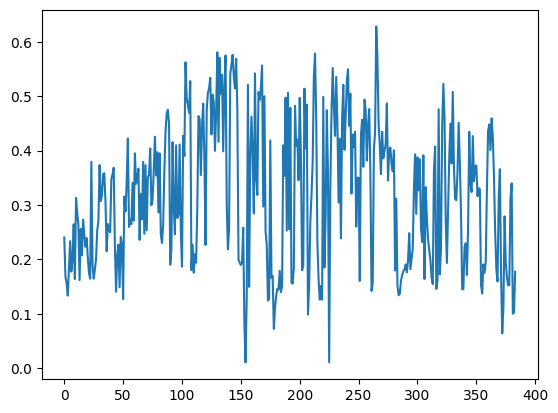

[PPO] Epoch 0: Loss=75.4671, Policy=0.0124, Value=151.0122
[PPO] Epoch 10: Loss=10.1044, Policy=0.0078, Value=20.2963
[PPO] Epoch 20: Loss=5.1145, Policy=0.0009, Value=10.3323
[PPO] Epoch 30: Loss=1.9907, Policy=-0.0216, Value=4.1284
Approx KL Learned: 0.04936831444501877
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 97/100 — steps: 2048


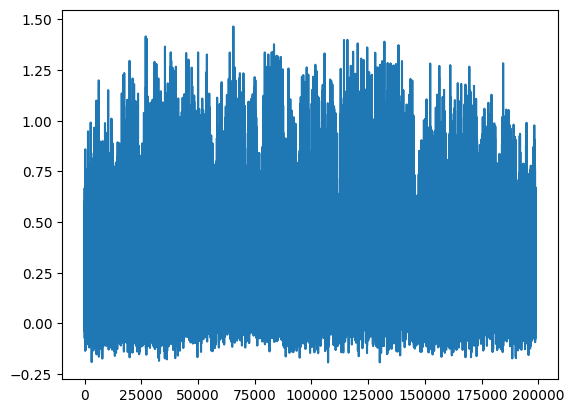

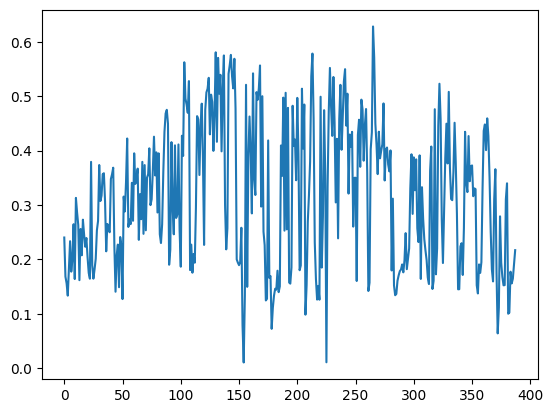

[PPO] Epoch 0: Loss=91.6613, Policy=0.0101, Value=183.4008
[PPO] Epoch 10: Loss=29.6666, Policy=0.0151, Value=59.3968
[PPO] Epoch 20: Loss=9.9487, Policy=0.0059, Value=19.9803
[PPO] Epoch 30: Loss=5.8239, Policy=-0.0213, Value=11.7881
Approx KL Learned: 0.025803882628679276
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 98/100 — steps: 2048


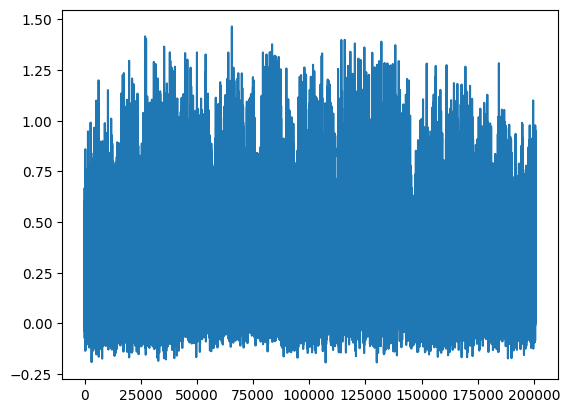

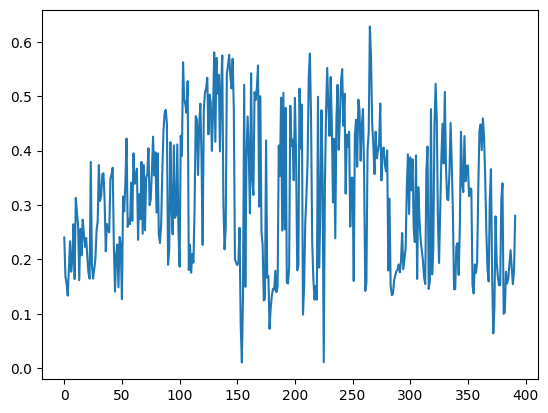

[PPO] Epoch 0: Loss=142.4972, Policy=0.0116, Value=285.0550
[PPO] Epoch 10: Loss=56.7339, Policy=0.0225, Value=113.5106
[PPO] Epoch 20: Loss=21.1939, Policy=0.0163, Value=42.4402
[PPO] Epoch 30: Loss=12.2371, Policy=-0.0025, Value=24.5665
Approx KL Learned: 0.04315986484289169
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 99/100 — steps: 2048


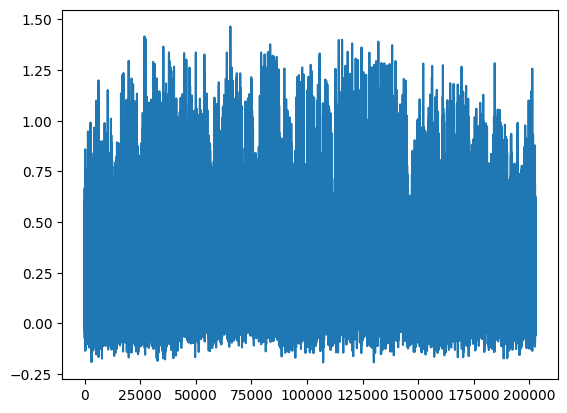

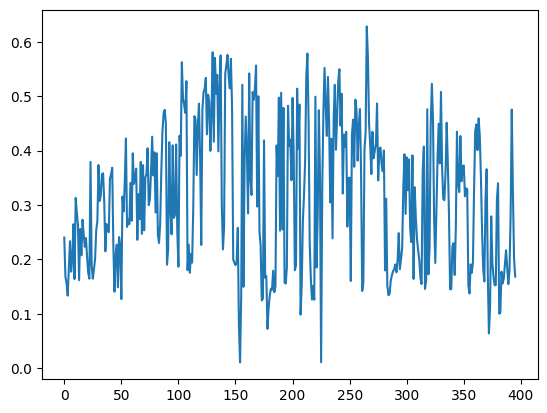

[PPO] Epoch 0: Loss=132.8920, Policy=0.0094, Value=265.8513
[PPO] Epoch 10: Loss=39.0164, Policy=0.0200, Value=78.0772
[PPO] Epoch 20: Loss=20.4036, Policy=0.0256, Value=40.8421
[PPO] Epoch 30: Loss=13.5837, Policy=0.0122, Value=27.2273
Approx KL Learned: 0.04995600879192352
[✅] Actor-Critic checkpoint saved to chkpoint_99.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 100/100 — steps: 2048


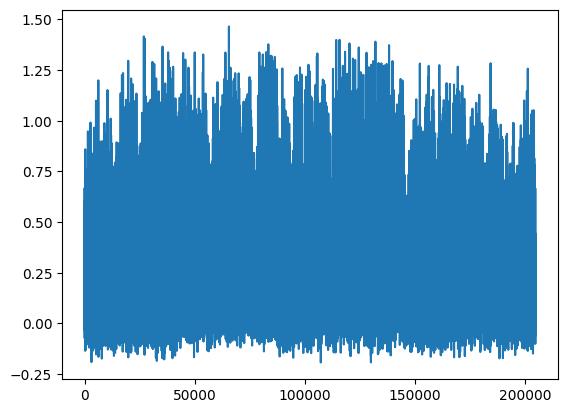

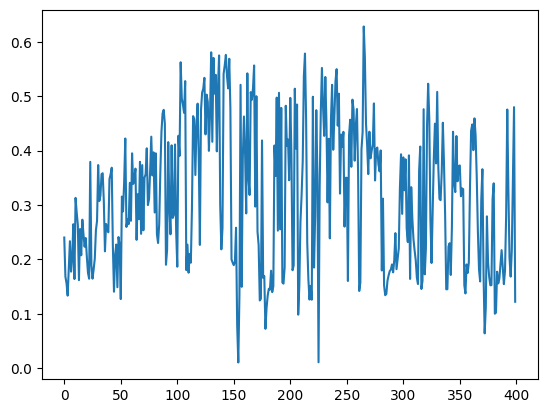

In [14]:
buf, rewards = train(controller, "clip_actor_critic_checkpoint_long_training.pt", ppo, clip_env, clip_actor_critic, 100)

[PPO] Epoch 0: Loss=88.0769, Policy=0.0110, Value=176.1808
[PPO] Epoch 10: Loss=30.1053, Policy=-0.0079, Value=60.2778
[PPO] Epoch 20: Loss=17.4728, Policy=-0.0293, Value=35.0505
[PPO] Epoch 30: Loss=10.0778, Policy=-0.0471, Value=20.2991
Approx KL Learned: 0.05416448414325714
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 1/100 — steps: 2048


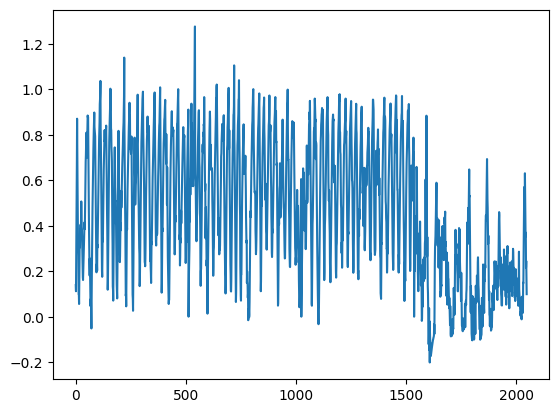

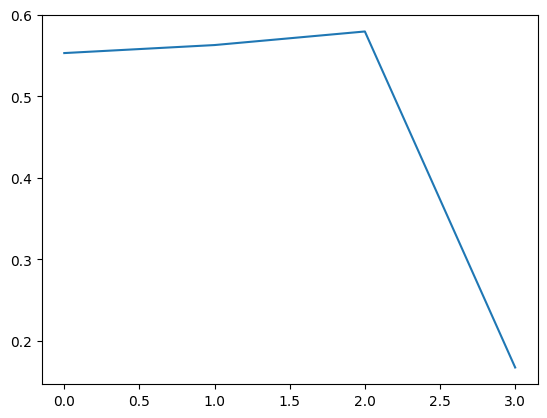

[PPO] Epoch 0: Loss=118.9301, Policy=0.0110, Value=237.9253
[PPO] Epoch 10: Loss=38.5040, Policy=0.0093, Value=77.0763
[PPO] Epoch 20: Loss=34.6468, Policy=-0.0077, Value=69.3943
[PPO] Epoch 30: Loss=30.2992, Policy=-0.0023, Value=60.6897
Approx KL Learned: 0.03507554903626442
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 2/100 — steps: 2048


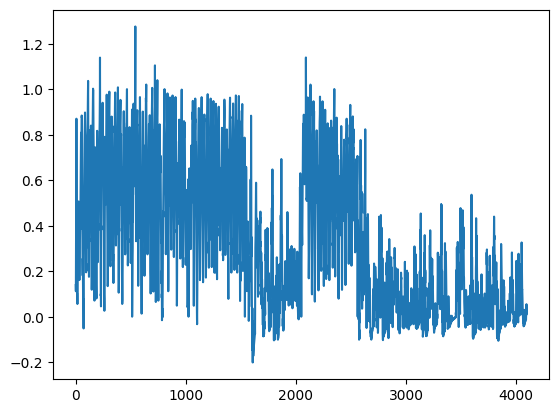

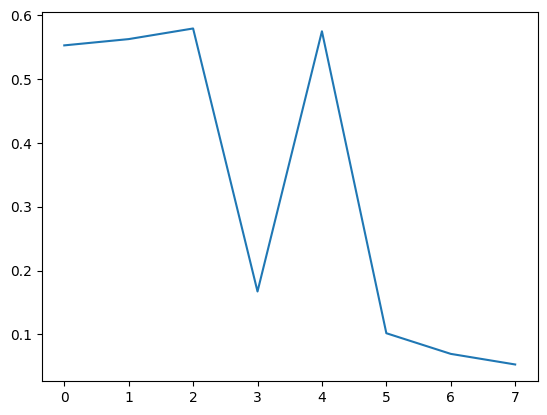

[PPO] Epoch 0: Loss=158.3675, Policy=0.0158, Value=316.7791
[PPO] Epoch 10: Loss=77.4949, Policy=0.0057, Value=155.0553
[PPO] Epoch 20: Loss=45.9489, Policy=-0.0220, Value=92.0196
[PPO] Epoch 30: Loss=35.6091, Policy=-0.0419, Value=71.3778
Approx KL Learned: 0.06047386676073074
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 3/100 — steps: 2048


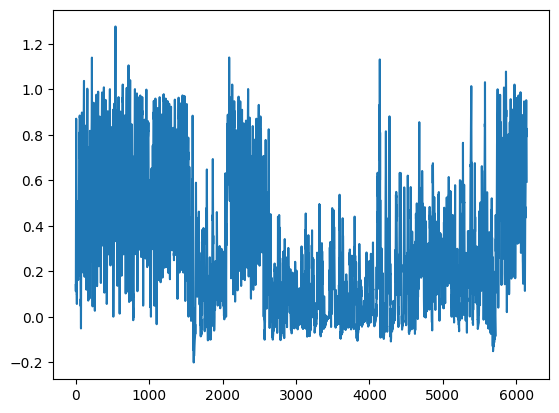

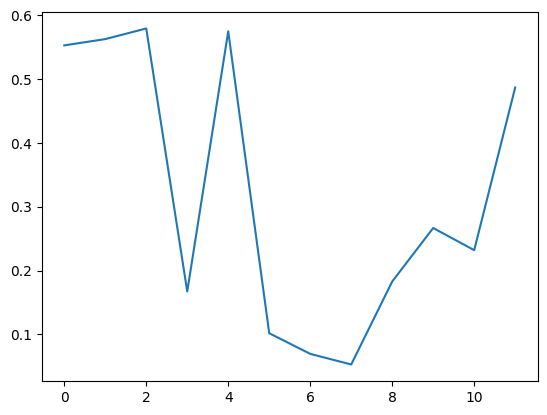

[PPO] Epoch 0: Loss=179.1168, Policy=0.0068, Value=358.2975
[PPO] Epoch 10: Loss=80.3137, Policy=0.0144, Value=160.6830
[PPO] Epoch 20: Loss=37.9387, Policy=-0.0140, Value=75.9932
[PPO] Epoch 30: Loss=21.4623, Policy=-0.0307, Value=43.0688
Approx KL Learned: 0.08193258941173553
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 4/100 — steps: 2048


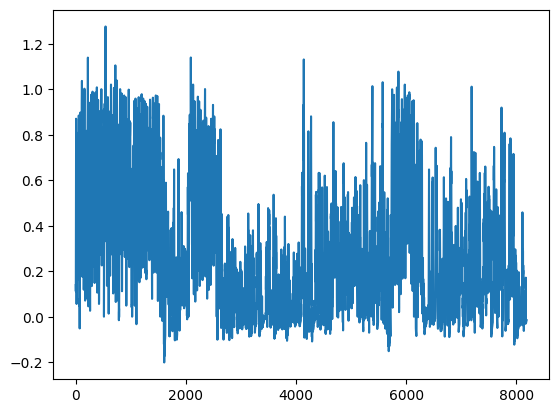

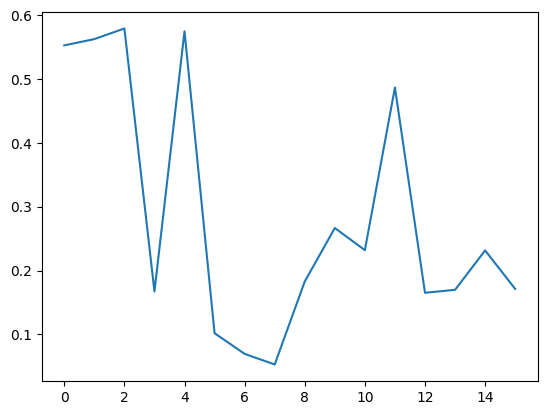

[PPO] Epoch 0: Loss=112.9537, Policy=0.0111, Value=225.9465
[PPO] Epoch 10: Loss=60.2272, Policy=-0.0044, Value=120.5255
[PPO] Epoch 20: Loss=38.4308, Policy=-0.0232, Value=76.9759
[PPO] Epoch 30: Loss=34.3651, Policy=-0.0456, Value=68.8886
Approx KL Learned: 0.09468930214643478
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 5/100 — steps: 2048


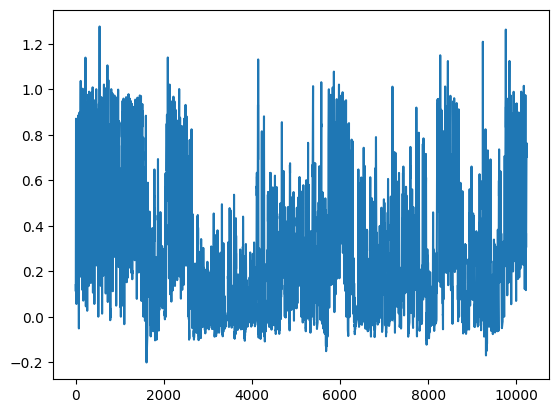

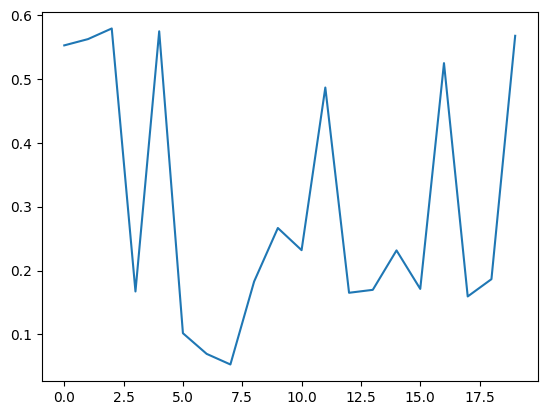

[PPO] Epoch 0: Loss=163.0760, Policy=0.0132, Value=326.1654
[PPO] Epoch 10: Loss=57.4838, Policy=0.0061, Value=114.9953
[PPO] Epoch 20: Loss=36.2213, Policy=0.0009, Value=72.4814
[PPO] Epoch 30: Loss=21.0974, Policy=-0.0129, Value=42.2629
Approx KL Learned: 0.06790877878665924
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 6/100 — steps: 2048


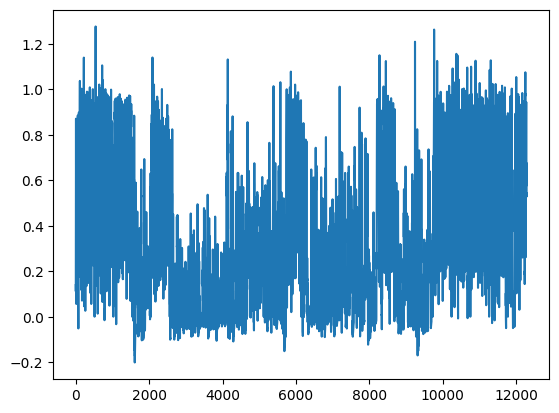

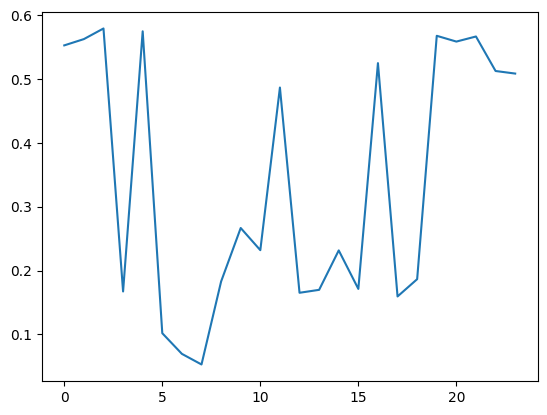

[PPO] Epoch 0: Loss=130.7062, Policy=0.0150, Value=261.4396
[PPO] Epoch 10: Loss=53.6498, Policy=0.0053, Value=107.3400
[PPO] Epoch 20: Loss=23.2827, Policy=-0.0173, Value=46.6516
[PPO] Epoch 30: Loss=18.5008, Policy=-0.0269, Value=37.1108
Approx KL Learned: 0.0548524372279644
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 7/100 — steps: 2048


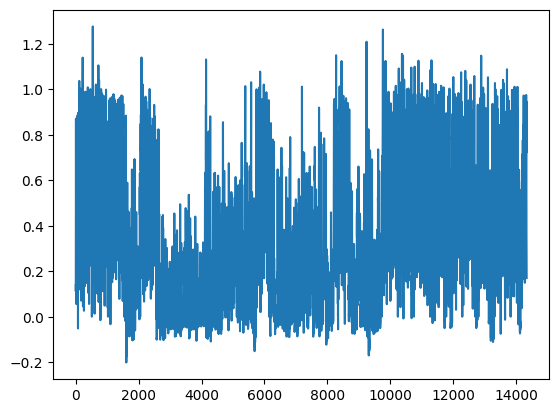

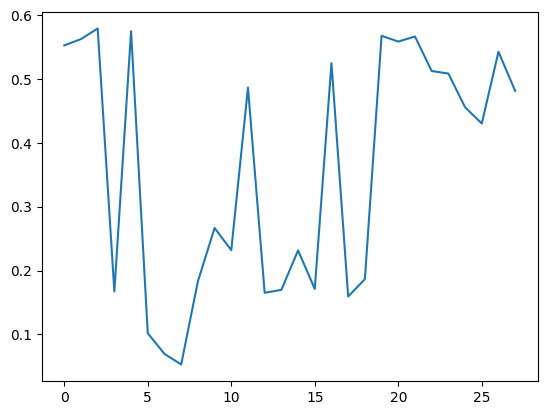

[PPO] Epoch 0: Loss=81.3106, Policy=0.0139, Value=162.6497
[PPO] Epoch 10: Loss=24.5657, Policy=-0.0041, Value=49.1938
[PPO] Epoch 20: Loss=15.5588, Policy=-0.0157, Value=31.2025
[PPO] Epoch 30: Loss=7.7016, Policy=-0.0378, Value=15.5334
Approx KL Learned: 0.02943704091012478
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 8/100 — steps: 2048


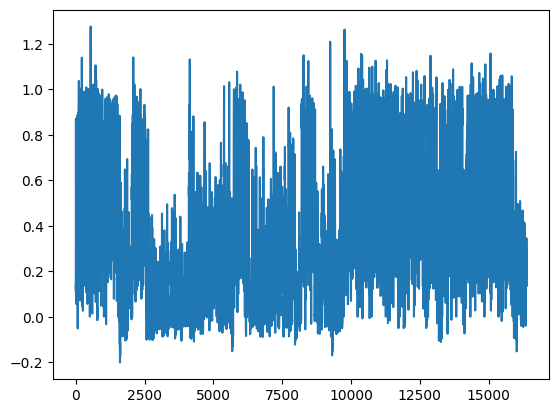

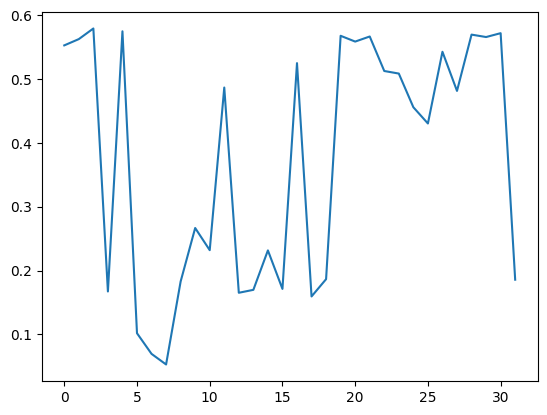

[PPO] Epoch 0: Loss=76.1420, Policy=0.0104, Value=152.3048
[PPO] Epoch 10: Loss=33.7571, Policy=-0.0002, Value=67.5489
[PPO] Epoch 20: Loss=19.5022, Policy=-0.0147, Value=39.0746
[PPO] Epoch 30: Loss=15.6363, Policy=-0.0189, Value=31.3537
Approx KL Learned: 0.0577954426407814
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 9/100 — steps: 2048


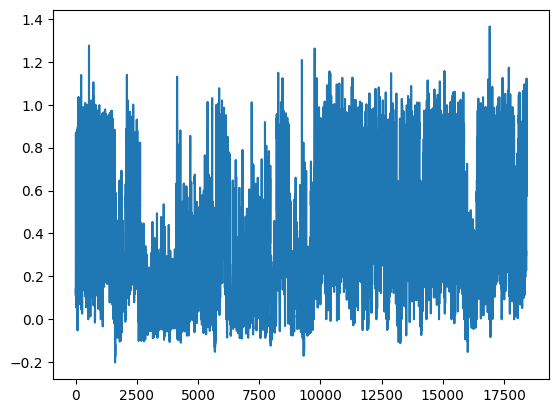

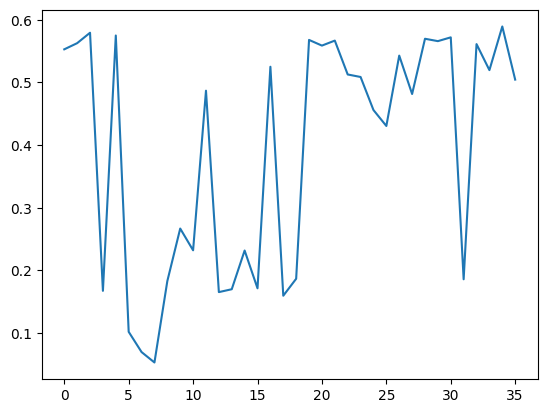

[PPO] Epoch 0: Loss=65.4605, Policy=0.0068, Value=130.9464
[PPO] Epoch 10: Loss=37.5556, Policy=-0.0014, Value=75.1552
[PPO] Epoch 20: Loss=26.3425, Policy=-0.0116, Value=52.7543
[PPO] Epoch 30: Loss=17.5477, Policy=-0.0273, Value=35.1977
Approx KL Learned: 0.07614479959011078
[✅] Actor-Critic checkpoint saved to chkpoint_9.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 10/100 — steps: 2048


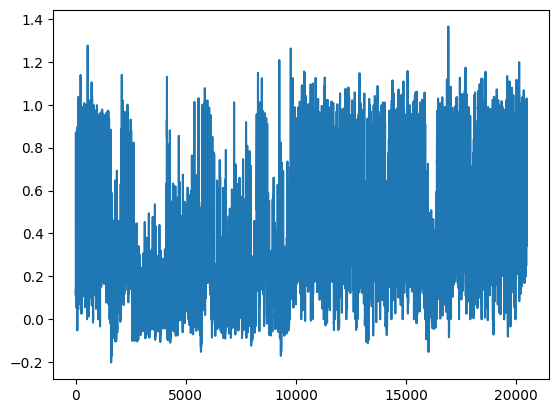

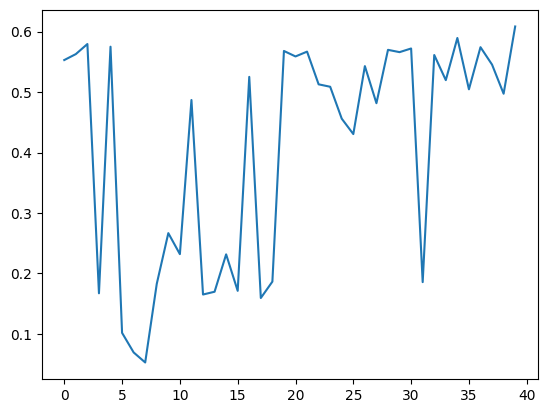

[PPO] Epoch 0: Loss=85.4142, Policy=0.0075, Value=170.8826
[PPO] Epoch 10: Loss=37.8107, Policy=-0.0108, Value=75.7091
[PPO] Epoch 20: Loss=23.4573, Policy=-0.0312, Value=47.0436
[PPO] Epoch 30: Loss=13.9388, Policy=-0.0460, Value=28.0359
Approx KL Learned: 0.04759887978434563
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 11/100 — steps: 2048


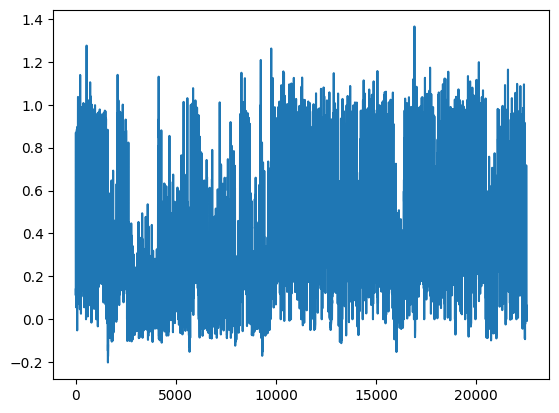

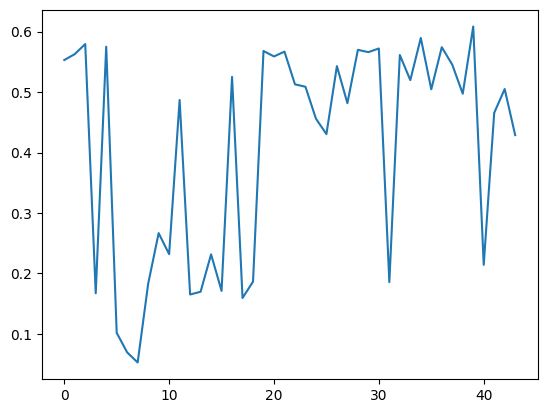

[PPO] Epoch 0: Loss=67.8909, Policy=0.0234, Value=135.7788
[PPO] Epoch 10: Loss=32.2581, Policy=0.0012, Value=64.5533
[PPO] Epoch 20: Loss=17.9830, Policy=-0.0261, Value=36.0628
[PPO] Epoch 30: Loss=13.5427, Policy=-0.0379, Value=27.2057
Approx KL Learned: 0.09436649084091187
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 12/100 — steps: 2048


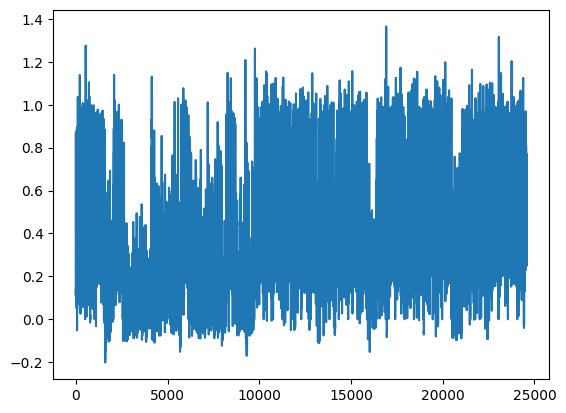

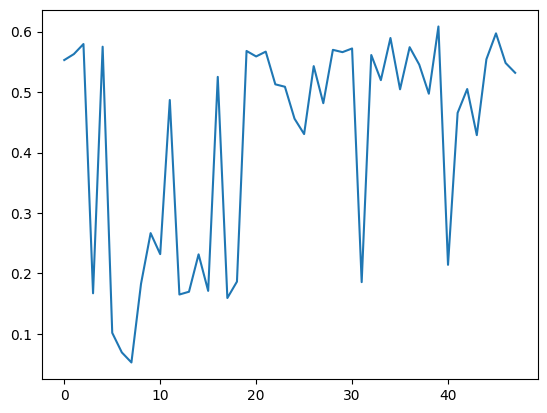

[PPO] Epoch 0: Loss=137.4070, Policy=0.0063, Value=274.9008
[PPO] Epoch 10: Loss=71.3544, Policy=-0.0003, Value=142.8084
[PPO] Epoch 20: Loss=34.5952, Policy=-0.0175, Value=69.3238
[PPO] Epoch 30: Loss=31.2920, Policy=-0.0352, Value=62.7493
Approx KL Learned: 0.027527639642357826
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 13/100 — steps: 2048


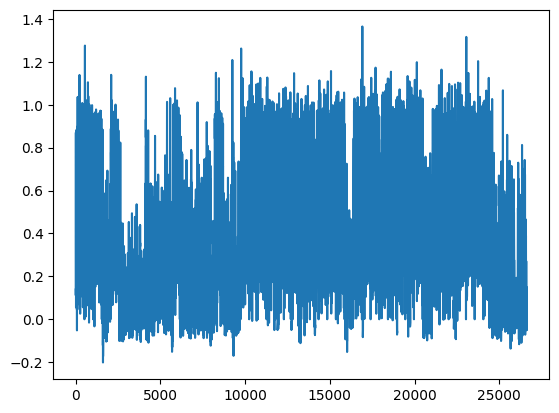

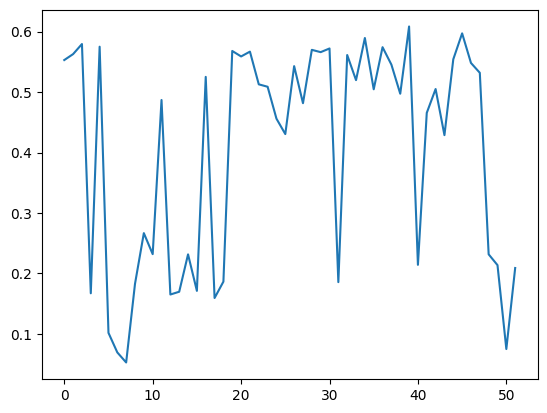

[PPO] Epoch 0: Loss=99.9047, Policy=0.0152, Value=199.8522
[PPO] Epoch 10: Loss=30.3247, Policy=-0.0065, Value=60.7339
[PPO] Epoch 20: Loss=16.0477, Policy=-0.0325, Value=32.2301
[PPO] Epoch 30: Loss=7.5979, Policy=-0.0641, Value=15.3918
Approx KL Learned: 0.07055783271789551
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 14/100 — steps: 2048


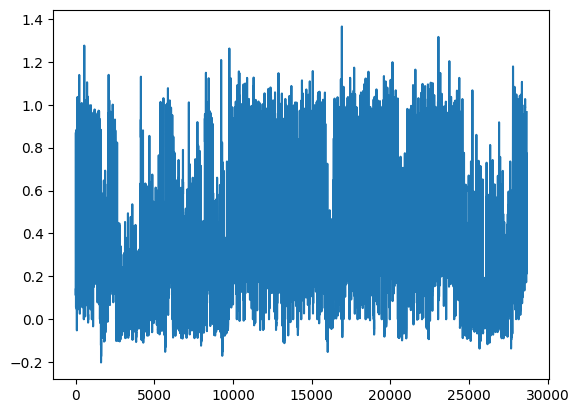

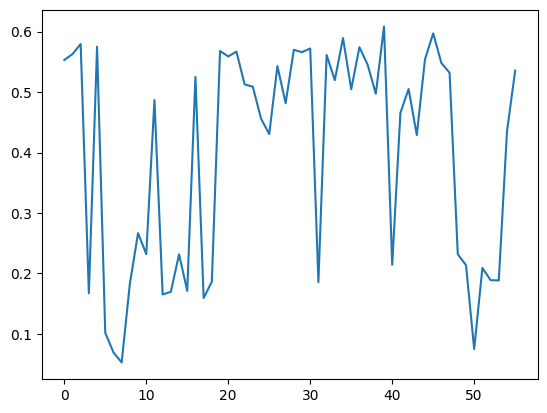

[PPO] Epoch 0: Loss=74.2911, Policy=0.0158, Value=148.5963
[PPO] Epoch 10: Loss=24.2394, Policy=0.0024, Value=48.5170
[PPO] Epoch 20: Loss=12.3052, Policy=-0.0305, Value=24.7164
[PPO] Epoch 30: Loss=5.3260, Policy=-0.0541, Value=10.8024
Approx KL Learned: 0.07560886442661285
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 15/100 — steps: 2048


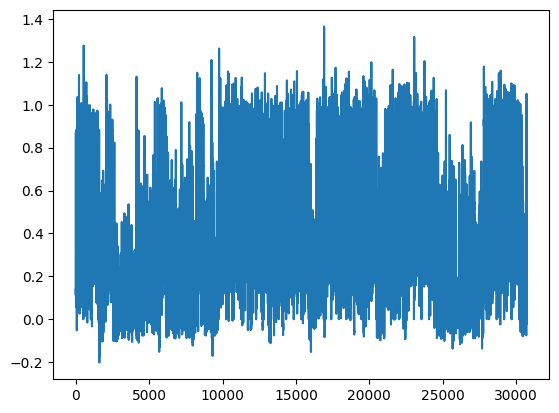

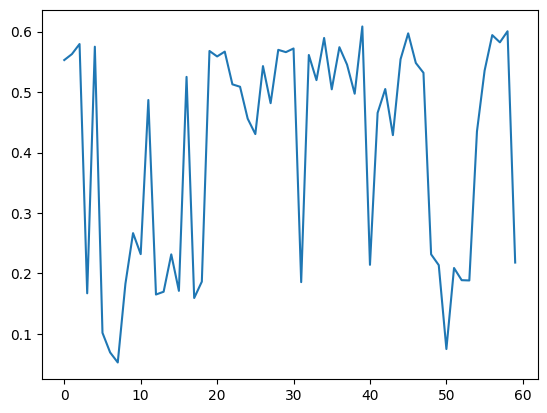

[PPO] Epoch 0: Loss=99.5007, Policy=0.0175, Value=199.0437
[PPO] Epoch 10: Loss=51.2556, Policy=0.0161, Value=102.5555
[PPO] Epoch 20: Loss=28.4018, Policy=-0.0135, Value=56.9118
[PPO] Epoch 30: Loss=18.2535, Policy=-0.0387, Value=36.6624
Approx KL Learned: 0.07141362130641937
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 16/100 — steps: 2048


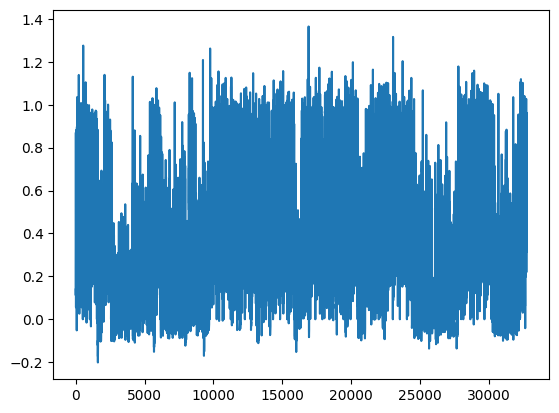

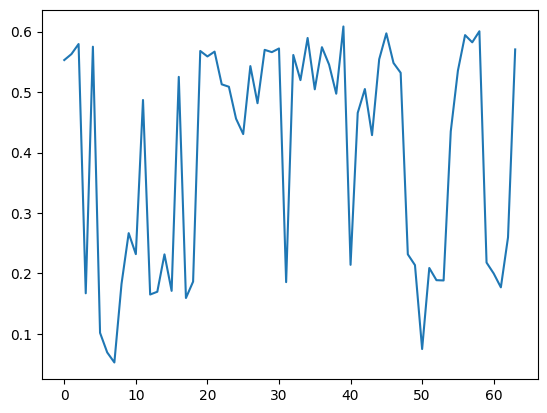

[PPO] Epoch 0: Loss=101.2782, Policy=0.0195, Value=202.5395
[PPO] Epoch 10: Loss=35.3122, Policy=0.0102, Value=70.6260
[PPO] Epoch 20: Loss=20.6400, Policy=-0.0128, Value=41.3399
[PPO] Epoch 30: Loss=10.2932, Policy=-0.0219, Value=20.6728
Approx KL Learned: 0.18926341831684113
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 17/100 — steps: 2048


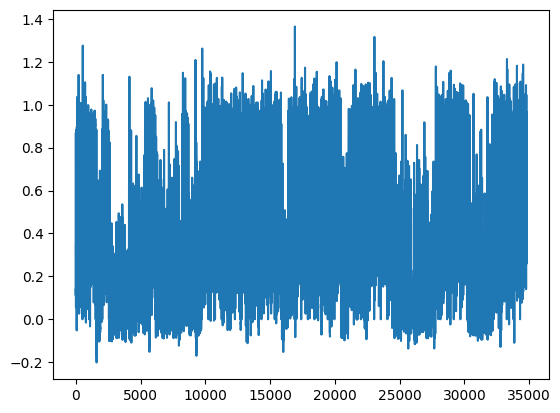

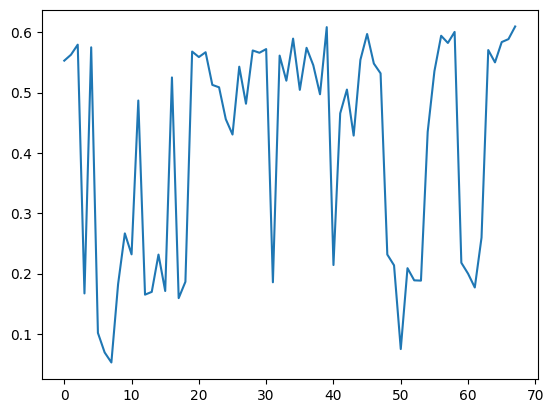

[PPO] Epoch 0: Loss=125.1981, Policy=0.0150, Value=250.4429
[PPO] Epoch 10: Loss=51.4357, Policy=0.0193, Value=102.9107
[PPO] Epoch 20: Loss=24.4931, Policy=-0.0243, Value=49.1127
[PPO] Epoch 30: Loss=12.9927, Policy=-0.0386, Value=26.1442
Approx KL Learned: 0.09935830533504486
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 18/100 — steps: 2048


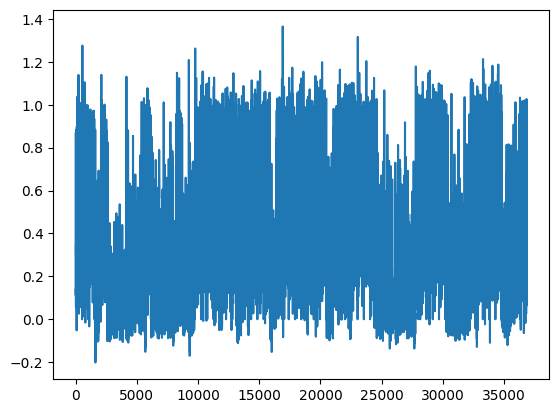

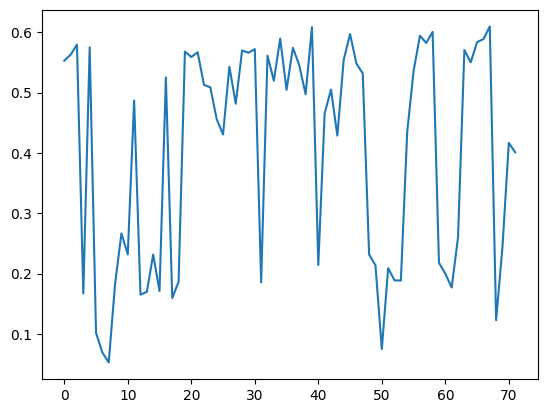

[PPO] Epoch 0: Loss=92.3569, Policy=0.0088, Value=184.7599
[PPO] Epoch 10: Loss=42.0963, Policy=-0.0051, Value=84.2636
[PPO] Epoch 20: Loss=23.7494, Policy=-0.0220, Value=47.6021
[PPO] Epoch 30: Loss=12.9891, Policy=-0.0421, Value=26.1217
Approx KL Learned: 0.038148850202560425
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 19/100 — steps: 2048


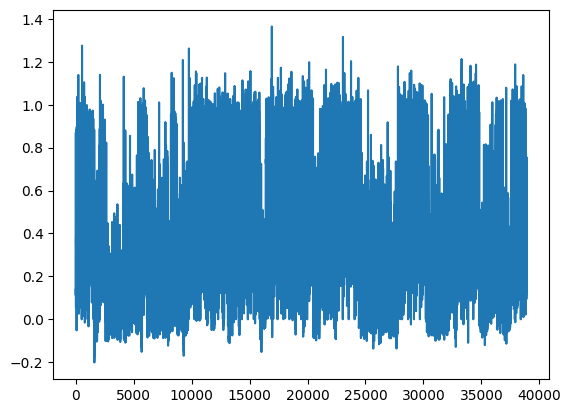

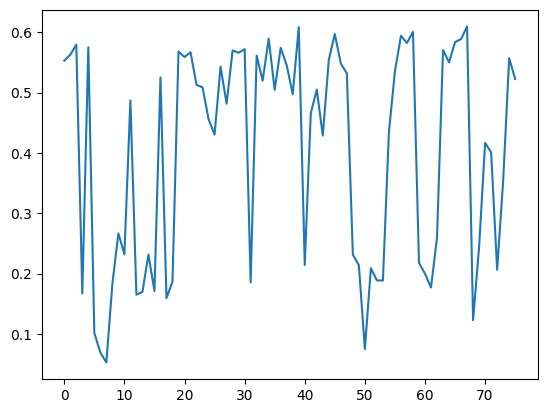

[PPO] Epoch 0: Loss=98.2755, Policy=0.0055, Value=196.5950
[PPO] Epoch 10: Loss=31.5976, Policy=-0.0056, Value=63.2594
[PPO] Epoch 20: Loss=19.7369, Policy=-0.0297, Value=39.5866
[PPO] Epoch 30: Loss=12.2691, Policy=-0.0438, Value=24.6804
Approx KL Learned: 0.05399185046553612
[✅] Actor-Critic checkpoint saved to chkpoint_19.pt
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 20/100 — steps: 2048


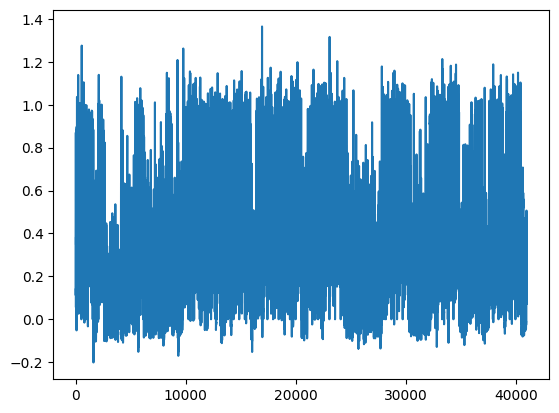

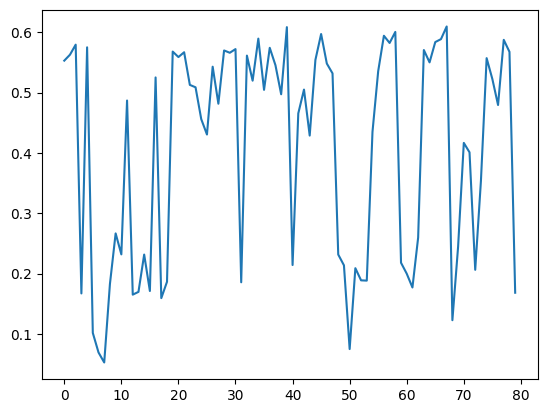

[PPO] Epoch 0: Loss=73.3421, Policy=0.0106, Value=146.6986
[PPO] Epoch 10: Loss=28.9853, Policy=-0.0035, Value=58.0151
[PPO] Epoch 20: Loss=16.0031, Policy=-0.0198, Value=32.0874
[PPO] Epoch 30: Loss=10.5490, Policy=-0.0287, Value=21.2062
Approx KL Learned: 0.08354903757572174
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 21/100 — steps: 2048


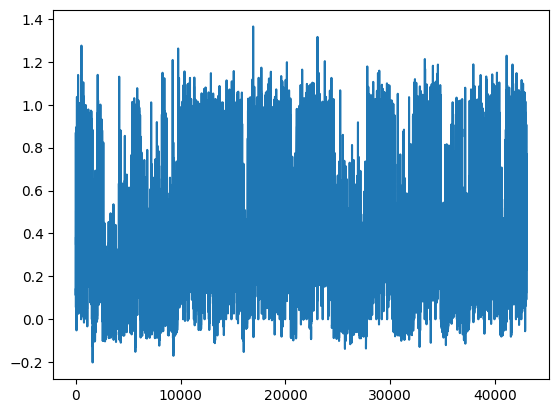

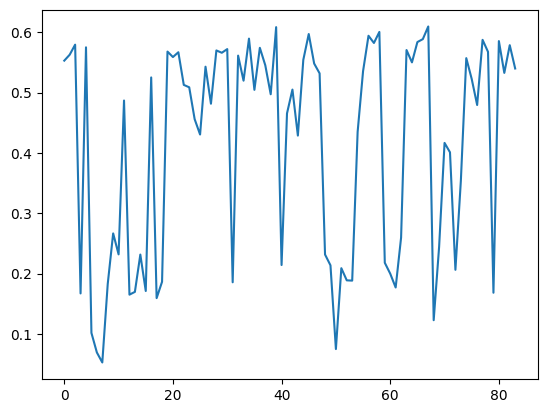

[PPO] Epoch 0: Loss=124.6062, Policy=0.0134, Value=249.2467
[PPO] Epoch 10: Loss=47.6075, Policy=-0.0054, Value=95.2822
[PPO] Epoch 20: Loss=28.0017, Policy=-0.0213, Value=56.1095
[PPO] Epoch 30: Loss=17.5199, Policy=-0.0309, Value=35.1656
Approx KL Learned: 0.15578165650367737
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 22/100 — steps: 2048


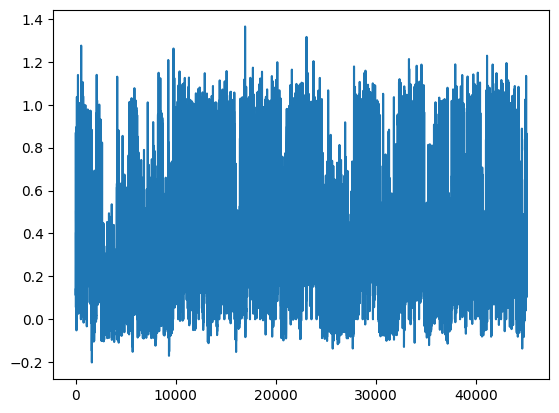

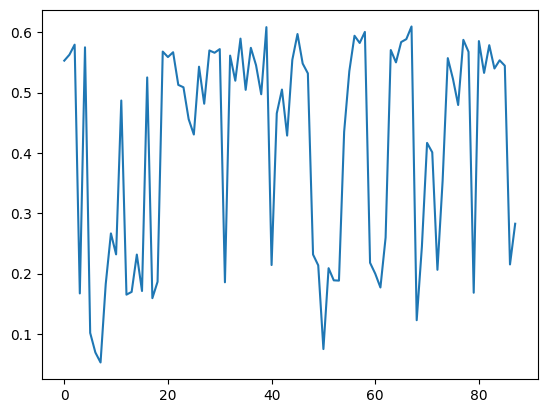

[PPO] Epoch 0: Loss=55.8482, Policy=0.0189, Value=111.6990
[PPO] Epoch 10: Loss=22.5364, Policy=0.0022, Value=45.1131
[PPO] Epoch 20: Loss=11.9368, Policy=-0.0282, Value=23.9766
[PPO] Epoch 30: Loss=12.7988, Policy=-0.0341, Value=25.7102
Approx KL Learned: 0.10570017248392105
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 23/100 — steps: 2048


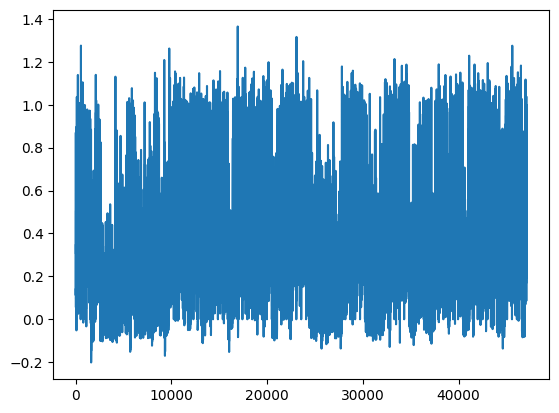

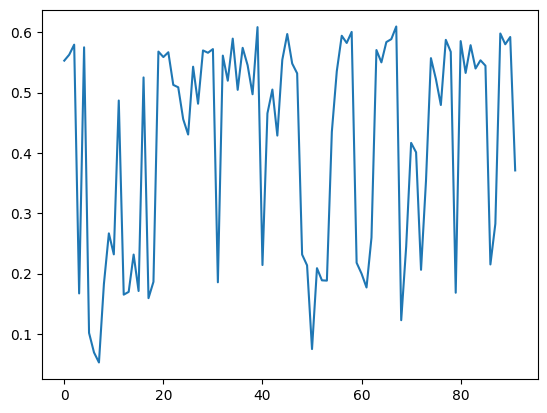

[PPO] Epoch 0: Loss=33.1066, Policy=0.0120, Value=66.2283
[PPO] Epoch 10: Loss=18.4110, Policy=0.0018, Value=36.8537
[PPO] Epoch 20: Loss=11.7801, Policy=-0.0195, Value=23.6396
[PPO] Epoch 30: Loss=7.4449, Policy=-0.0349, Value=15.0013
Approx KL Learned: 0.07244516909122467
[✅] Actor-Critic checkpoint saved to clip_actor_critic_checkpoint_long_training.pt
Update 24/100 — steps: 2048


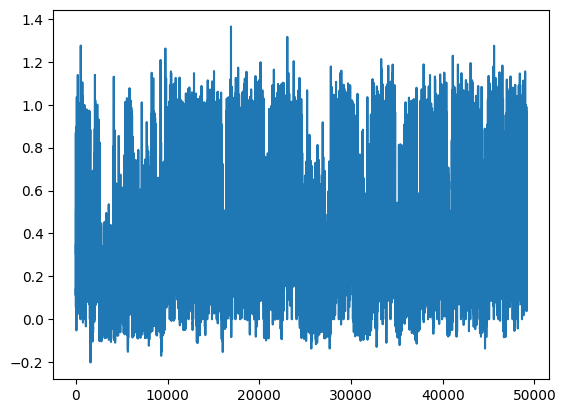

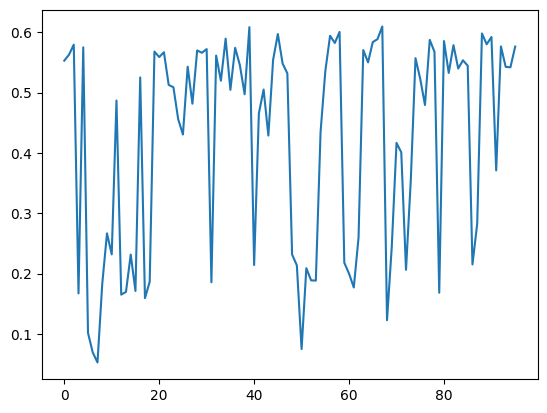

KeyboardInterrupt: 

In [12]:
buf, rewards = train(controller, "clip_actor_critic_checkpoint_long_training.pt", ppo, clip_env, clip_actor_critic, 100)

In [8]:
from rl import load_actor_critic

load_actor_critic(clip_actor_critic, "chkpoint_99.pt")

[🔁] Actor-Critic checkpoint loaded from chkpoint_99.pt


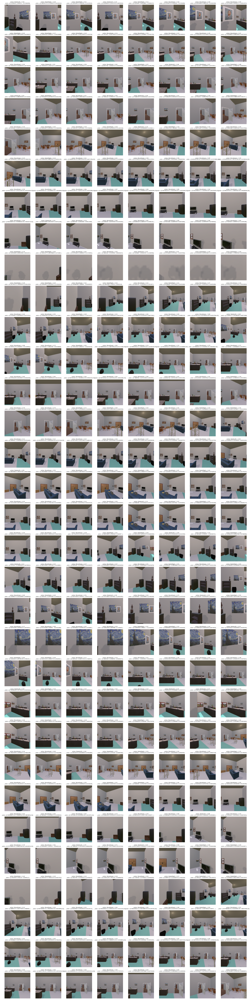

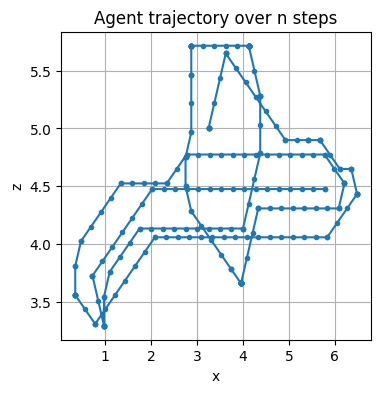

[tensor([[[0.5804, 0.5804, 0.5804,  ..., 0.3686, 0.3686, 0.3686],
          [0.5804, 0.5804, 0.5804,  ..., 0.3686, 0.3686, 0.3686],
          [0.5804, 0.5804, 0.5804,  ..., 0.3647, 0.3647, 0.3647],
          ...,
          [0.1608, 0.1608, 0.1608,  ..., 0.4235, 0.4235, 0.4235],
          [0.1608, 0.1608, 0.1608,  ..., 0.4196, 0.4196, 0.4196],
          [0.1608, 0.1608, 0.1608,  ..., 0.4118, 0.4157, 0.4196]],
 
         [[0.5490, 0.5490, 0.5490,  ..., 0.3412, 0.3412, 0.3412],
          [0.5490, 0.5490, 0.5490,  ..., 0.3412, 0.3412, 0.3412],
          [0.5490, 0.5490, 0.5490,  ..., 0.3412, 0.3412, 0.3412],
          ...,
          [0.1333, 0.1333, 0.1333,  ..., 0.6118, 0.6118, 0.6157],
          [0.1333, 0.1333, 0.1333,  ..., 0.6078, 0.6078, 0.6078],
          [0.1333, 0.1333, 0.1333,  ..., 0.6000, 0.6078, 0.6078]],
 
         [[0.5569, 0.5569, 0.5569,  ..., 0.2863, 0.2824, 0.2824],
          [0.5569, 0.5569, 0.5569,  ..., 0.2824, 0.2824, 0.2824],
          [0.5569, 0.5569, 0.5569,  ...,

In [27]:
from cons import ACTIONS
from collections import deque
import matplotlib.pyplot as plt
import numpy as np
from typing import Callable
import imageio


def inference(get_distribution: Callable[[torch.Tensor, ActorCritic], torch.distributions.Categorical], init_position: dict[str, float], env: Env, actor_critic: ActorCritic, plot=True):
    n = 256
    n_row = 32
    positions = []

    plt.figure(figsize=(n // n_row * 2, n_row * 2))
    event = teleport(controller, init_position)
    episode_seq = deque(maxlen=EPISODE_STEPS)
    actions_seq = deque(maxlen=EPISODE_STEPS)
    raw_obs = []
    for t in range(1, n + 1):
        positions.append([event.metadata["agent"]["position"]["x"], event.metadata["agent"]["position"]["z"]])
        with torch.no_grad():
            obs_t = ppo.obs_from_event(event)  # (C,H,W)
            obs_t_encoded = actor_critic.actor_critic_encoder(obs_t.unsqueeze(0).unsqueeze(0)).squeeze(0).squeeze(0)
            obs_seq = torch.stack(list(episode_seq) + [obs_t_encoded], dim=0).to(device=DEVICE)

        if len(actions_seq) == 0:
            actions_seq.append(torch.randint(0, NUM_ACTIONS, (1, 1)).item())
        
        actions_tensor = torch.tensor(actions_seq, dtype=torch.long, device=DEVICE).unsqueeze(0)
        dist = get_distribution(obs_seq, actions_tensor, actor_critic)
        action_idx = dist.sample()
        logp = dist.log_prob(action_idx)
        
        action_idx, logp = action_idx.item(), logp.item()
        event, reward = env.step_env(controller, action_idx)

        # store one step
        episode_seq.append(obs_t_encoded)
        actions_seq.append(action_idx)
        raw_obs.append(obs_t)
        
        if plot:
            # Plot frame and action
            plt.subplot(n_row, n // n_row, t)
            plt.title("action: " + ACTIONS[action_idx] + ", r: " + f"{reward:.2f}" + "\n, prob = " + f"{torch.exp(dist.log_prob(torch.tensor([0, 1, 2], device=DEVICE))).cpu().numpy()}", fontsize=5)
            plt.axis(False)
            plt.imshow(event.frame)
    if plot:
        plt.tight_layout()
        plt.show()
        
        # ---- Plot 2D trajectory of the agent ----
        positions = np.array(positions)
        plt.figure(figsize=(4, 4))
        plt.plot(positions[:, 0], positions[:, 1], "-o", markersize=3)
        plt.xlabel("x")
        plt.ylabel("z")
        plt.title("Agent trajectory over n steps")
        plt.grid(True)
        plt.show()

    return raw_obs

def inference_video_mp4(
    get_distribution,
    init_position: dict[str, float],
    env: Env,
    actor_critic: ActorCritic,
    video_path="rollout.mp4",
    fps=10,
    n_steps=256
):
    episode_seq = deque(maxlen=EPISODE_STEPS)
    actions_seq = deque(maxlen=EPISODE_STEPS)

    writer = imageio.get_writer(video_path, fps=fps)

    # start episode
    event = teleport(controller, init_position)
    positions = []

    for t in range(1, n_steps + 1):

        # ---- Add current frame to video ----
        writer.append_data(event.frame)   # convert RGB→BGR if needed

        # track positions
        positions.append([
            event.metadata["agent"]["position"]["x"],
            event.metadata["agent"]["position"]["z"],
        ])

        with torch.no_grad():
            obs_t = ppo.obs_from_event(event)  
            obs_enc = actor_critic.actor_critic_encoder(
                obs_t.unsqueeze(0).unsqueeze(0)
            ).squeeze(0).squeeze(0)

            obs_seq = torch.stack(
                list(episode_seq) + [obs_enc], dim=0
            ).to(DEVICE)

        # ---- Action ----
        if len(actions_seq) == 0:
            actions_seq.append(torch.randint(0, NUM_ACTIONS, ()).item())

        actions_tensor = torch.tensor(
            actions_seq, dtype=torch.long, device=DEVICE
        ).unsqueeze(0)

        dist = get_distribution(obs_seq, actions_tensor, actor_critic)
        action_idx = dist.sample().item()

        # ---- Step env ----
        event, reward = env.step_env(controller, action_idx)

        # ---- Store ----
        episode_seq.append(obs_enc)
        actions_seq.append(action_idx)

    writer.close()
    print(f"[🎞️] Saved video to {video_path}")

    return positions


def get_distributions(obs_seq, actions_tensor, clip_actor_critic):
    logits, value = ppo.act_and_value(obs_seq, actions_tensor, clip_actor_critic)
    dist = torch.distributions.Categorical(logits=logits)
    return dist

event = teleport(controller)
init_pos = event.metadata["agent"]["position"]
init_pos = {'x': 3.25, 'y': 0.9009997844696045, 'z': 5.0}
inference(get_distributions, init_pos, clip_env, clip_actor_critic)

In [34]:
!pip install imageio imageio-ffmpeg

In [22]:
import clip

model, preprocess = clip.load("ViT-B/32", device=DEVICE)

In [23]:
import torch
import torch.nn.functional as F
import random

def preprocess_clip(x):
    # Resize to CLIP resolution
    x = F.interpolate(x, size=(224, 224), mode="bilinear", align_corners=False)
    # Normalize (CLIP standard mean/std)
    mean = torch.tensor([0.48145466, 0.4578275, 0.40821073], device=x.device).view(1, 3, 1, 1)
    std  = torch.tensor([0.26862954, 0.26130258, 0.27577711], device=x.device).view(1, 3, 1, 1)
    return (x - mean) / std

def get_average(input_img):
    # ---- 1. Sample 50 random images ----
    n = min(50, len(input_img))
    indices = random.sample(range(len(input_img)), n)
    imgs = torch.stack([input_img[i] for i in indices]).to(DEVICE)  # (50, 3, H, W)

    # ---- 2. Preprocess for CLIP ----
    imgs_clip = preprocess_clip(imgs).half()  # normalized, resized

    # ---- 3. Encode with CLIP visual encoder ----
    with torch.no_grad():
        embeds = model.visual(imgs_clip)       # (50, D)
        embeds = embeds / embeds.norm(dim=-1, keepdim=True)  # normalize to unit sphere

    # ---- 4. Compute cosine similarity ----
    sim_matrix = embeds @ embeds.T             # (50, 50)
    # Optional: remove self-similarity (diagonal = 1)
    sim_matrix.fill_diagonal_(0)

    # ---- 5. Summary statistics ----
    mean_sim = sim_matrix.mean().item()

    return mean_sim

for i in range(5):

    event = teleport(controller)
    init_pos = event.metadata["agent"]["position"]
    
    def get_distributions(obs_seq, actions_tensor, clip_actor_critic):
        logits, value = ppo.act_and_value(obs_seq, actions_tensor, clip_actor_critic)
        dist = torch.distributions.Categorical(logits=logits)
        return dist

    policy = inference(get_distributions, init_pos, clip_env, clip_actor_critic, False)

    def get_distributions(obs_seq, actions_tensor, clip_actor_critic):
        dist = torch.distributions.Categorical(probs=torch.tensor([0.5, 0.25, 0.25], device=DEVICE))
        return dist

    rand_policy = inference(get_distributions, init_pos, clip_env, clip_actor_critic, False)

    mean_policies = []
    mean_rands = []
    for i in range(10):
        mean_policy = get_average(policy)
        mean_rand = get_average(rand_policy)
        mean_policies.append(mean_policy)
        mean_rands.append(mean_rand)
    
    print("Policy: " + str(np.mean(np.array(mean_policies))))
    print("Rand: " + str(np.mean(np.array(mean_rands))))



Policy: 0.877001953125
Rand: 0.86337890625
Policy: 0.87021484375
Rand: 0.8068359375
Policy: 0.83388671875
Rand: 0.845361328125
Policy: 0.8791015625
Rand: 0.876318359375
Policy: 0.80693359375
Rand: 0.79033203125


<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>

<Figure size 1600x6400 with 0 Axes>